In [1]:
import pandas as pd
from google.cloud import storage
import io
import seaborn as sns
import matplotlib.pyplot as plt


In [2]:
# Initialize the Google Cloud Storage client
client = storage.Client()

# Reference the bucket and the folder where your data is stored
bucket_name = 'ethereum-research'
folder_name = 'mainnet_data'
bucket = client.get_bucket(bucket_name)

In [3]:
# Define the bucket path to the file
file_path_mainnet = f'gs://{bucket_name}/daily_stuff_mainnet.csv'
file_path_arbitrum = f'gs://{bucket_name}/daily_stuff_arbitrum.csv'

# Read the CSV file directly from Google Cloud Storage
df_mainnet = pd.read_csv(file_path_mainnet)
df_arbitrum = pd.read_csv(file_path_arbitrum)

In [4]:
df_mainnet['total_value'] = df_mainnet['avg_value_eth'] * df_mainnet['num_transactions']
df_mainnet['total_gas'] = df_mainnet['avg_gas'] * df_mainnet['num_transactions']
df_arbitrum['total_value'] = df_arbitrum['avg_value_eth'] * df_arbitrum['num_transactions']
df_arbitrum['total_gas'] = df_arbitrum['avg_gas'] * df_arbitrum['num_transactions']
    

In [6]:
# remove weird outliers... should understand what's creating them to begin with
df_arbitrum = df_arbitrum[df_arbitrum['avg_value_eth'] < 100]

In [9]:
# Function to calculate and add percent change columns
def add_percent_change_columns(df):
    for col in df.columns:
        if col != 'date':  # Skip the 'date' column as it's not numerical
            df[f'{col}_pct_change'] = df[col].pct_change()
    return df

# Apply the function to both dataframes
df_arbitrum = add_percent_change_columns(df_arbitrum)
df_mainnet = add_percent_change_columns(df_mainnet)


In [10]:
# Create new dataframes with the transformed data
# Make sure to align the dates since we dropped some rows with pct_change()
# df_mainnet['total_gas_pct'] = df_mainnet['total_gas'].pct_change()
# df_arbitrum['total_gas_pct'] = df_arbitrum['total_gas'].pct_change()

df_mainnet = df_mainnet.dropna()
df_arbitrum = df_arbitrum.dropna()

In [11]:
df_arbitrum.columns

Index(['date', 'avg_value_eth', 'avg_value_lossless_eth', 'avg_gas',
       'avg_gas_price_eth', 'num_transactions', 'total_value', 'total_gas',
       'avg_value_eth_pct_change', 'avg_value_lossless_eth_pct_change',
       'avg_gas_pct_change', 'avg_gas_price_eth_pct_change',
       'num_transactions_pct_change', 'total_value_pct_change',
       'total_gas_pct_change'],
      dtype='object')

In [12]:
df_mainnet.columns

Index(['date', 'avg_value_eth', 'avg_value_lossless_eth', 'avg_gas',
       'avg_gas_price_eth', 'num_transactions', 'total_value', 'total_gas',
       'avg_value_eth_pct_change', 'avg_value_lossless_eth_pct_change',
       'avg_gas_pct_change', 'avg_gas_price_eth_pct_change',
       'num_transactions_pct_change', 'total_value_pct_change',
       'total_gas_pct_change'],
      dtype='object')

In [20]:
from utils import check_stationarity_for_dataframe
stationary_results_main = check_stationarity_for_dataframe(df_mainnet)
stationary_results_arb = check_stationarity_for_dataframe(df_arbitrum)

Skipping non-numeric column: date

=== Stationarity Test for avg_value_eth ===
ADF Statistic: -3.3280680810997003
p-value: 0.013669510320577208
Critical values:
	1%: -3.432618675186974
	5%: -2.8625423474529024
	10%: -2.5673035783905878
Is stationary: True

=== Stationarity Test for avg_value_lossless_eth ===
ADF Statistic: -3.3280680810997003
p-value: 0.013669510320577208
Critical values:
	1%: -3.432618675186974
	5%: -2.8625423474529024
	10%: -2.5673035783905878
Is stationary: True

=== Stationarity Test for avg_gas ===
ADF Statistic: -2.0046935217417983
p-value: 0.2845189530099931
Critical values:
	1%: -3.4326178883893763
	5%: -2.862541999961805
	10%: -2.567303393388591
Is stationary: False

=== Stationarity Test for avg_gas_price_eth ===
ADF Statistic: -3.7468040935372064
p-value: 0.0035009578311816615
Critical values:
	1%: -3.432617102137327
	5%: -2.8625416527115592
	10%: -2.567303208514837
Is stationary: True

=== Stationarity Test for num_transactions ===
ADF Statistic: -1.9844713

In [23]:
cols_main = [k for k,v in stationary_results_main.items() if v]

In [24]:
cols_arb = [k for k,v in stationary_results_arb.items() if v]

In [17]:
    df_arbitrum = df_arbitrum.set_index('date')
    df_mainnet = df_mainnet.set_index('date')

In [26]:
import numpy as np
import pandas as pd
from tigramite import data_processing as pp
from tigramite.pcmci import PCMCI
from tigramite.independence_tests.parcorr import ParCorr
from tigramite import plotting as tp
import matplotlib.pyplot as plt

def analyze_timeseries_dependency(df1, df2, col1, col2, 
                                name1='series1', name2='series2',
                                tau_max=20):
    """
    Analyze dependency between two time series columns using PCMCI and create
    lag dependency plots using tigramite's plotting functions.
    
    Parameters:
    -----------
    df1 : pandas.DataFrame
        First DataFrame containing the time series (with date index)
    df2 : pandas.DataFrame
        Second DataFrame containing the time series (with date index)
    col1 : str
        Column name from df1 to analyze
    col2 : str
        Column name from df2 to analyze
    name1 : str, optional
        Display name for the first series (default: 'series1')
    name2 : str, optional
        Display name for the second series (default: 'series2')
    tau_max : int, optional
        Maximum time lag to test (default: 20)
        
    Returns:
    --------
    tuple
        (correlations, fig) containing the correlation results and matplotlib figure
    """
    # Validate input
    if col1 not in df1.columns:
        raise ValueError(f"Column '{col1}' not found in first DataFrame")
    if col2 not in df2.columns:
        raise ValueError(f"Column '{col2}' not found in second DataFrame")
        
    # Extract and align the time series
    common_dates = df1.index.intersection(df2.index)
    if len(common_dates) == 0:
        raise ValueError("No common dates found between the two DataFrames")
        
    data1 = df1.loc[common_dates, col1].values.reshape(-1, 1)
    data2 = df2.loc[common_dates, col2].values.reshape(-1, 1)
    
    # Combine the data
    combined_data = np.hstack([data1, data2])
    
    # Create tigramite dataframe
    var_names = [name1, name2]
    dataframe = pp.DataFrame(combined_data, 
                           datatime=np.arange(len(common_dates)),
                           var_names=var_names)
    
    # Initialize PCMCI with ParCorr independence test
    parcorr = ParCorr(significance='analytic')
    pcmci = PCMCI(dataframe=dataframe, 
                  cond_ind_test=parcorr,
                  verbosity=1)
    
    # Run bivariate analysis
    correlations = pcmci.run_bivci(tau_max=tau_max, 
                                  tau_min=0,
                                  val_only=True)['val_matrix']
    
    # Setup plot parameters
    setup_args = {'var_names': var_names,
                 'figsize': (10, 6),
                 'x_base': 5,
                 'y_base': .5}
    
    # Create plot
    fig = plt.figure(figsize=(10, 6))
    lag_func_matrix = tp.plot_lagfuncs(val_matrix=correlations,
                                      setup_args=setup_args)
    
    plt.title(f'Time Series Dependencies: {name1} vs {name2}')
    plt.tight_layout()
    
    return correlations, fig

def plot_dependency_network(df1, df2, col1, col2, 
                          name1='series1', name2='series2',
                          tau_max=3):
    """
    Create a network visualization of dependencies between time series.
    
    Parameters:
    -----------
    df1 : pandas.DataFrame
        First DataFrame containing the time series (with date index)
    df2 : pandas.DataFrame
        Second DataFrame containing the time series (with date index)
    col1 : str
        Column name from df1 to analyze
    col2 : str
        Column name from df2 to analyze
    name1 : str, optional
        Display name for the first series (default: 'series1')
    name2 : str, optional
        Display name for the second series (default: 'series2')
    tau_max : int, optional
        Maximum time lag to test (default: 3)
        
    Returns:
    --------
    tuple
        (correlations, fig) containing the correlation results and matplotlib figure
    """
    # Extract data (same as above)
    common_dates = df1.index.intersection(df2.index)
    data1 = df1.loc[common_dates, col1].values.reshape(-1, 1)
    data2 = df2.loc[common_dates, col2].values.reshape(-1, 1)
    
    combined_data = np.hstack([data1, data2])
    var_names = [name1, name2]
    dataframe = pp.DataFrame(combined_data, 
                           datatime=np.arange(len(common_dates)),
                           var_names=var_names)
    
    # Initialize PCMCI
    parcorr = ParCorr(significance='analytic')
    pcmci = PCMCI(dataframe=dataframe, 
                  cond_ind_test=parcorr,
                  verbosity=1)
    
    # Run analysis
    correlations = pcmci.run_bivci(tau_max=tau_max, 
                                  tau_min=0,
                                  val_only=True)['val_matrix']
    
    # Create network plot
    fig, ax = plt.subplots(figsize=(8, 6))
    
    tp.plot_graph(
        val_matrix=correlations,
        var_names=var_names,
        link_colorbar_label='cross-correlation',
        node_colorbar_label='auto-correlation',
        label_fontsize=10,
        link_width=2.0,
        node_size=0.3
    )
    
    plt.title(f'Network Dependencies: {name1} vs {name2}')
    plt.tight_layout()
    
    return correlations, fig

In [27]:
import importlib
import utils
importlib.reload(utils)


<module 'utils' from '/home/jupyter/utils.py'>


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


<Figure size 1000x600 with 0 Axes>

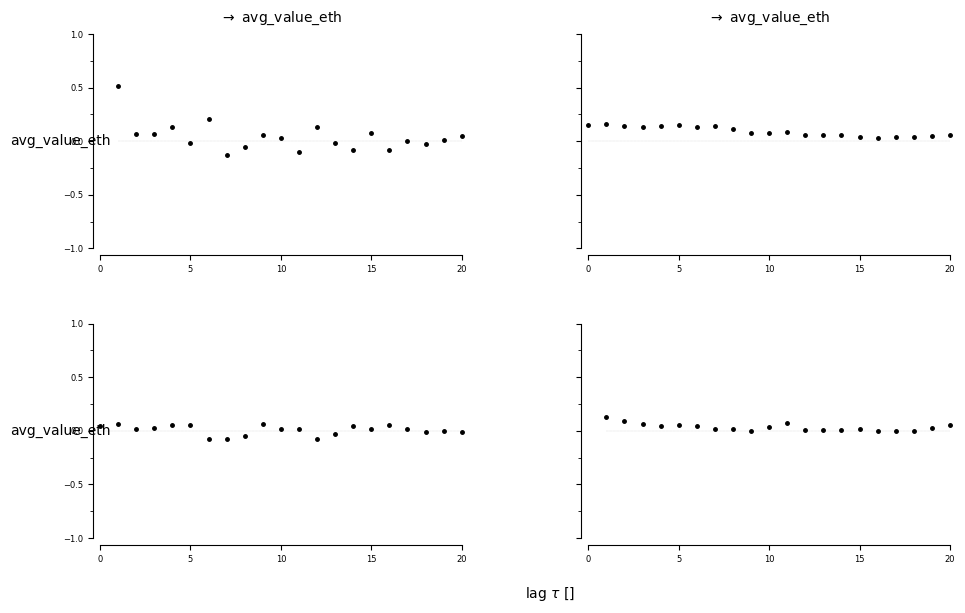


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


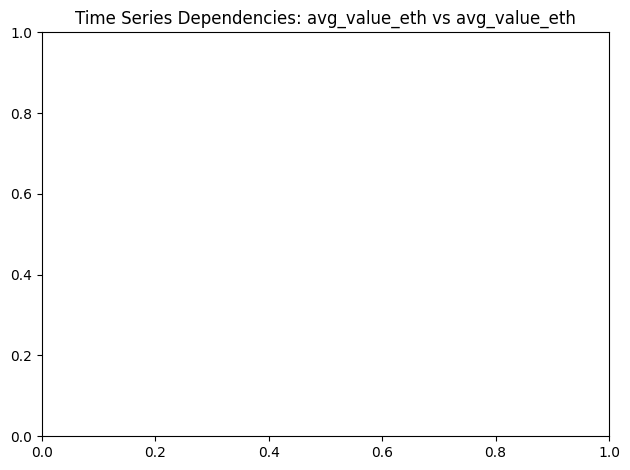

<Figure size 1000x600 with 0 Axes>

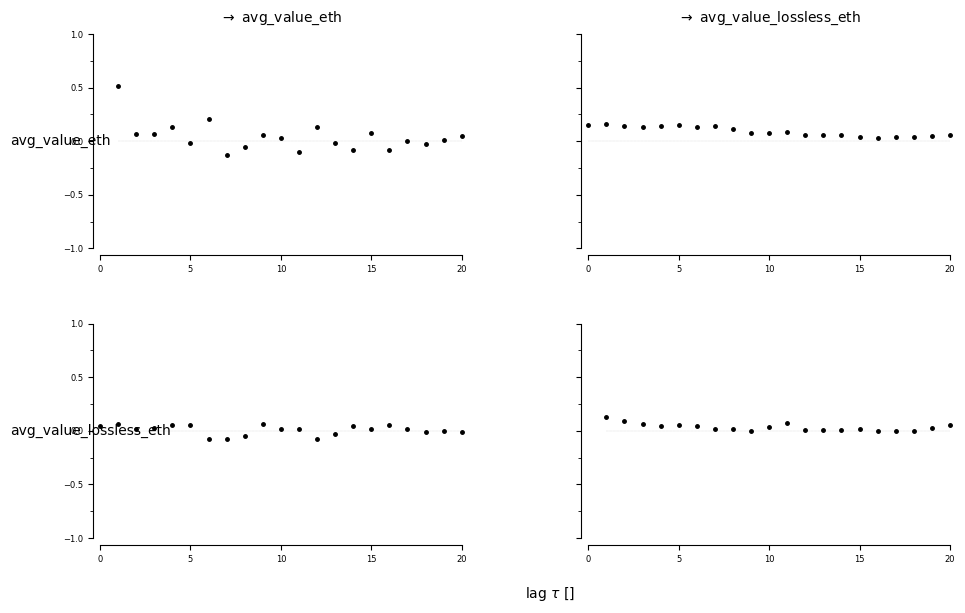


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


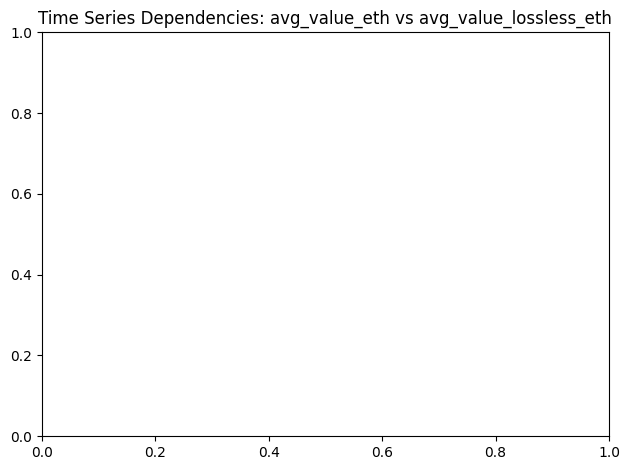

<Figure size 1000x600 with 0 Axes>

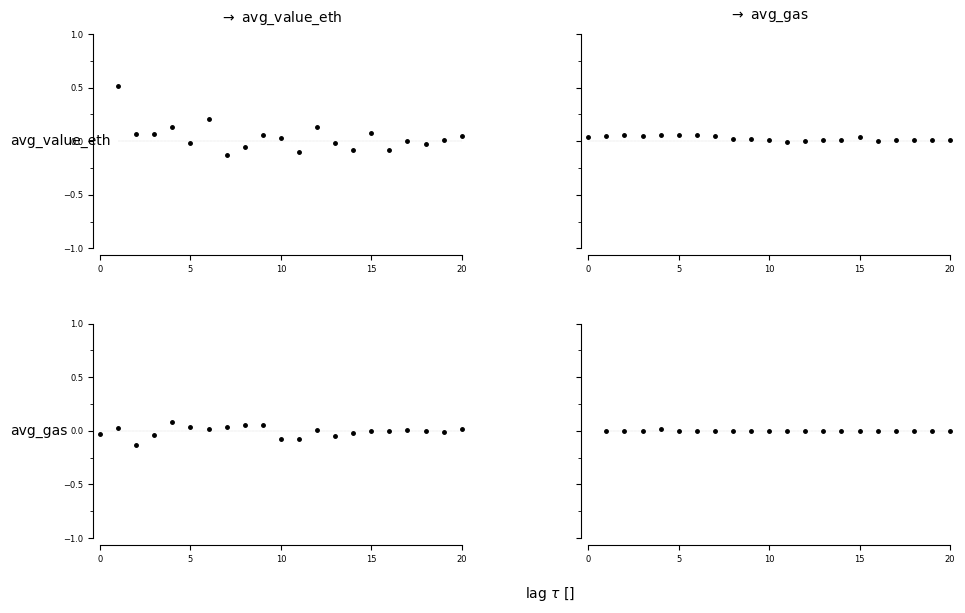


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


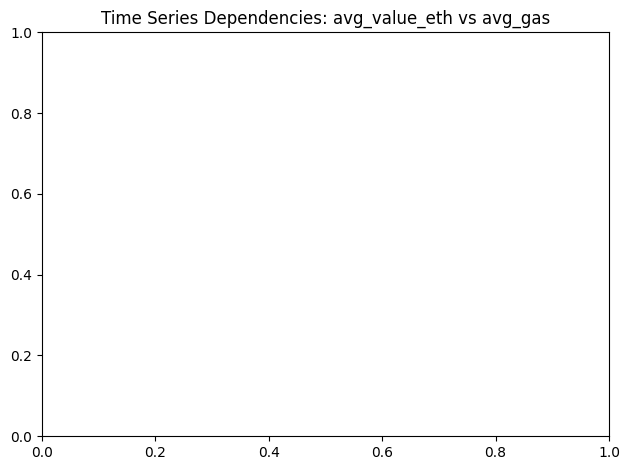

<Figure size 1000x600 with 0 Axes>

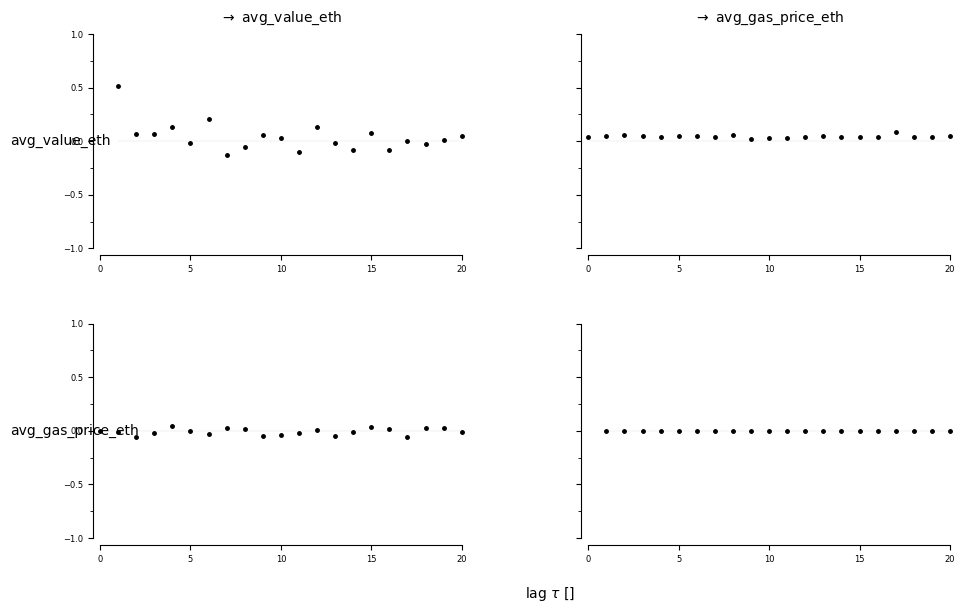


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


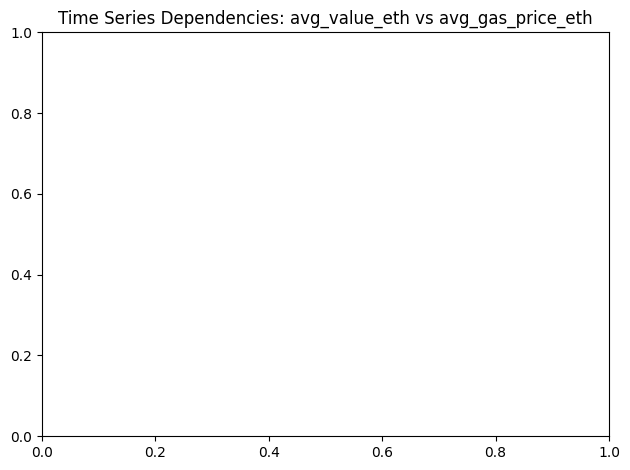

<Figure size 1000x600 with 0 Axes>

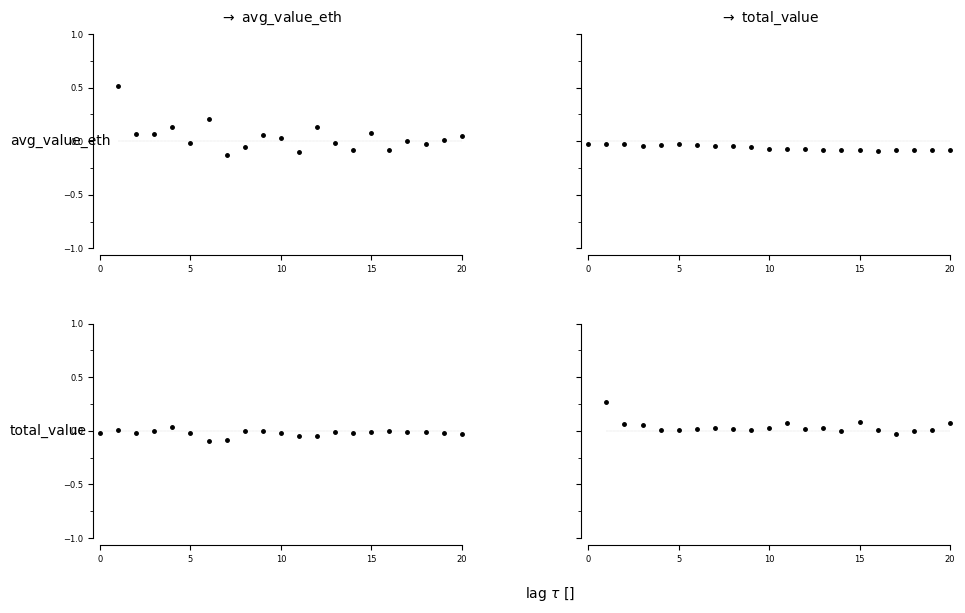


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


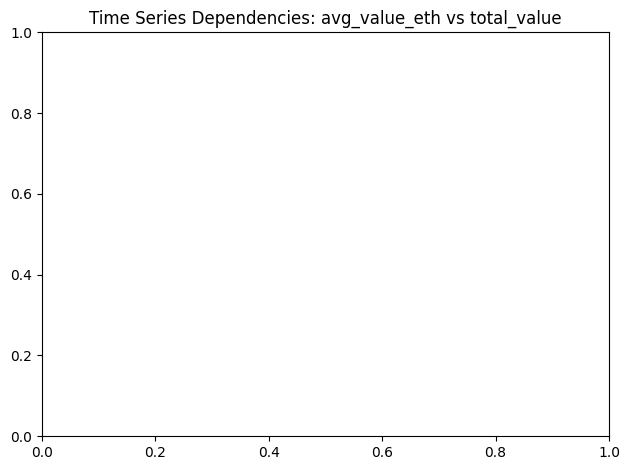

<Figure size 1000x600 with 0 Axes>

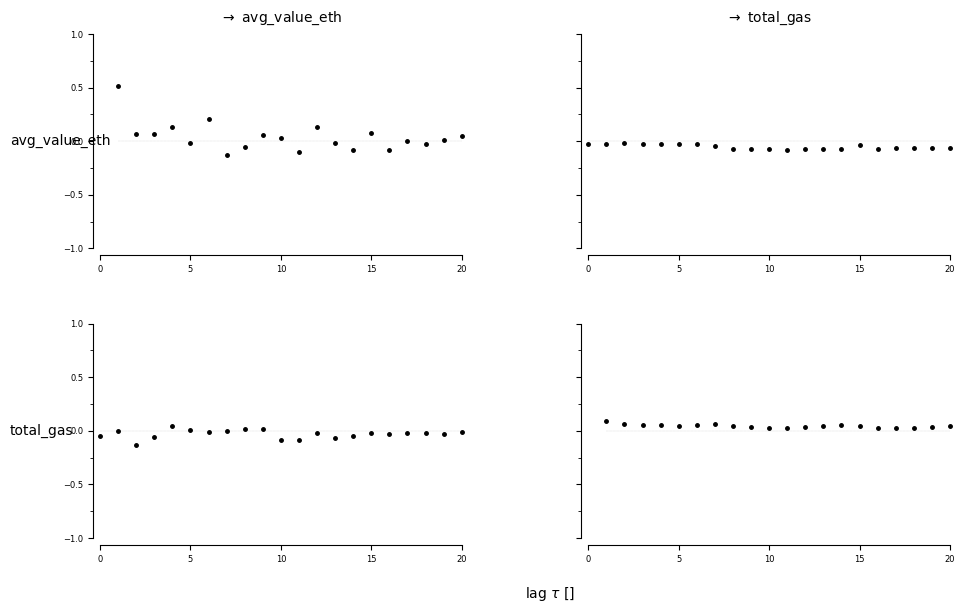


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


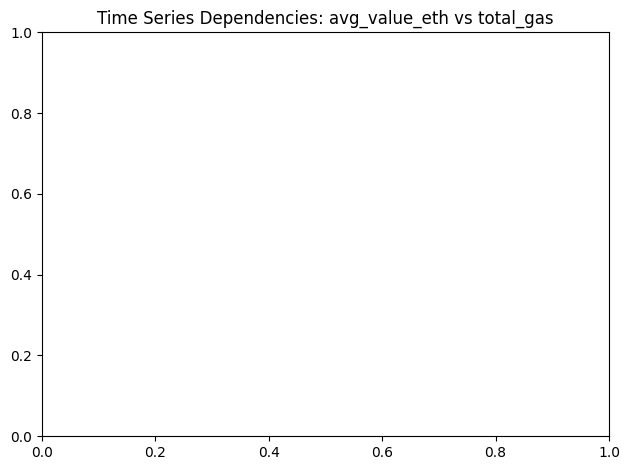

<Figure size 1000x600 with 0 Axes>

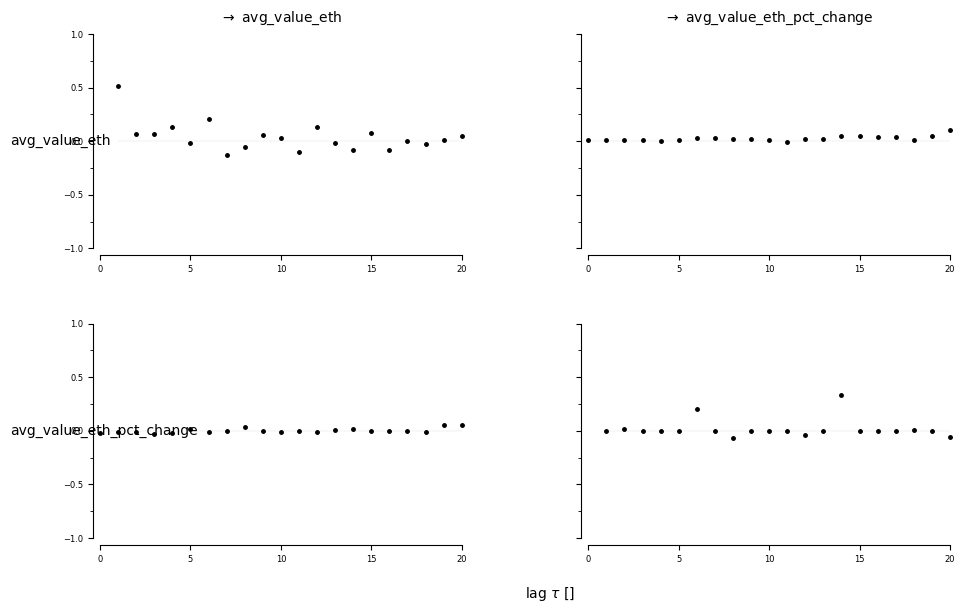


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


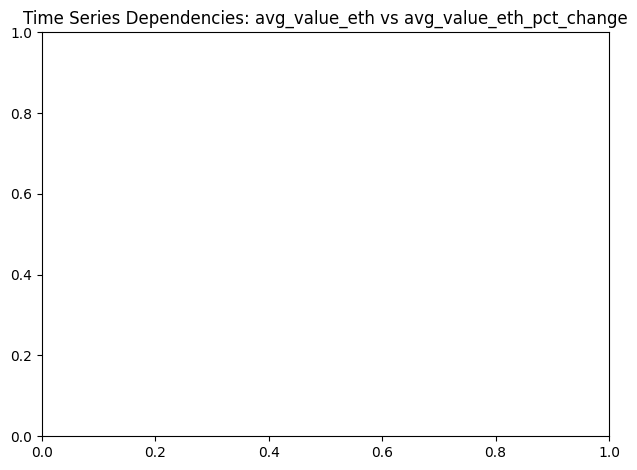

<Figure size 1000x600 with 0 Axes>

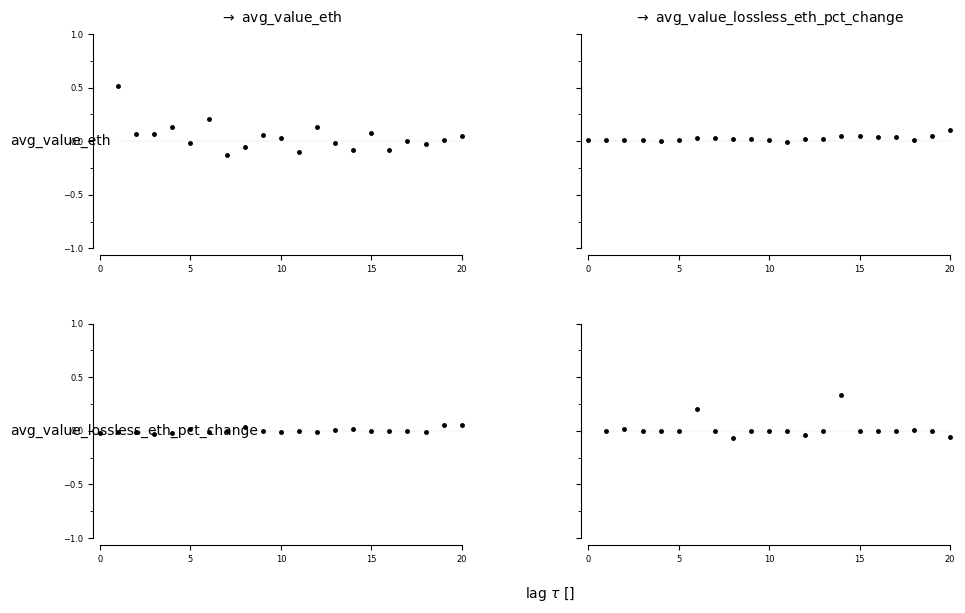


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


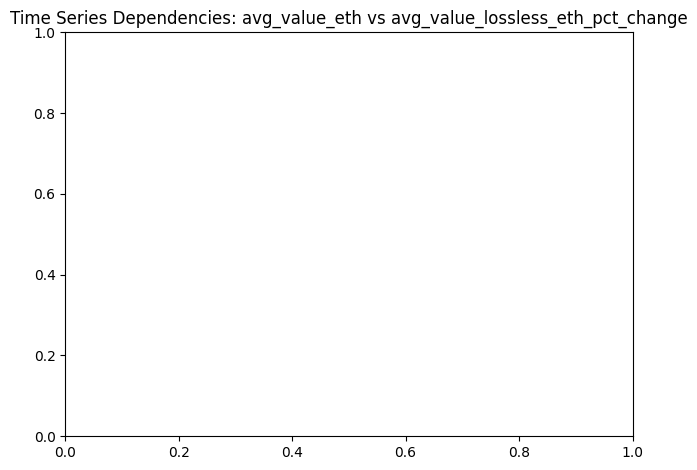

<Figure size 1000x600 with 0 Axes>

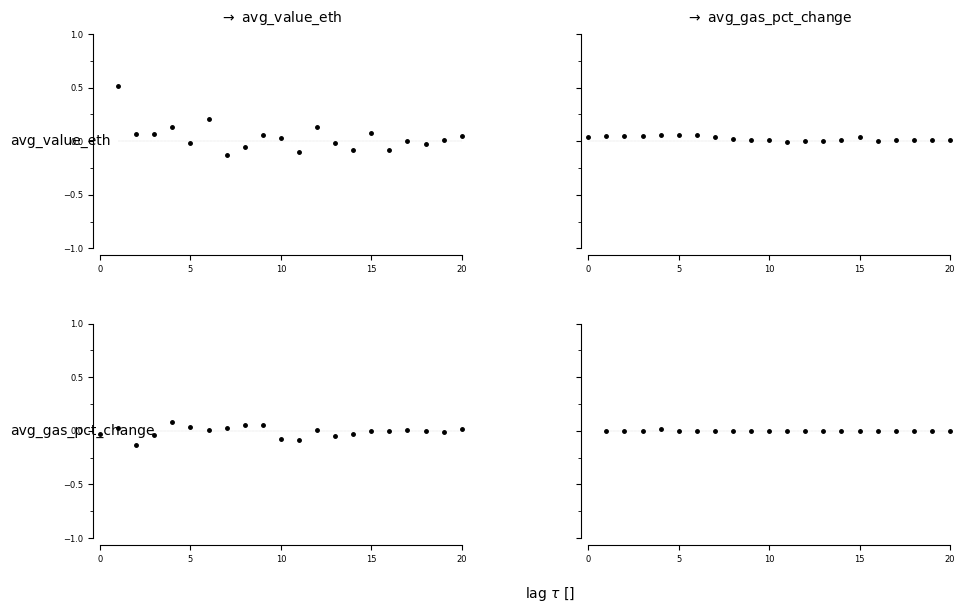


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


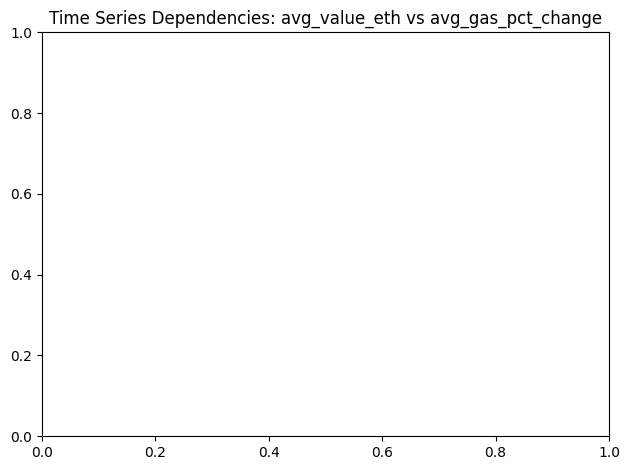

<Figure size 1000x600 with 0 Axes>

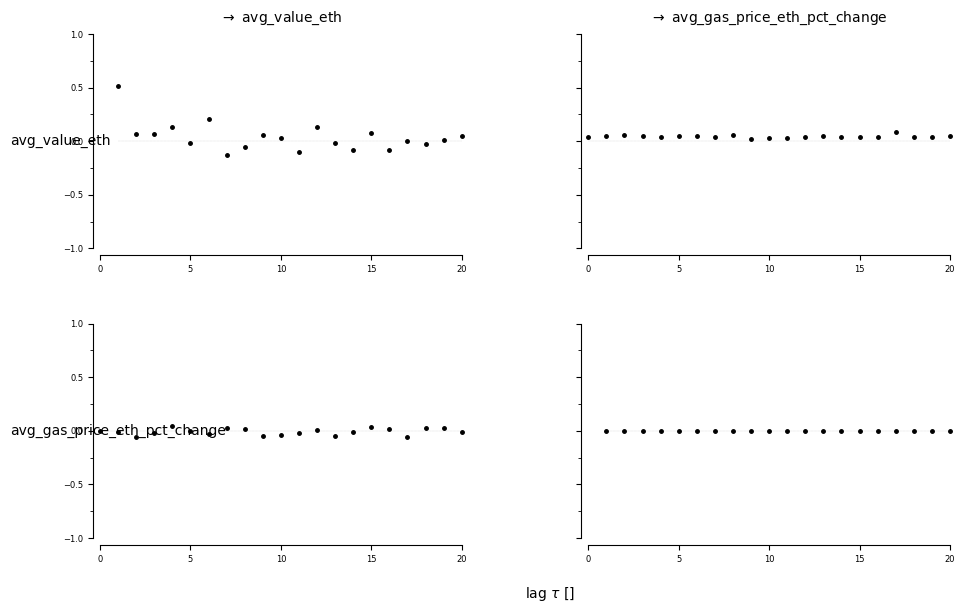


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


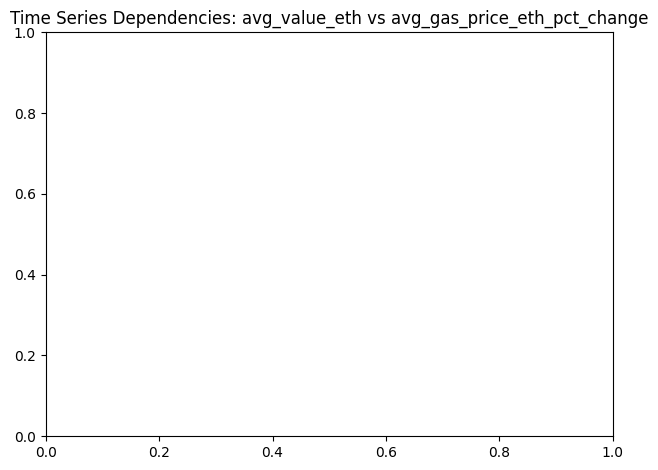

<Figure size 1000x600 with 0 Axes>

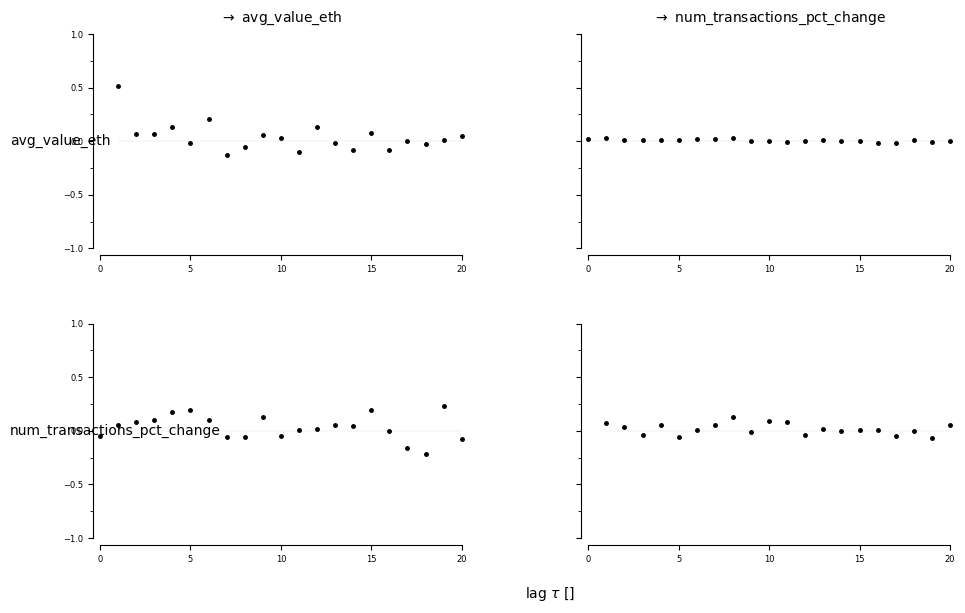


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


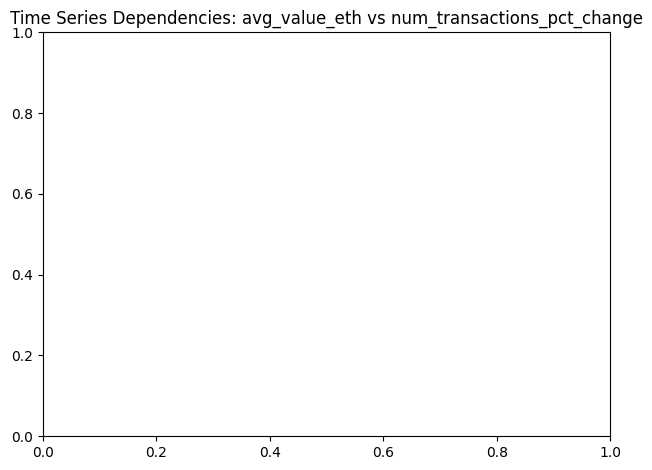

<Figure size 1000x600 with 0 Axes>

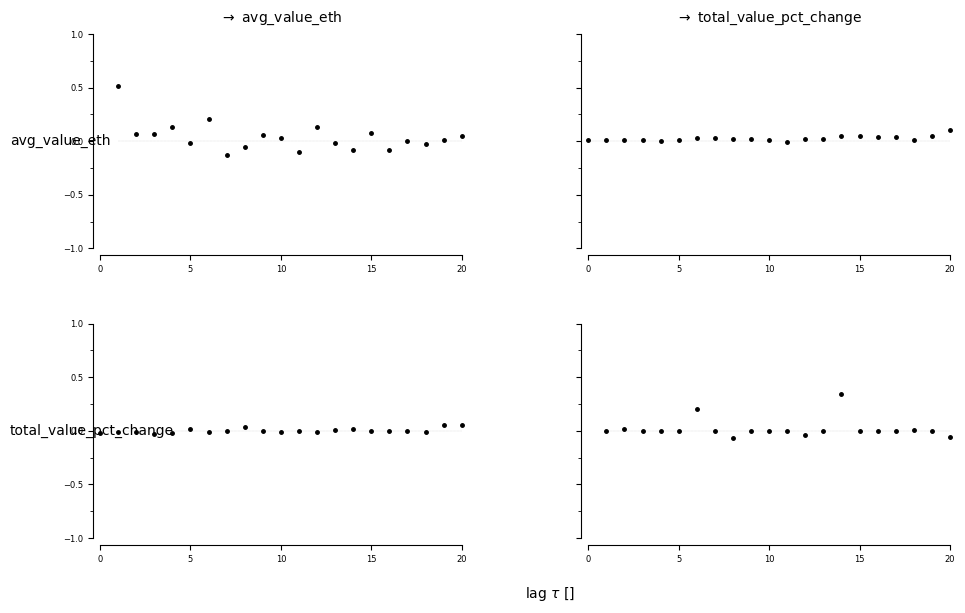


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


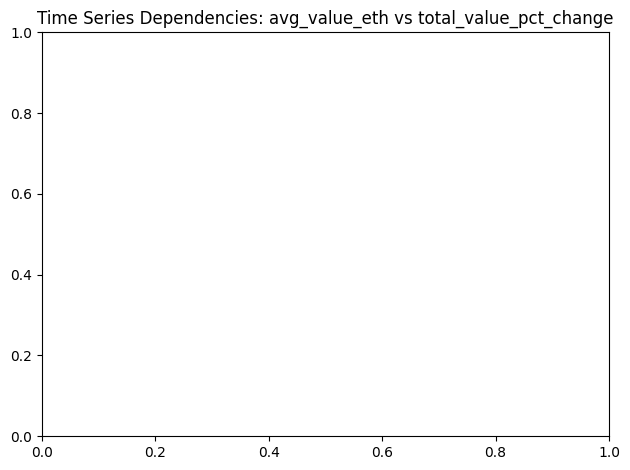

<Figure size 1000x600 with 0 Axes>

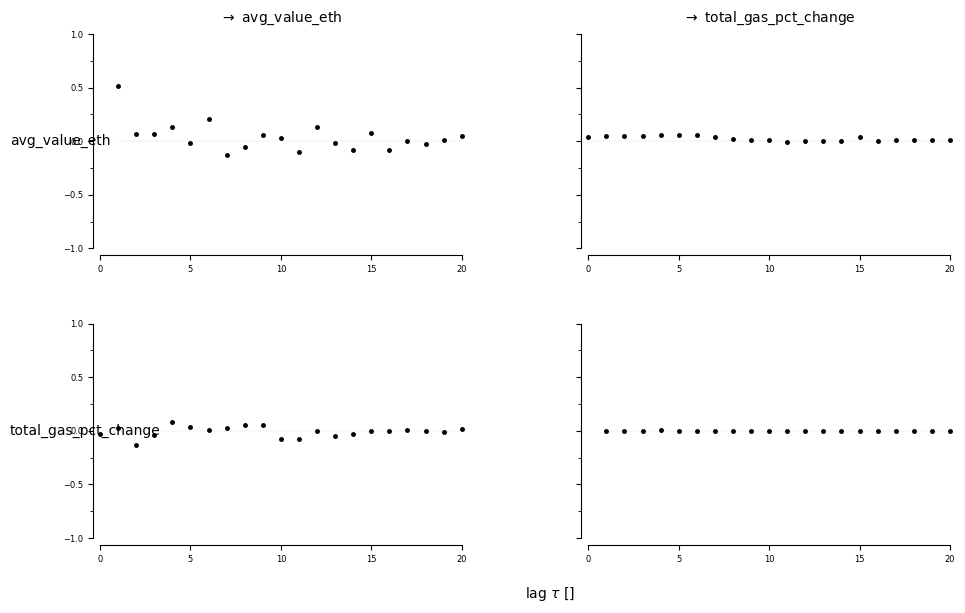


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


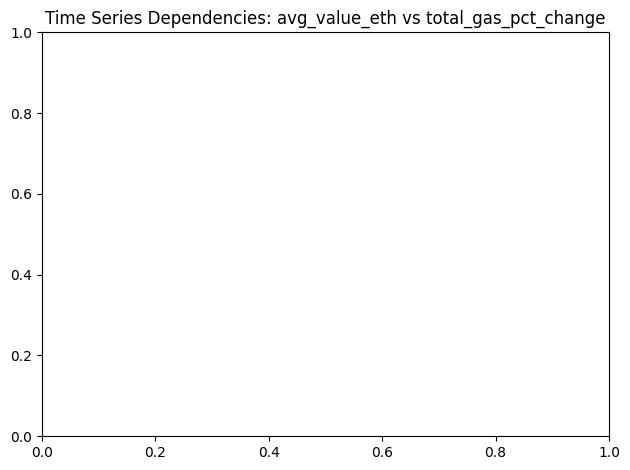

<Figure size 1000x600 with 0 Axes>

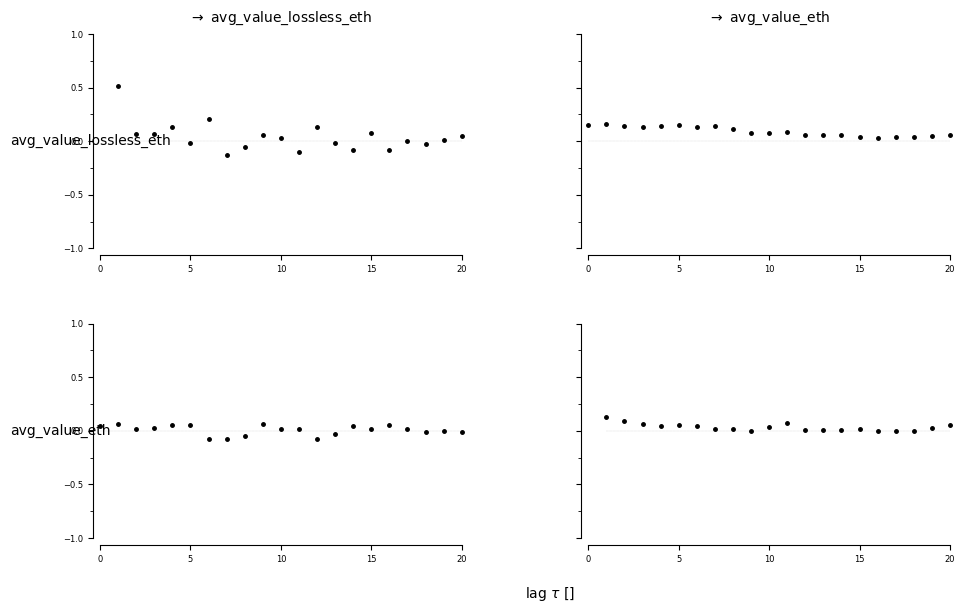


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


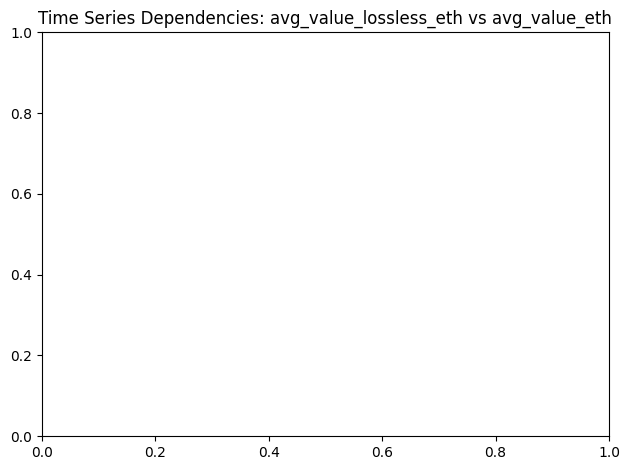

<Figure size 1000x600 with 0 Axes>

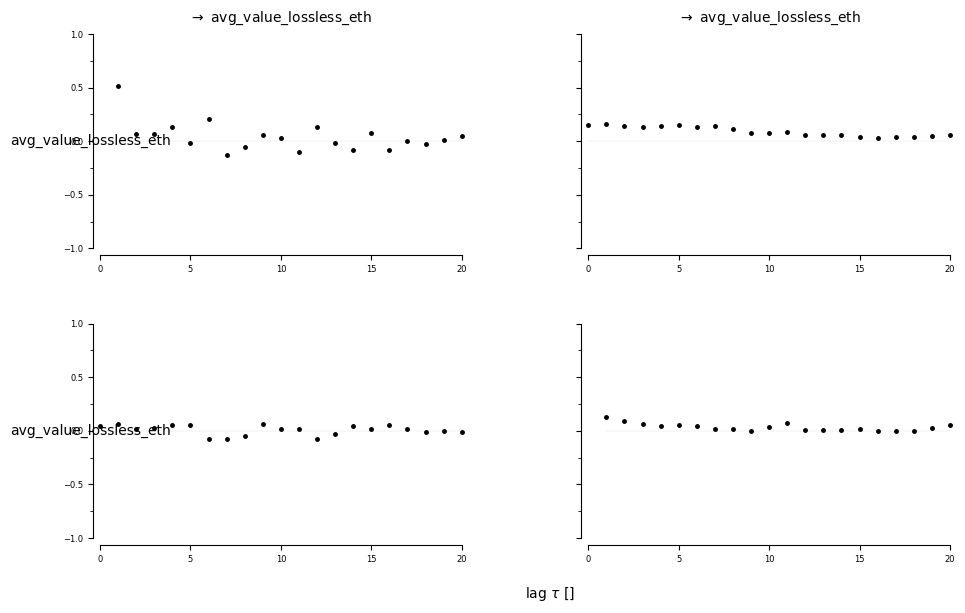


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


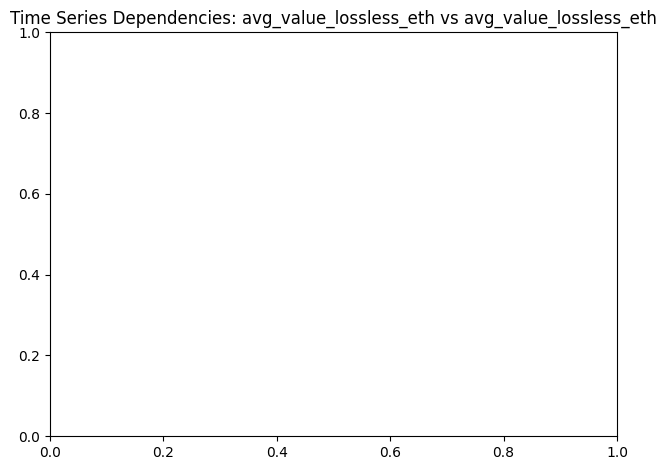

<Figure size 1000x600 with 0 Axes>

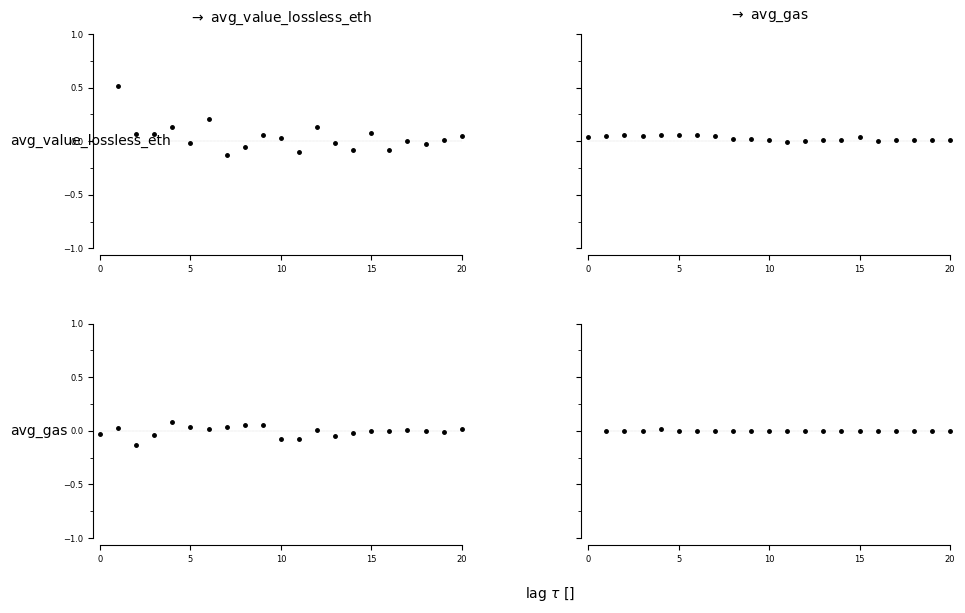


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


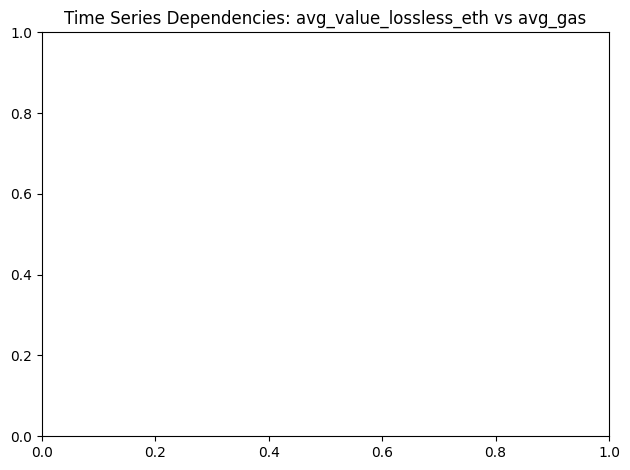

<Figure size 1000x600 with 0 Axes>

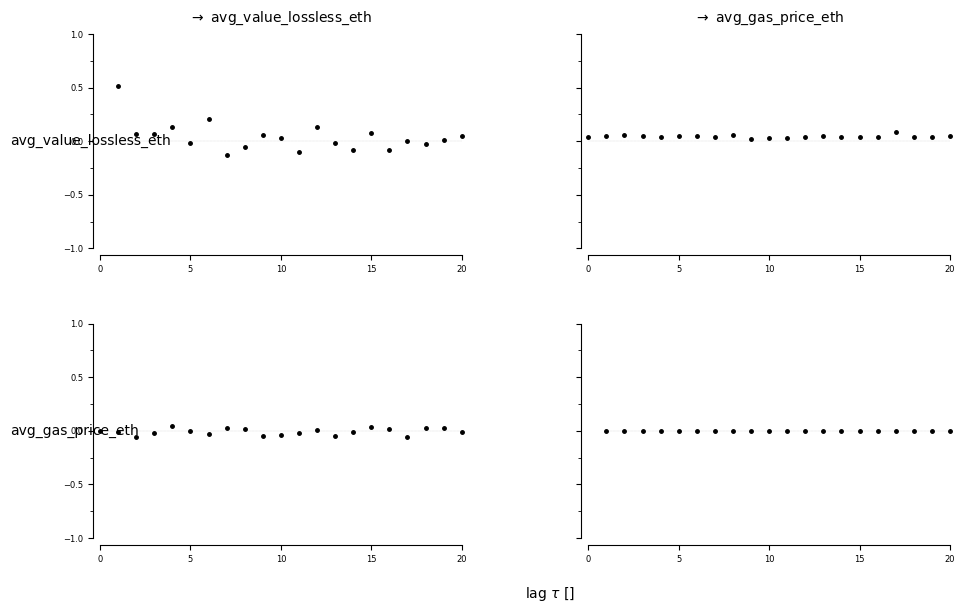


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


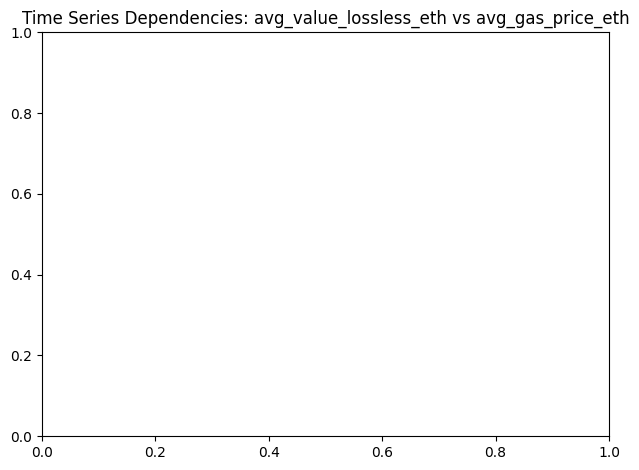

<Figure size 1000x600 with 0 Axes>

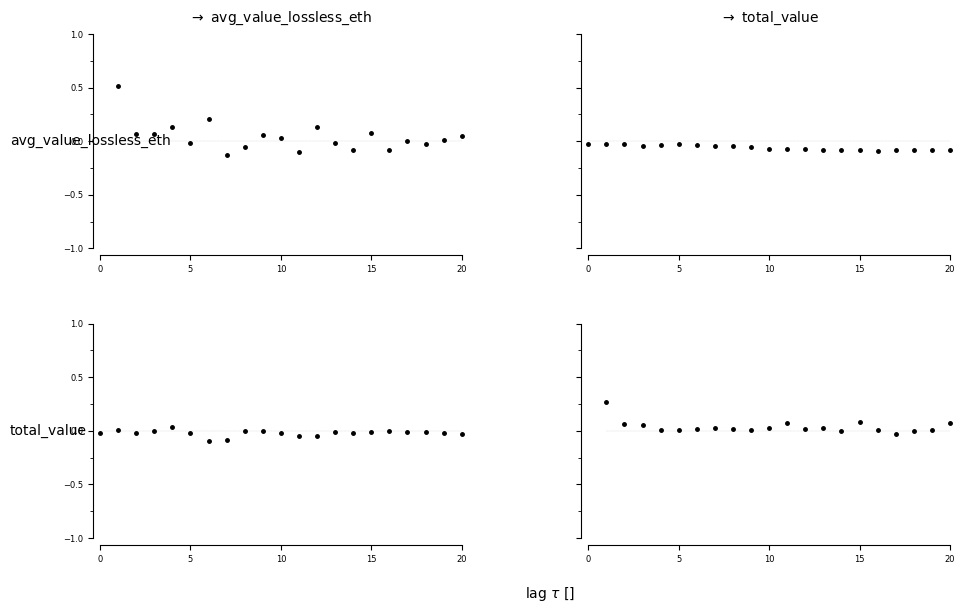


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


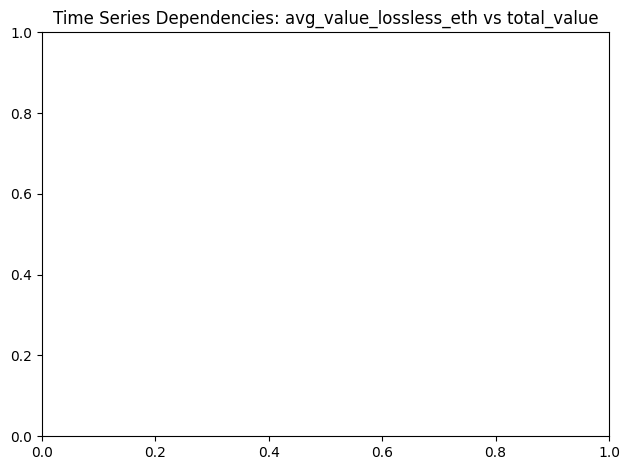

<Figure size 1000x600 with 0 Axes>

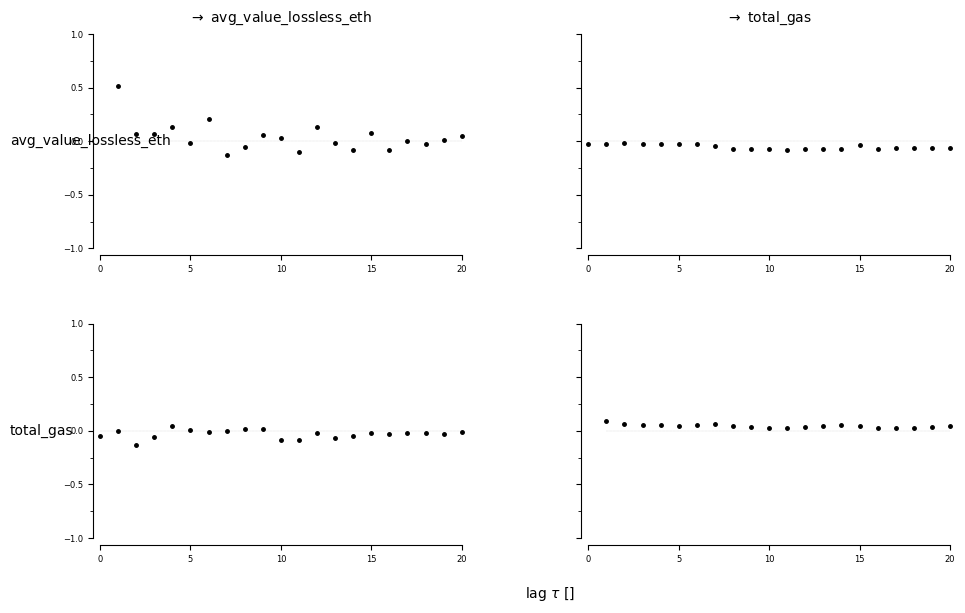


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


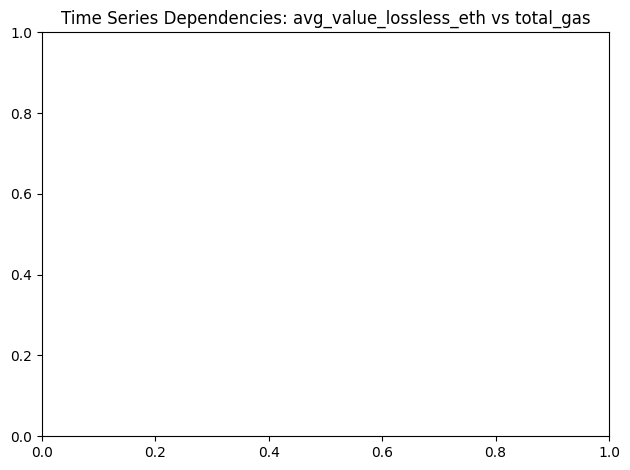

<Figure size 1000x600 with 0 Axes>

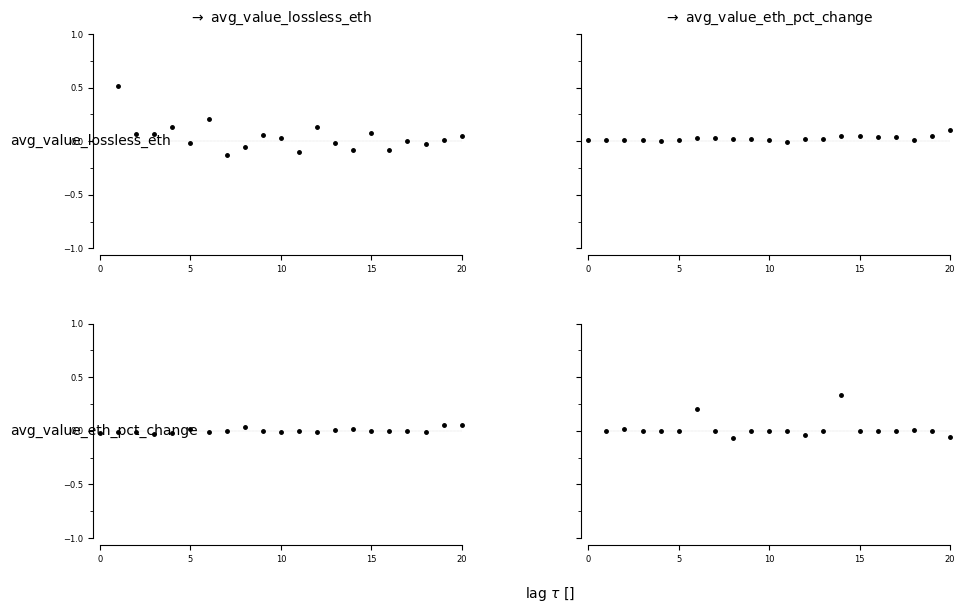


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


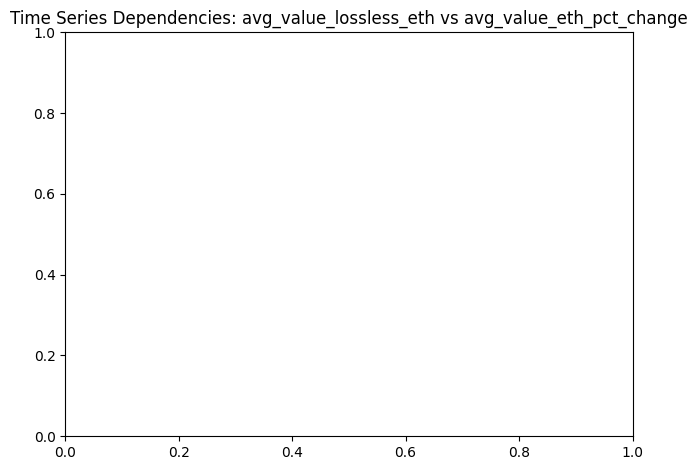

<Figure size 1000x600 with 0 Axes>

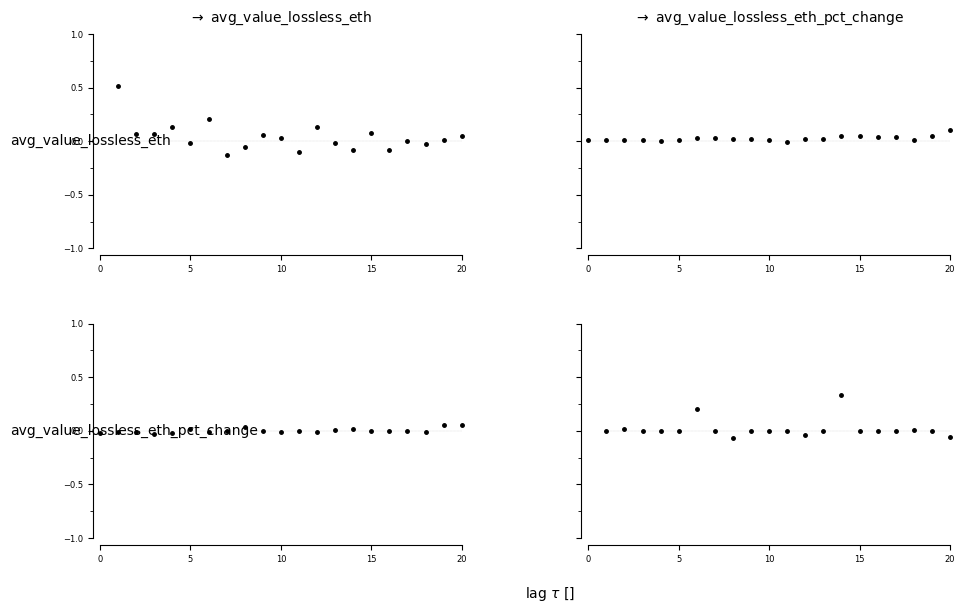


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


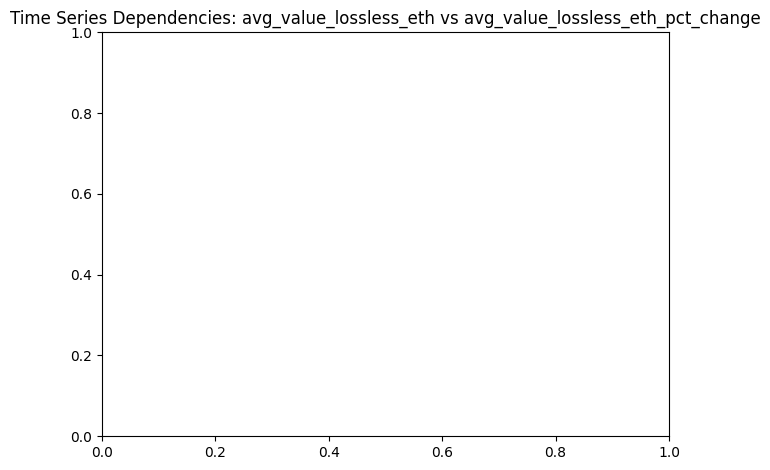

<Figure size 1000x600 with 0 Axes>

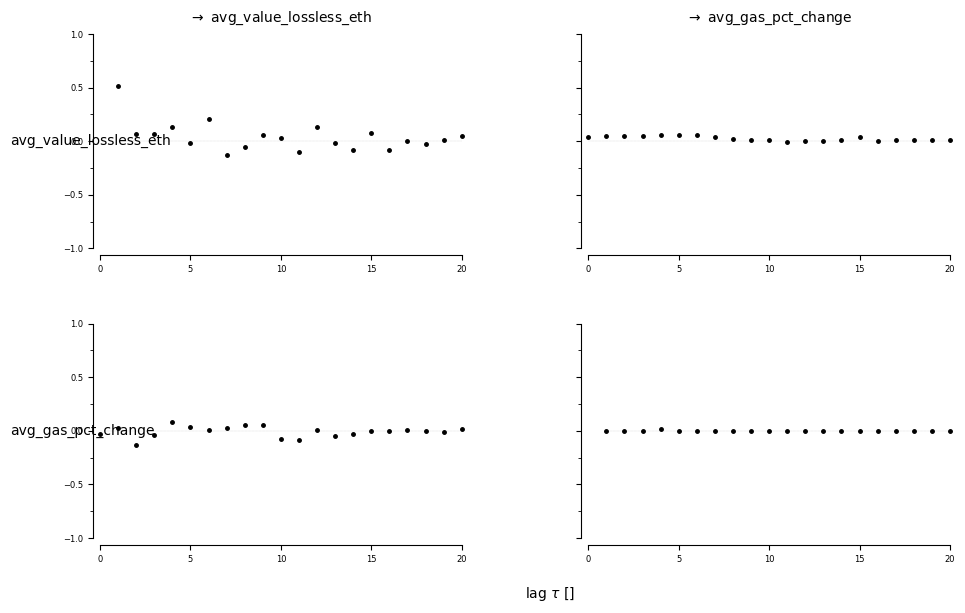


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


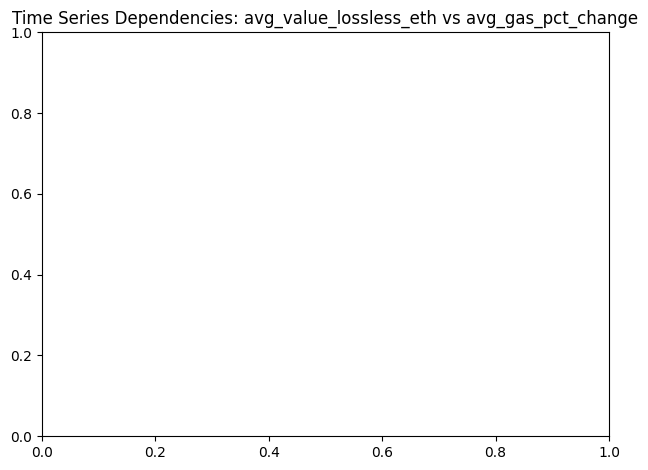

<Figure size 1000x600 with 0 Axes>

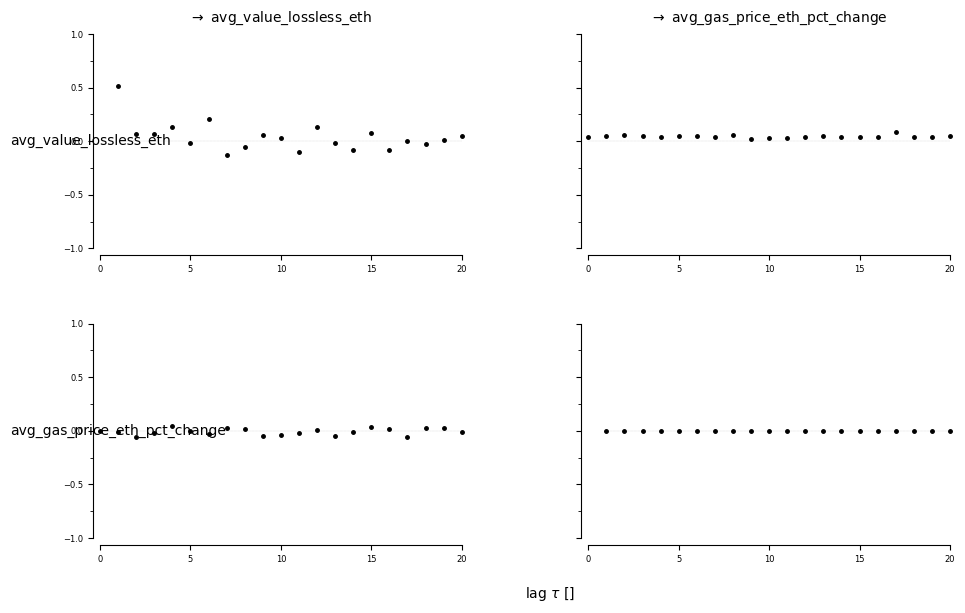


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


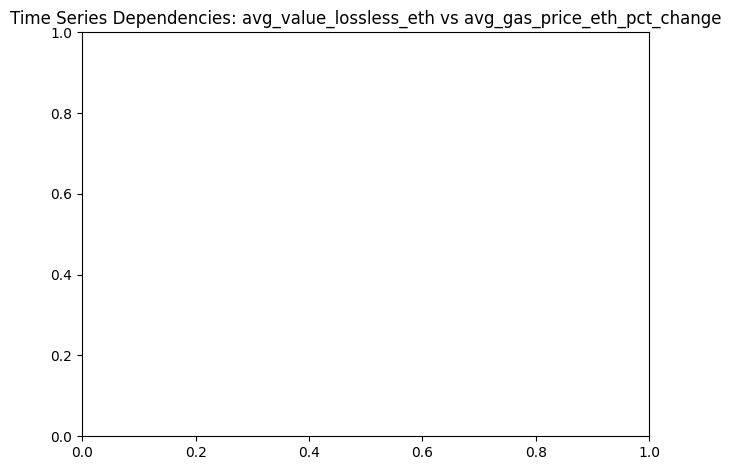

<Figure size 1000x600 with 0 Axes>

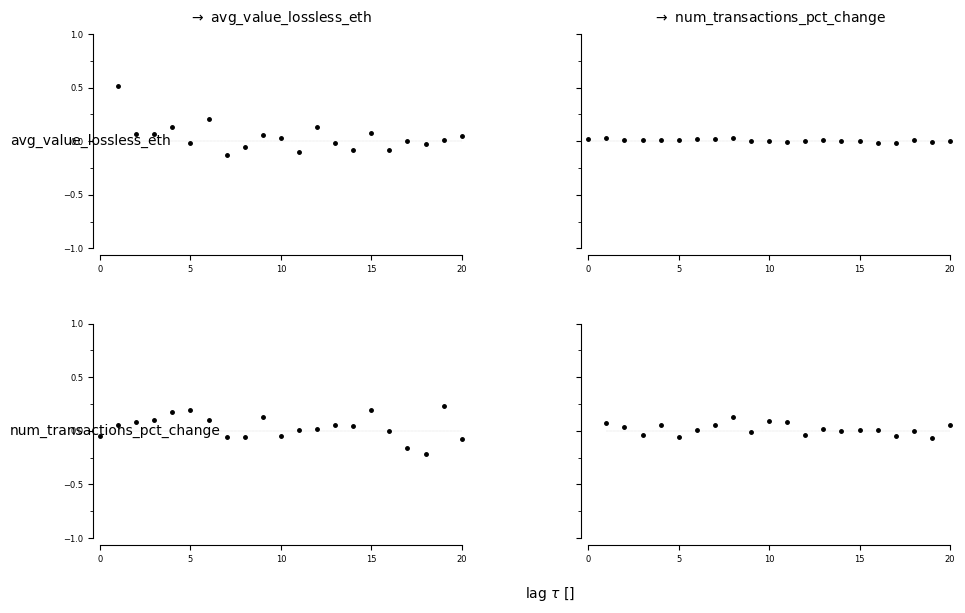


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


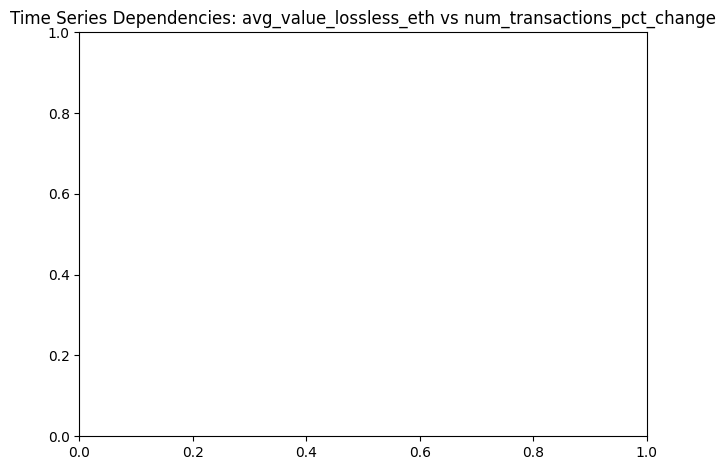

<Figure size 1000x600 with 0 Axes>

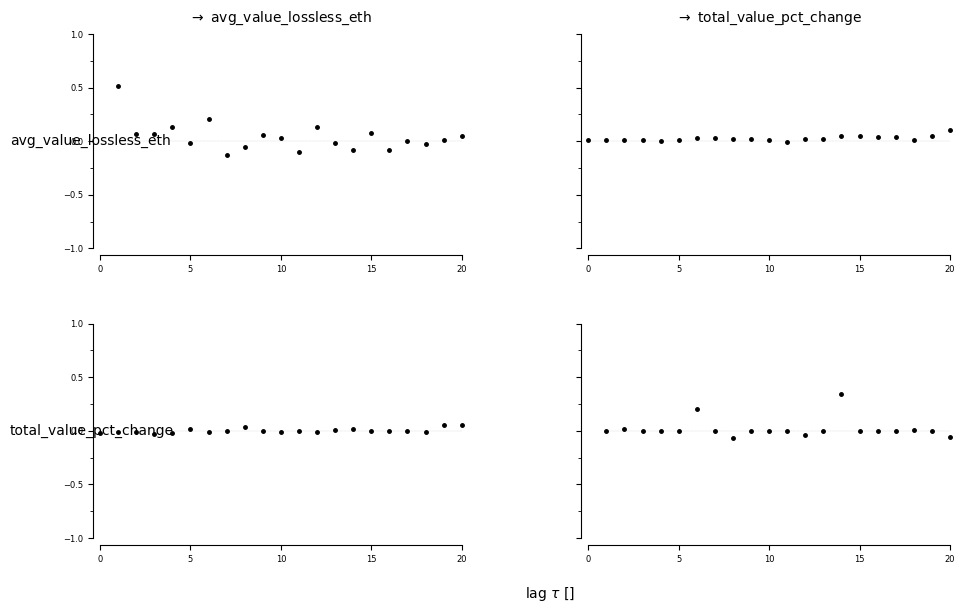


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


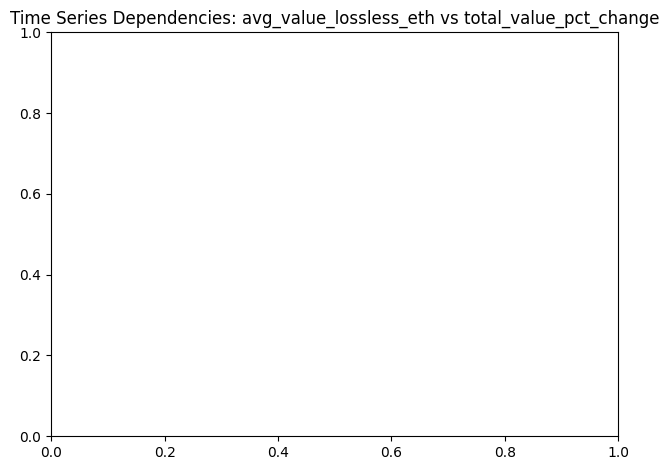

<Figure size 1000x600 with 0 Axes>

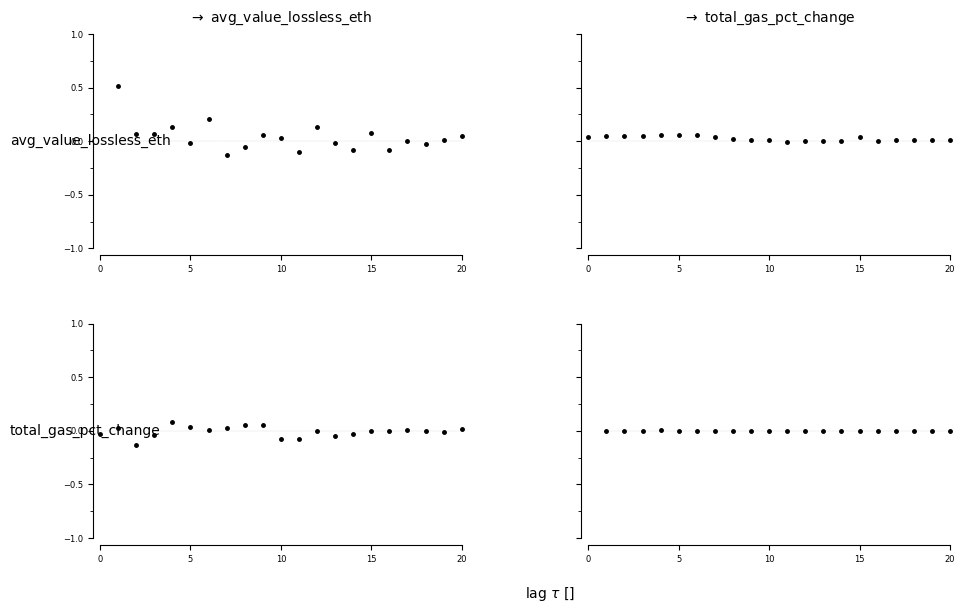


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


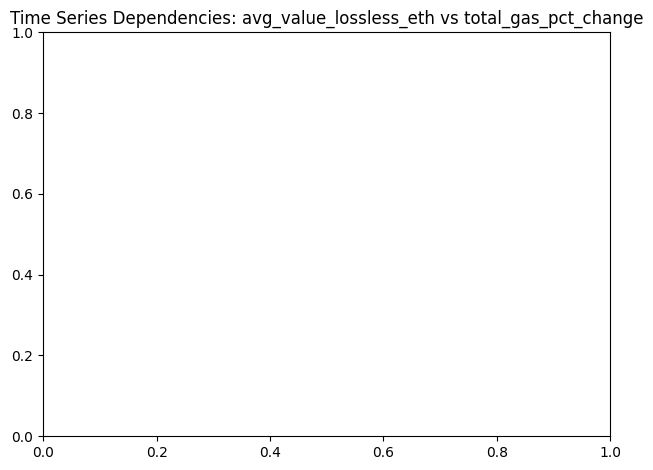

<Figure size 1000x600 with 0 Axes>

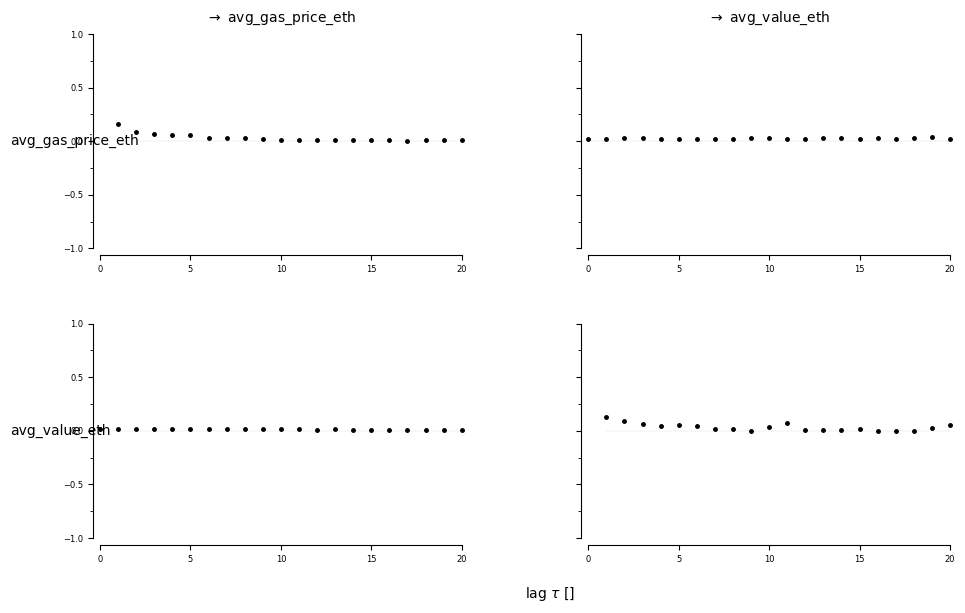


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


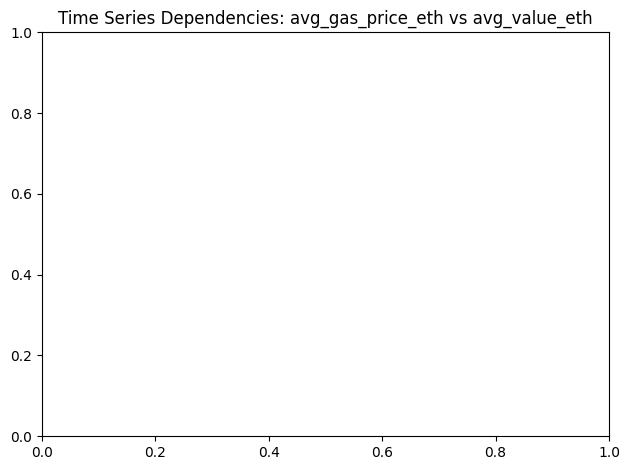

<Figure size 1000x600 with 0 Axes>

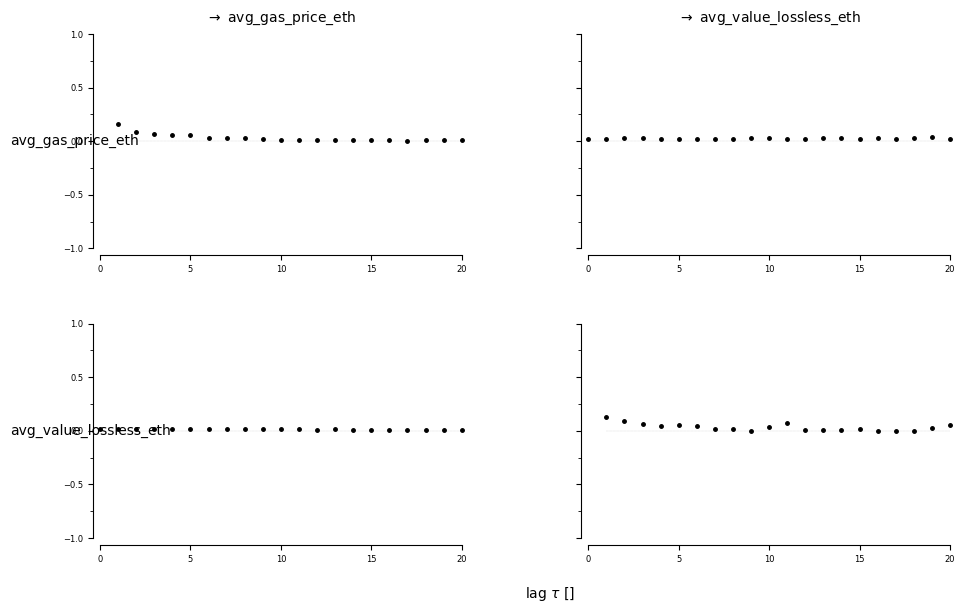


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


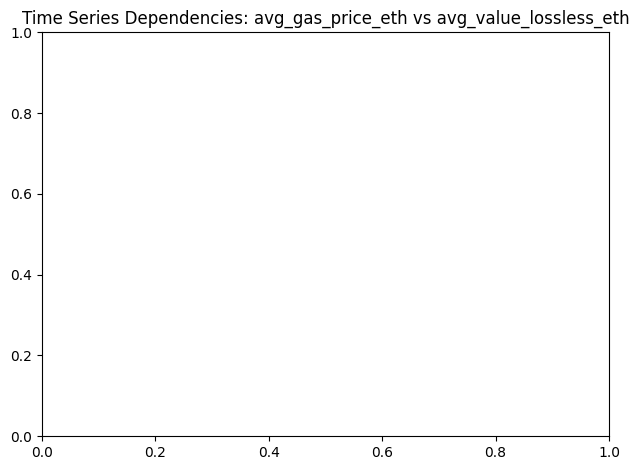

<Figure size 1000x600 with 0 Axes>

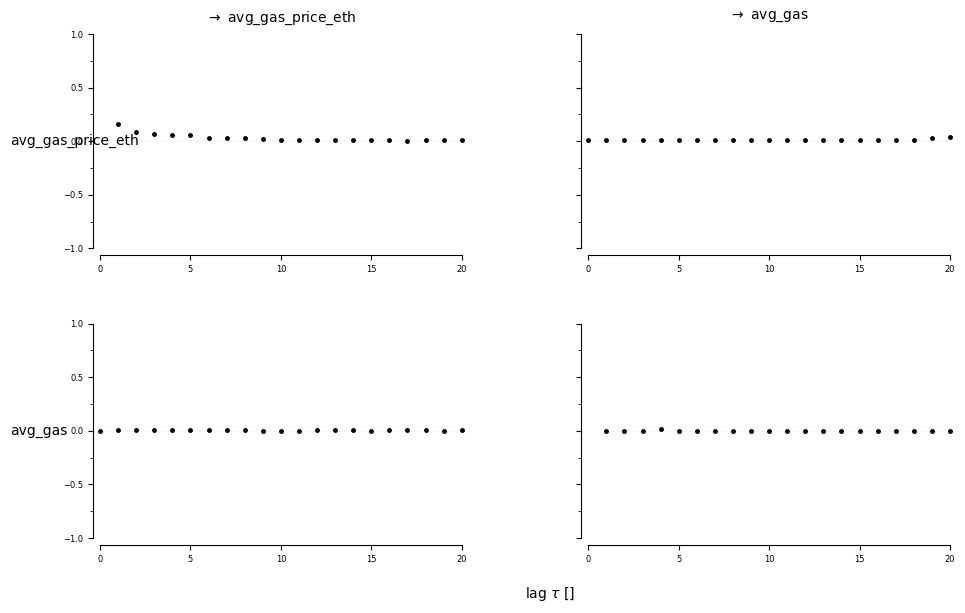


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


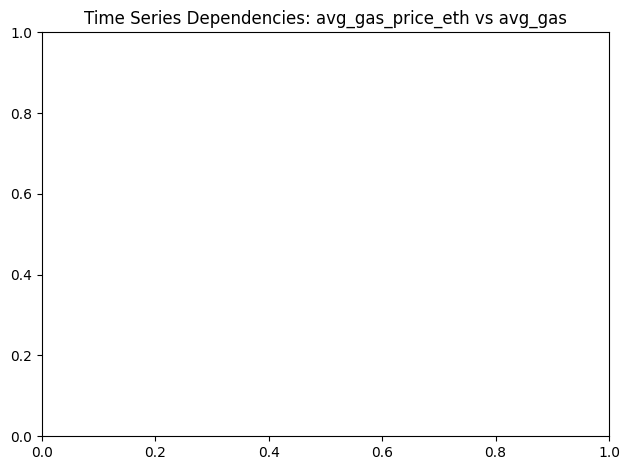

<Figure size 1000x600 with 0 Axes>

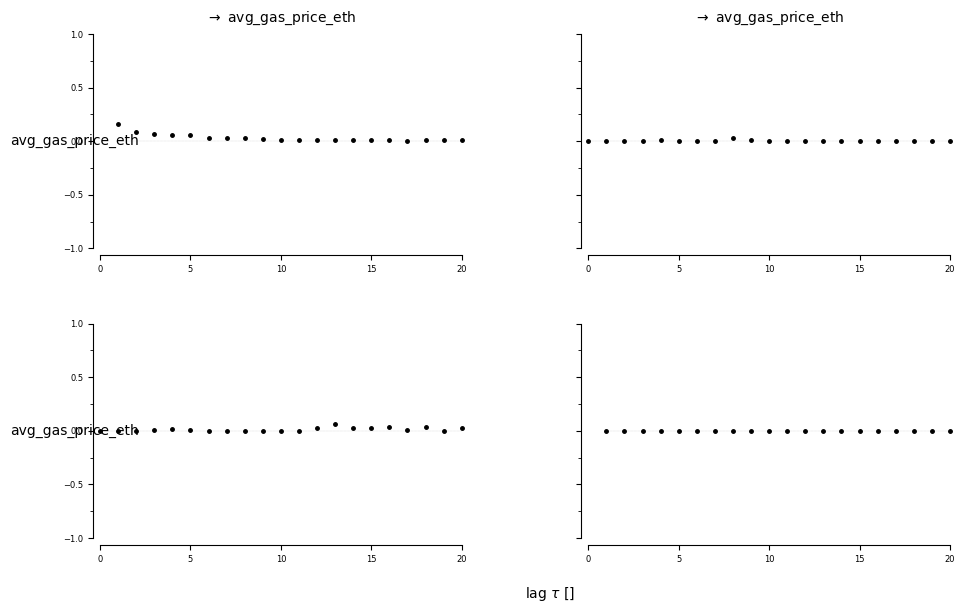


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


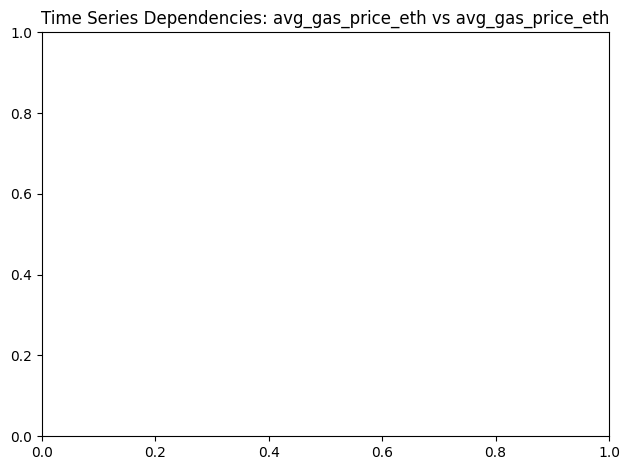

<Figure size 1000x600 with 0 Axes>

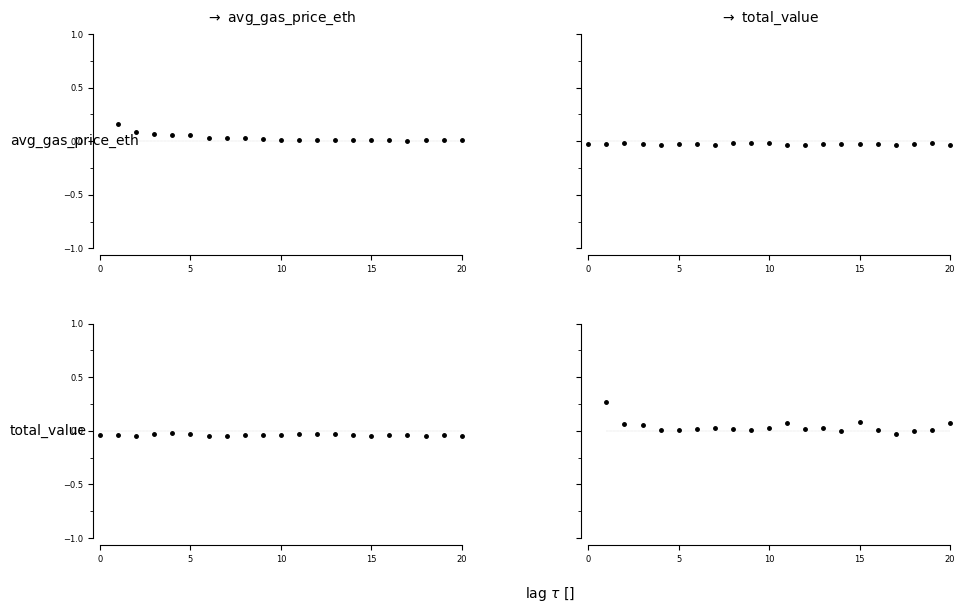


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


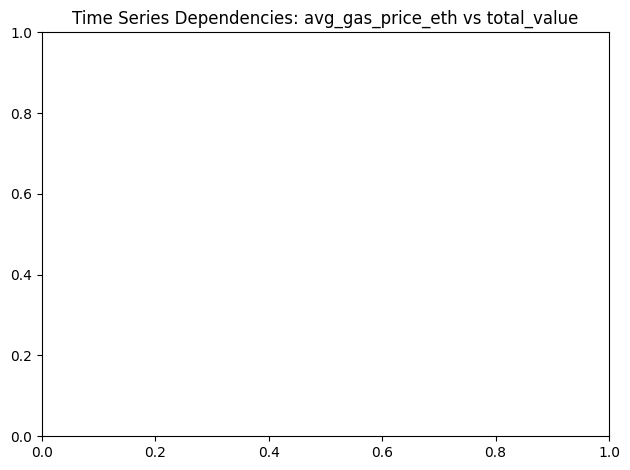

<Figure size 1000x600 with 0 Axes>

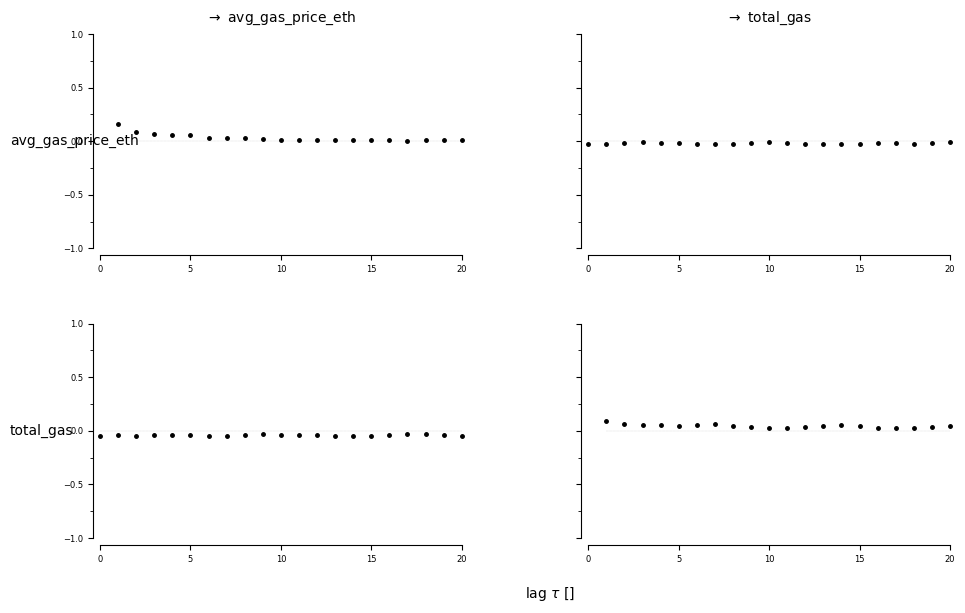


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


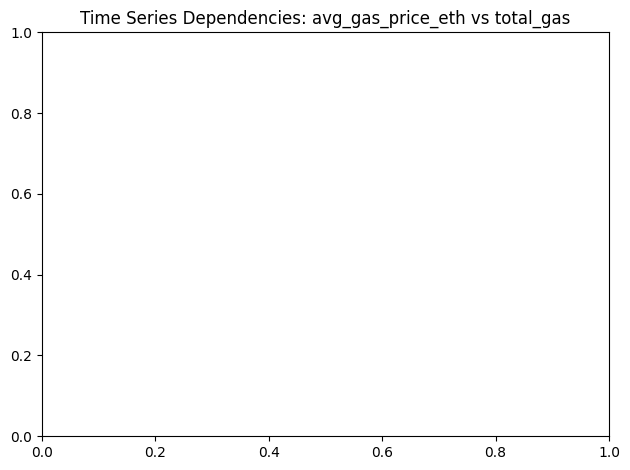

<Figure size 1000x600 with 0 Axes>

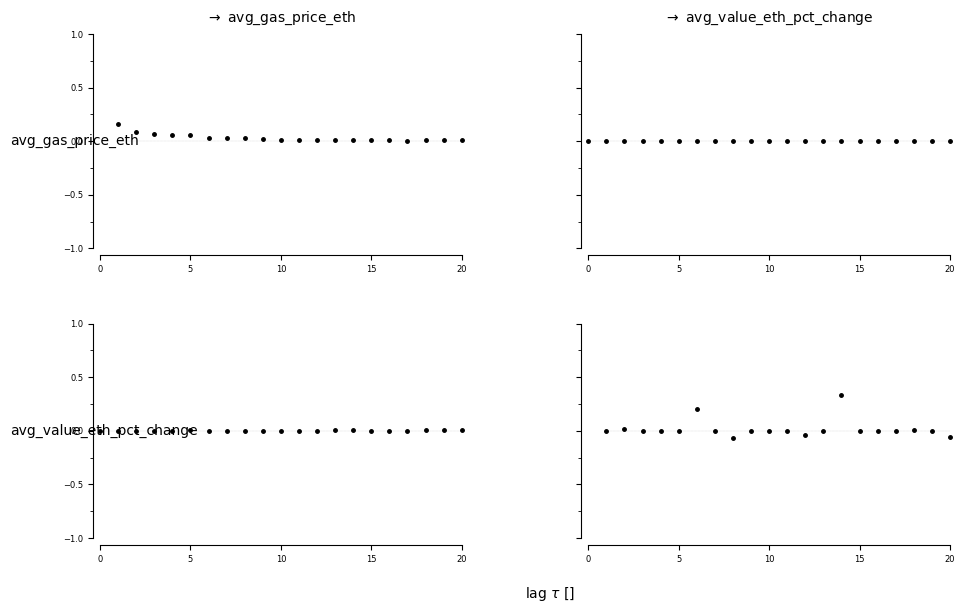


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


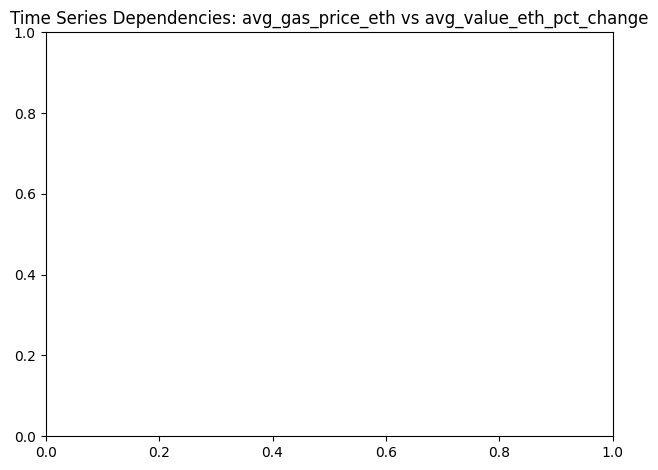

<Figure size 1000x600 with 0 Axes>

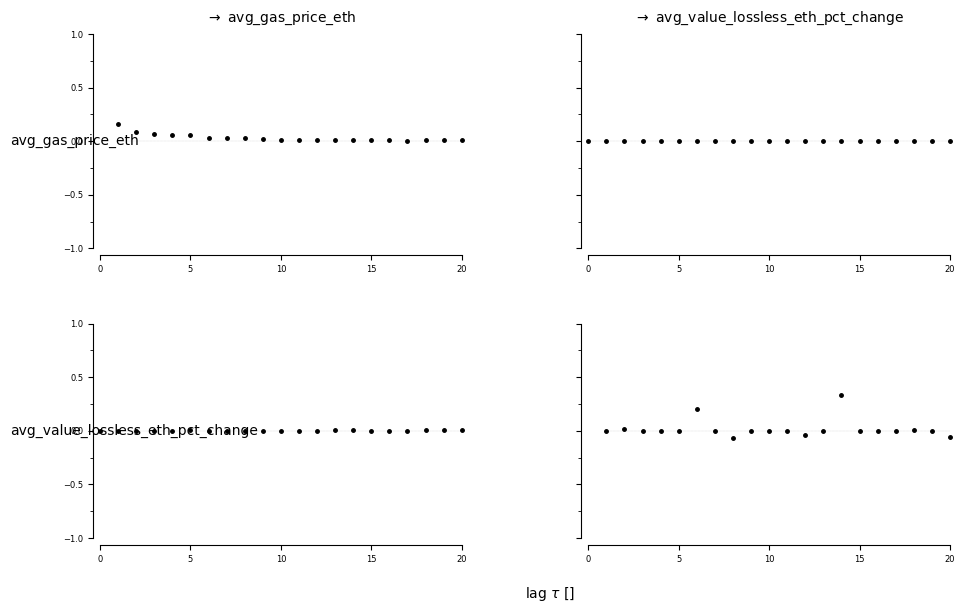


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


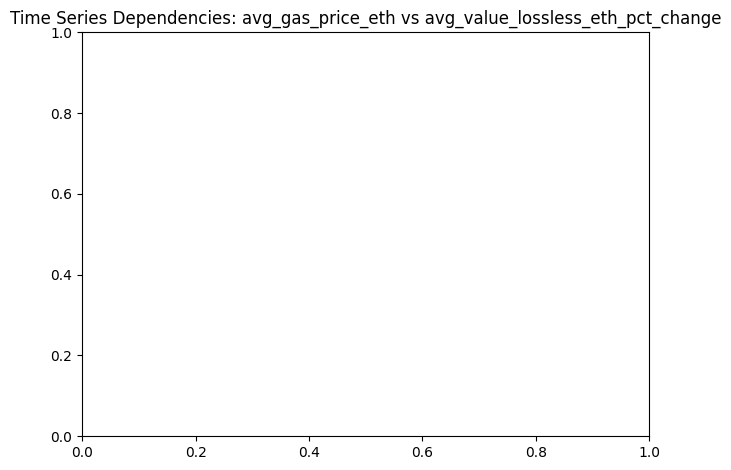

<Figure size 1000x600 with 0 Axes>

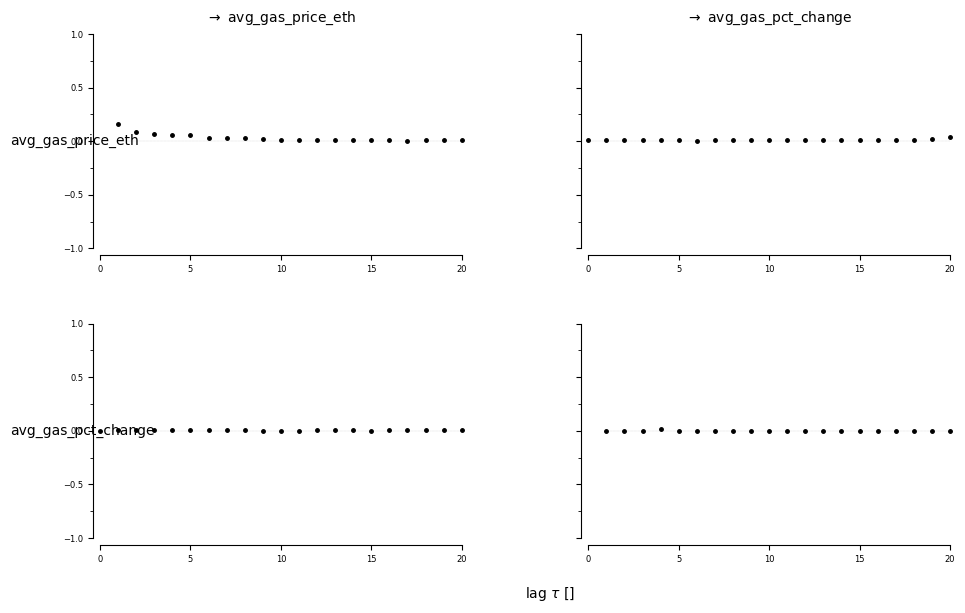


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


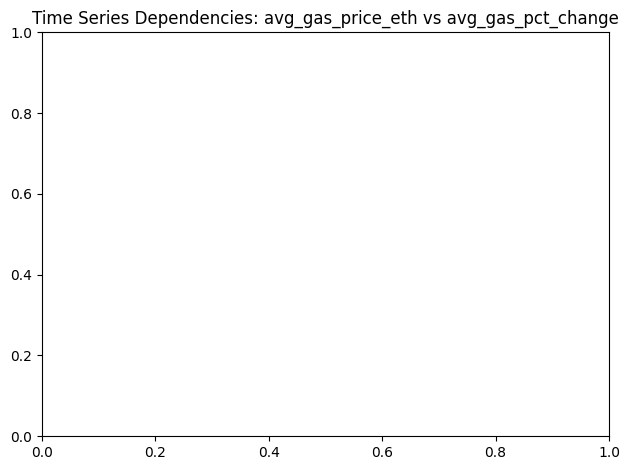

<Figure size 1000x600 with 0 Axes>

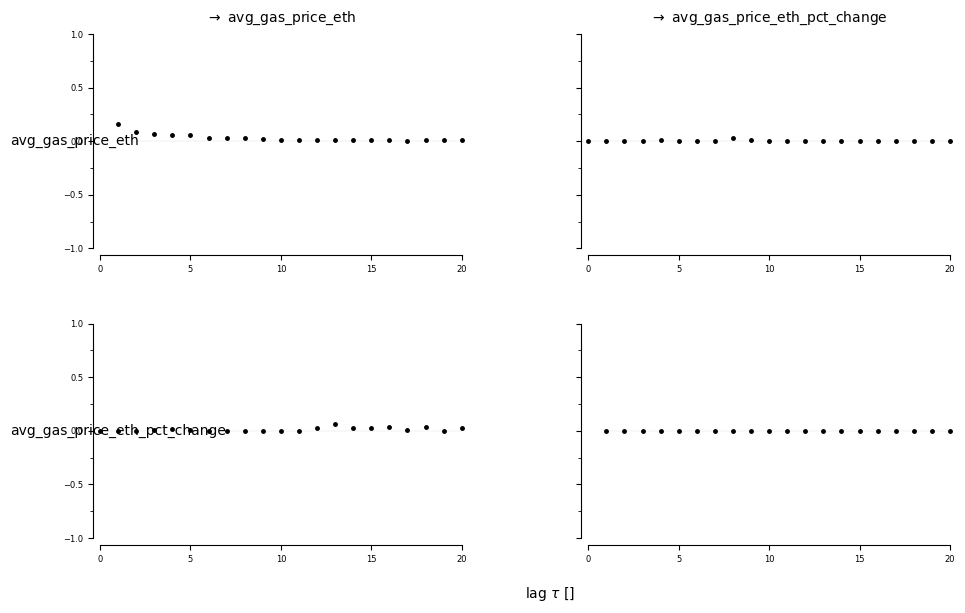


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


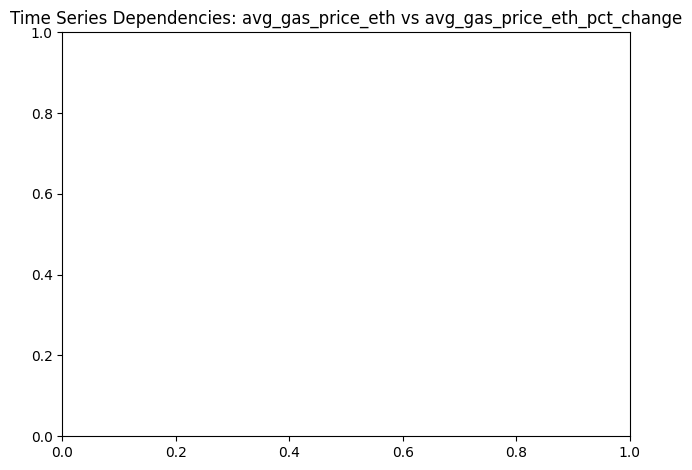

<Figure size 1000x600 with 0 Axes>

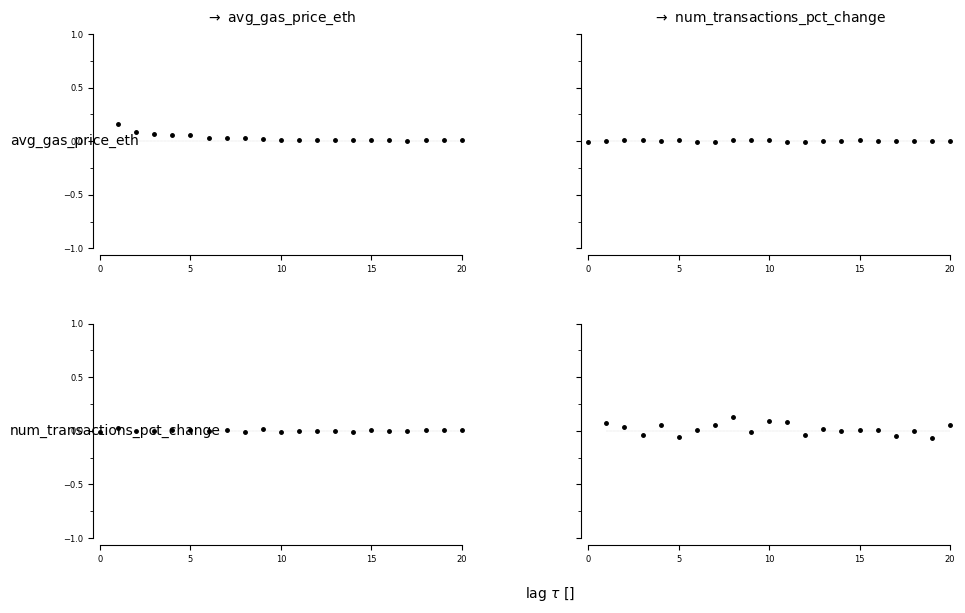


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


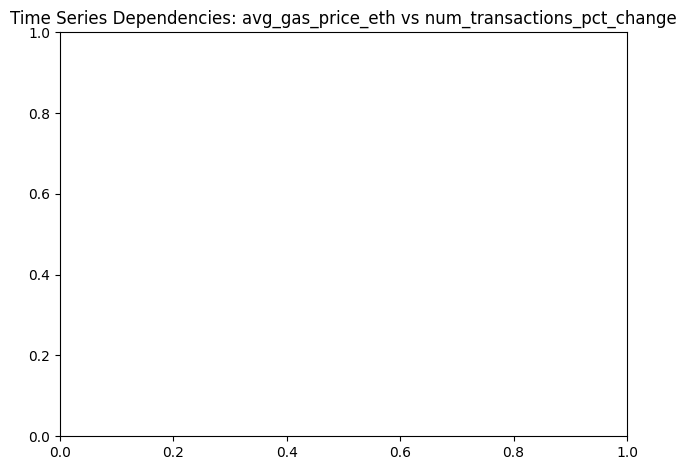

<Figure size 1000x600 with 0 Axes>

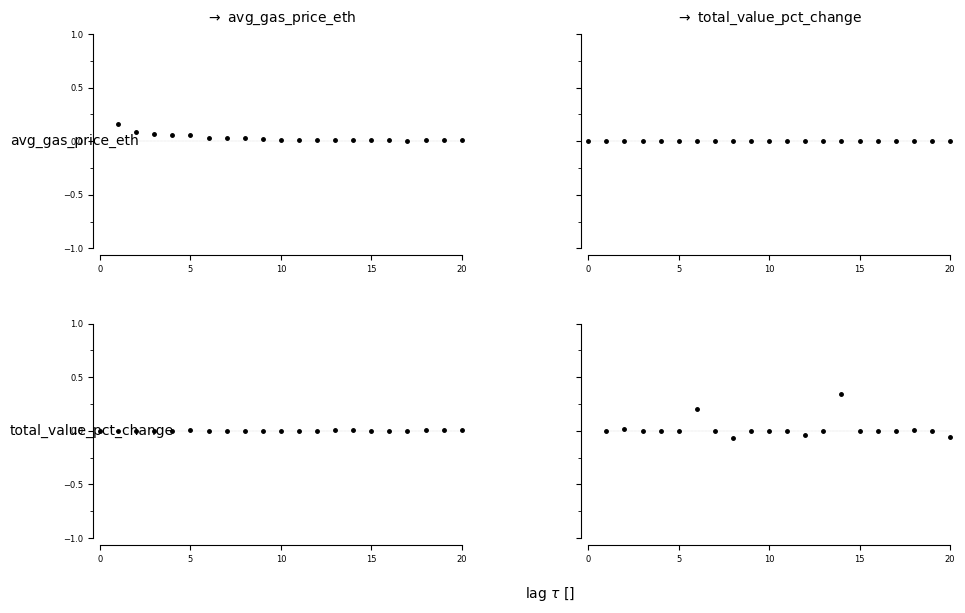


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


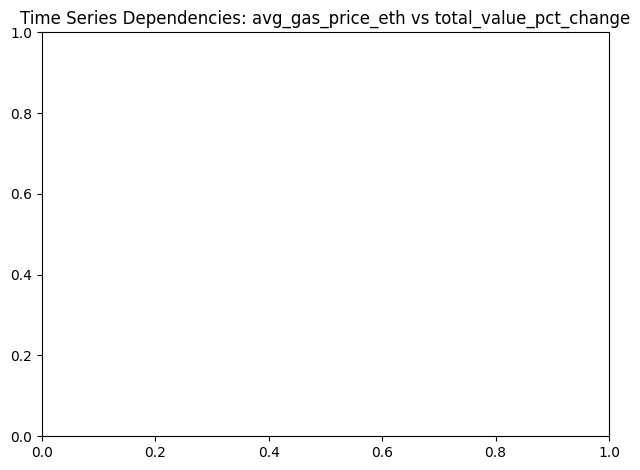

<Figure size 1000x600 with 0 Axes>

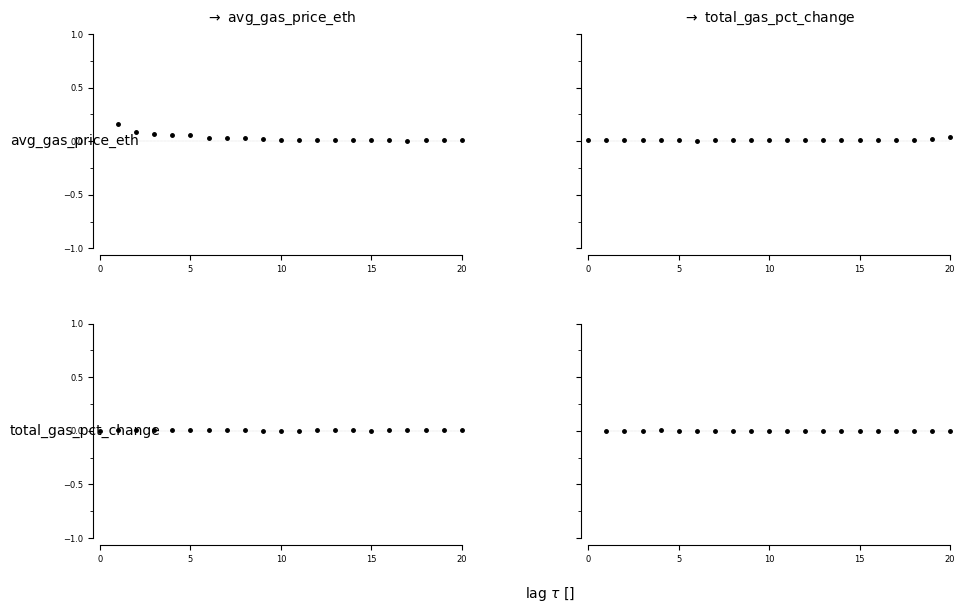


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


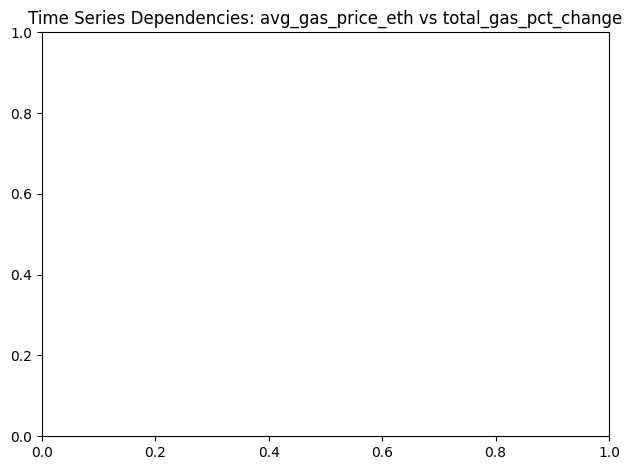

<Figure size 1000x600 with 0 Axes>

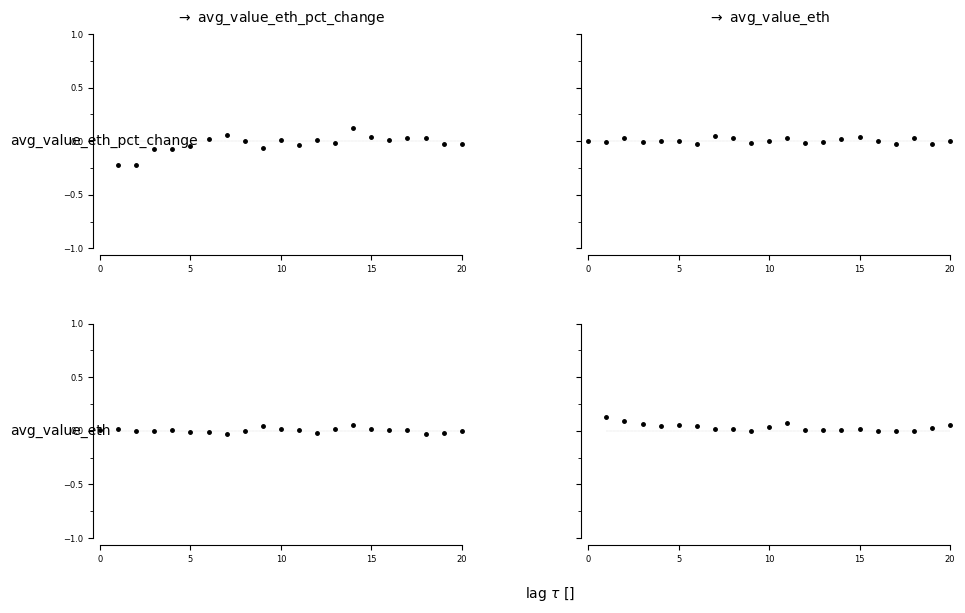


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


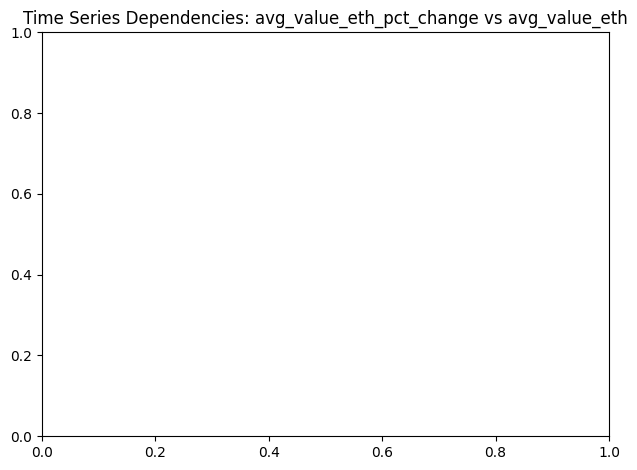

<Figure size 1000x600 with 0 Axes>

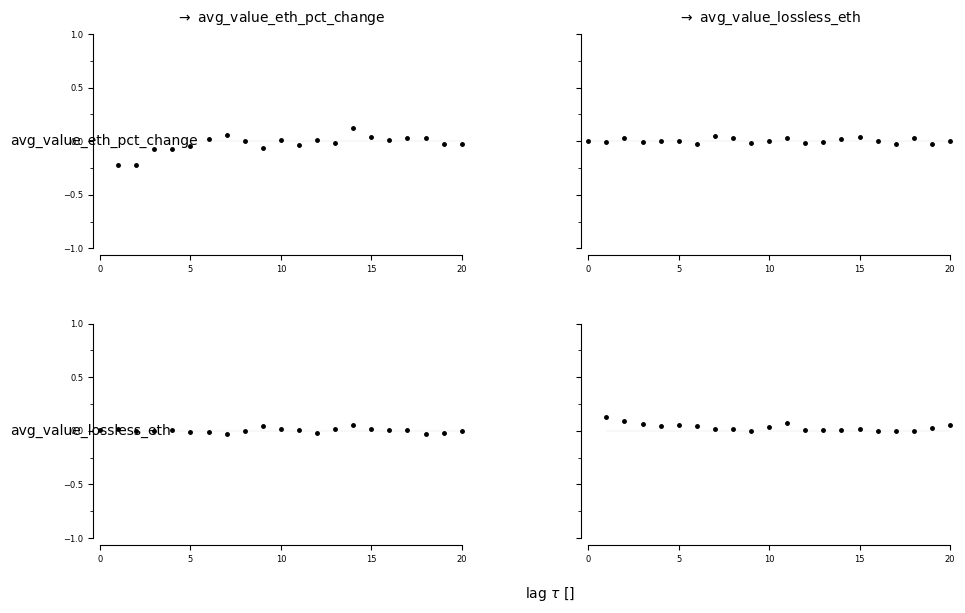


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


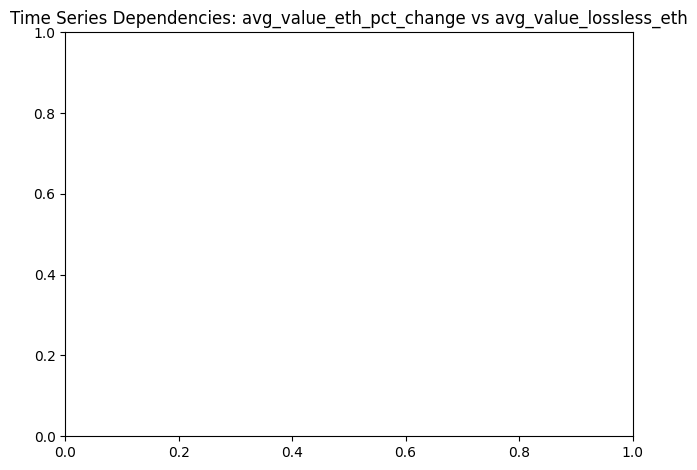

<Figure size 1000x600 with 0 Axes>

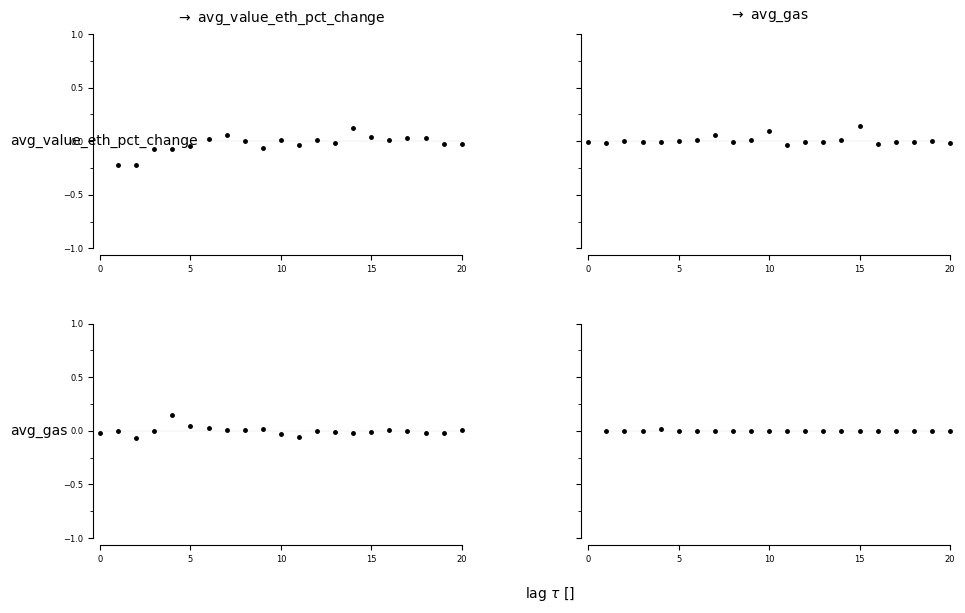


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


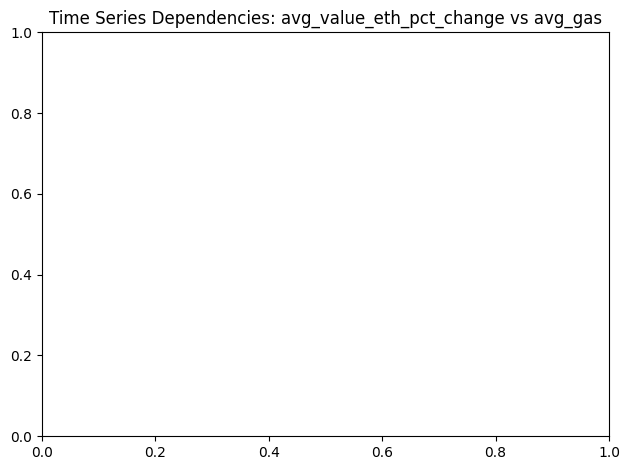

<Figure size 1000x600 with 0 Axes>

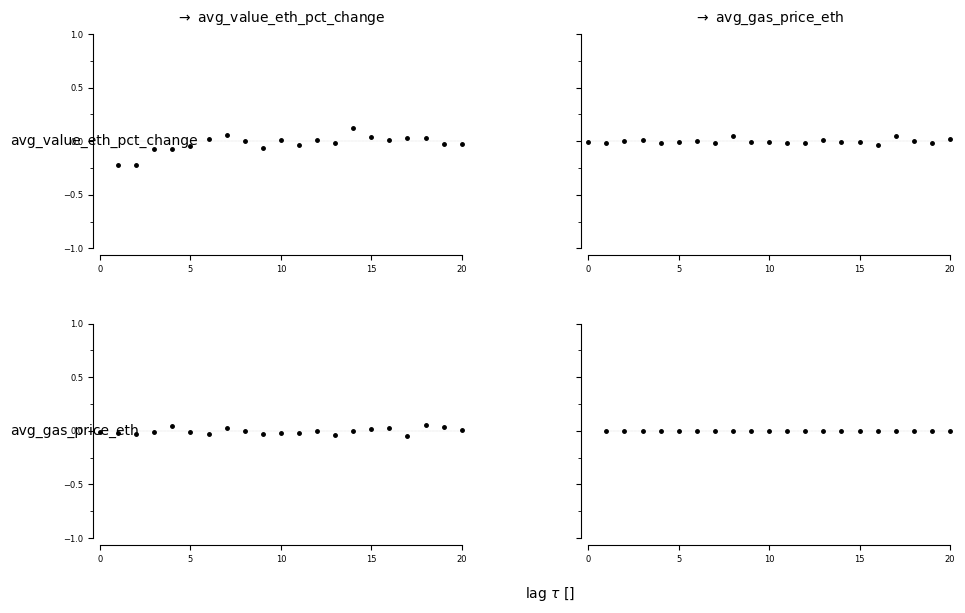


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


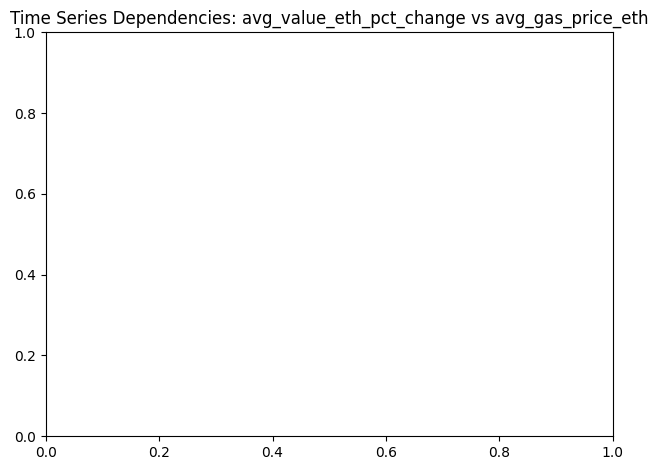

<Figure size 1000x600 with 0 Axes>

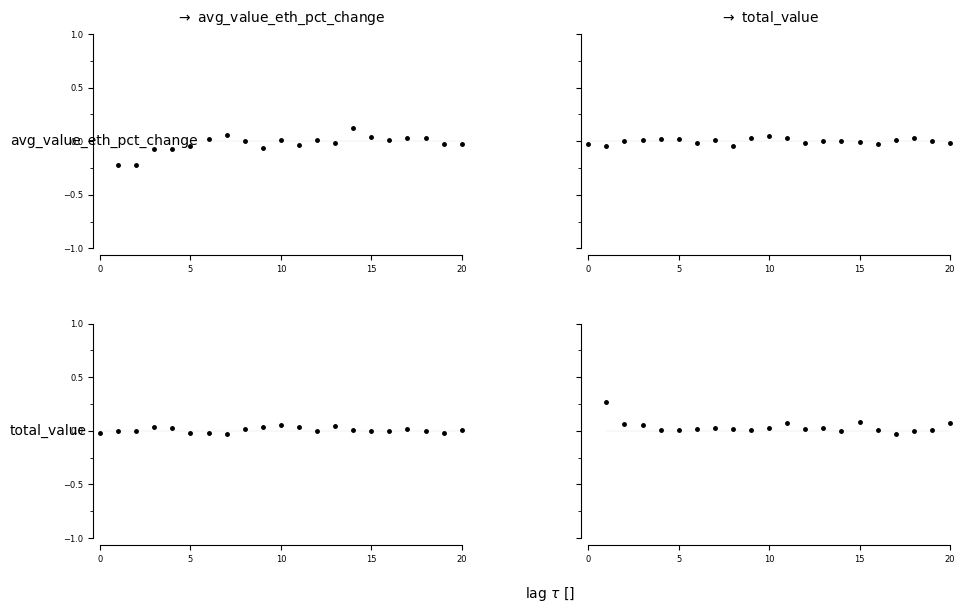


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


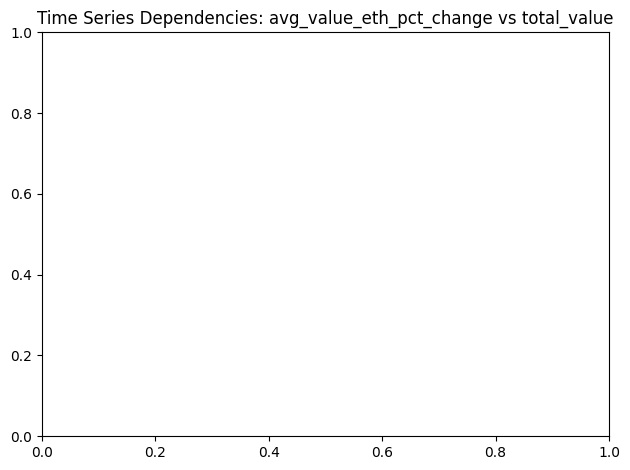

<Figure size 1000x600 with 0 Axes>

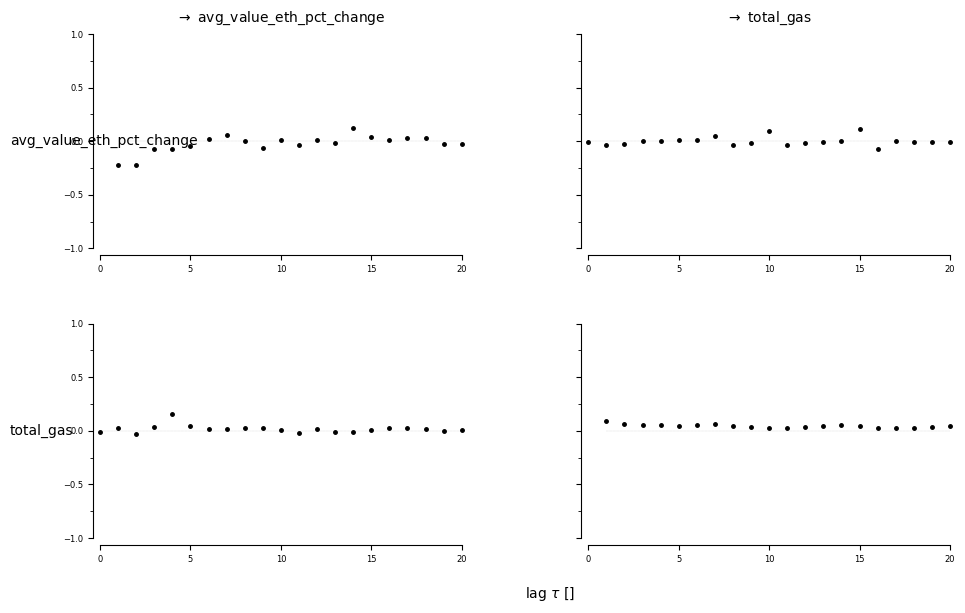


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


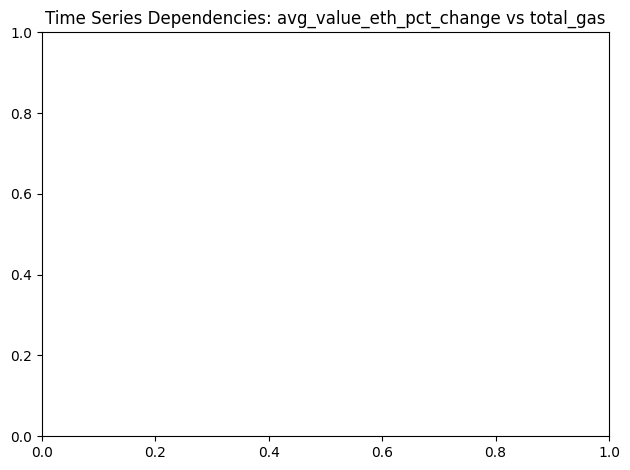

<Figure size 1000x600 with 0 Axes>

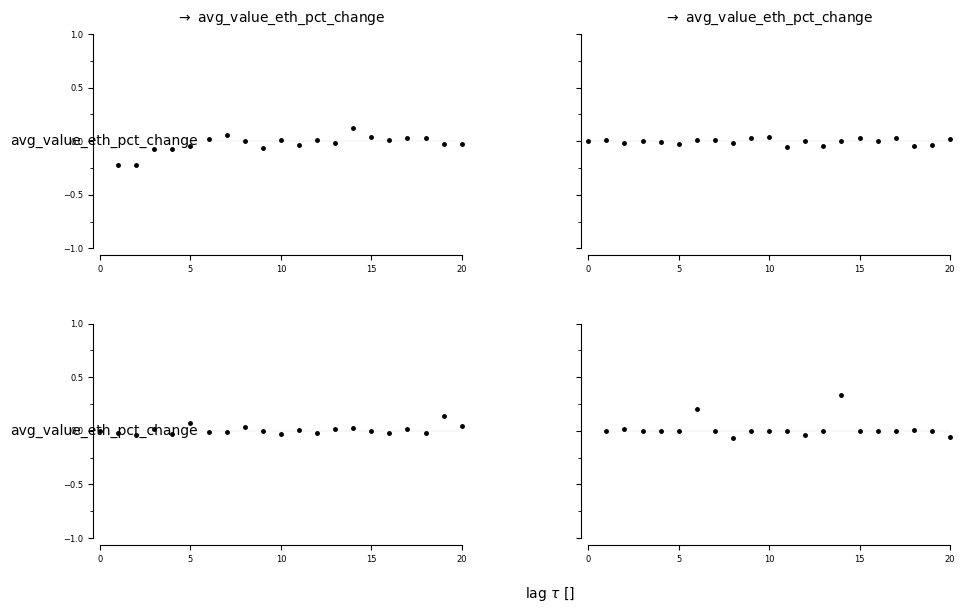


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


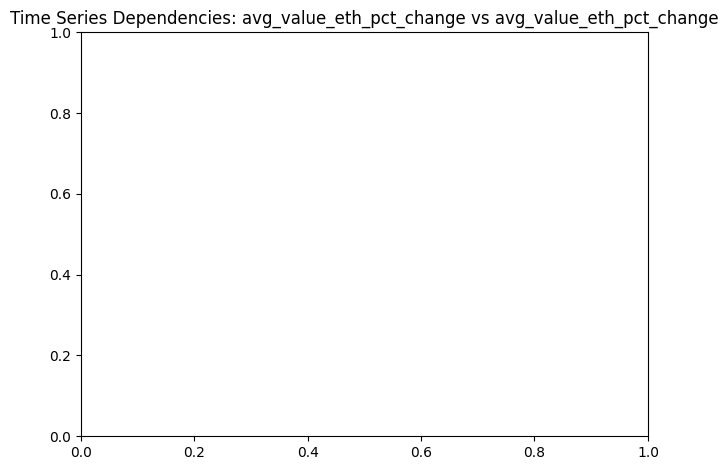

<Figure size 1000x600 with 0 Axes>

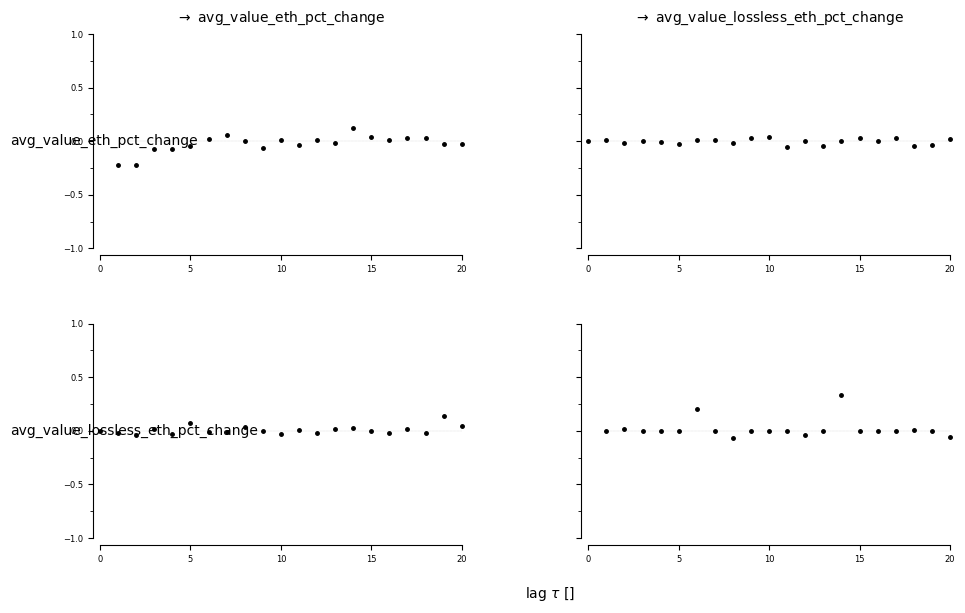


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


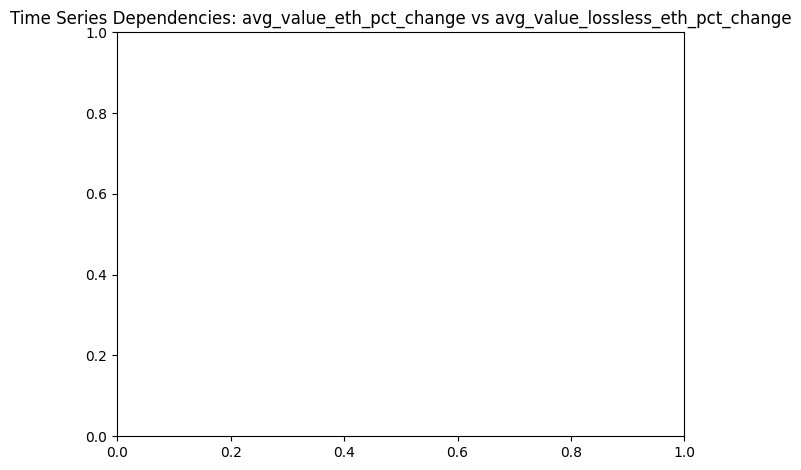

<Figure size 1000x600 with 0 Axes>

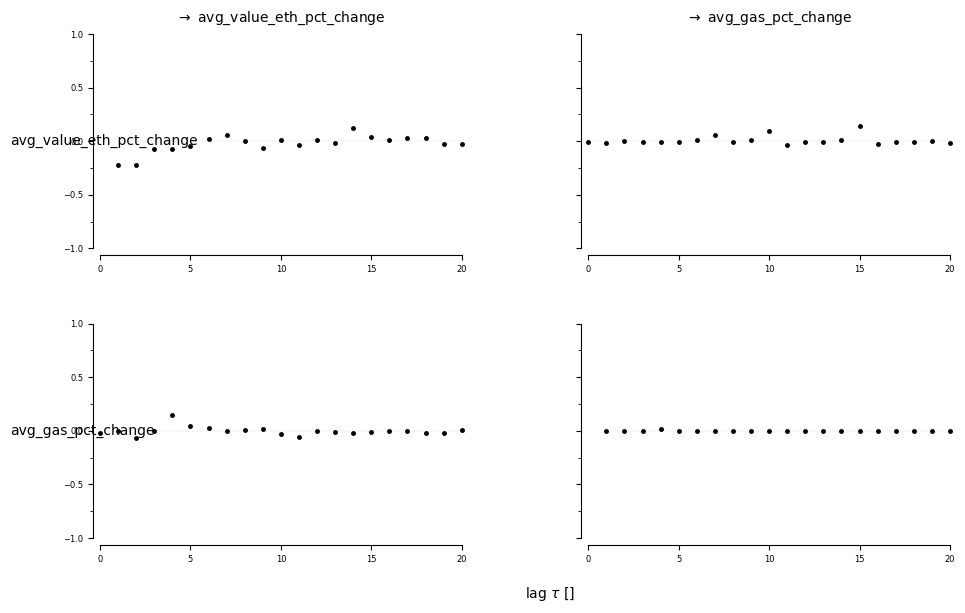


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


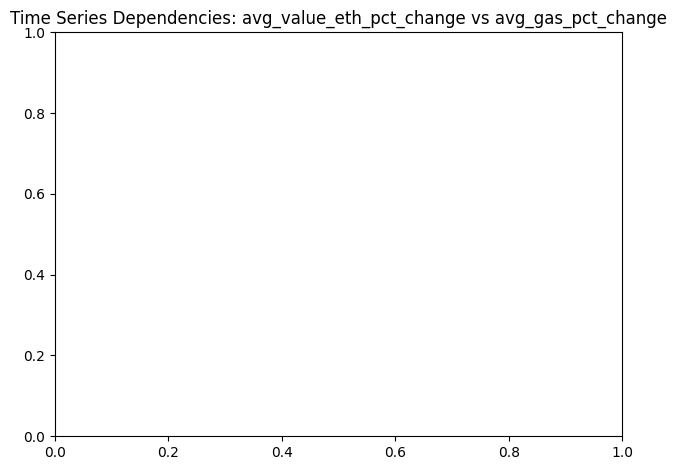

<Figure size 1000x600 with 0 Axes>

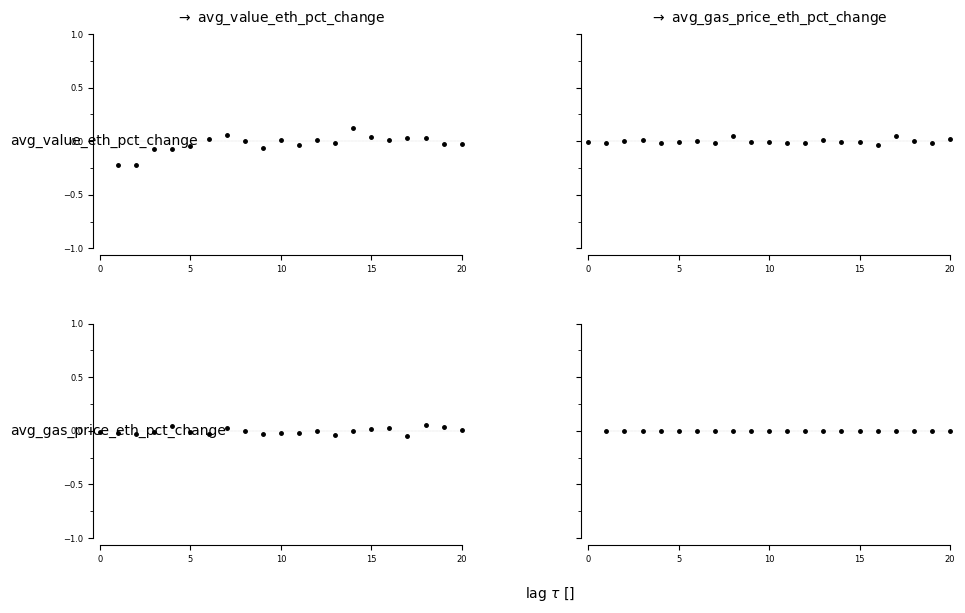


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


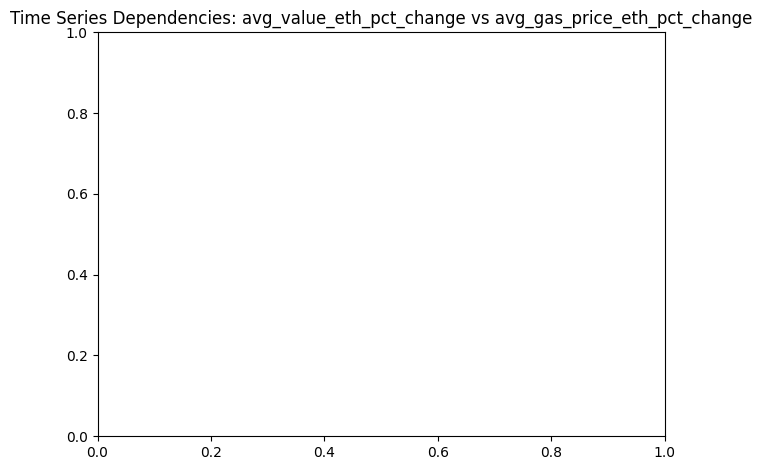

<Figure size 1000x600 with 0 Axes>

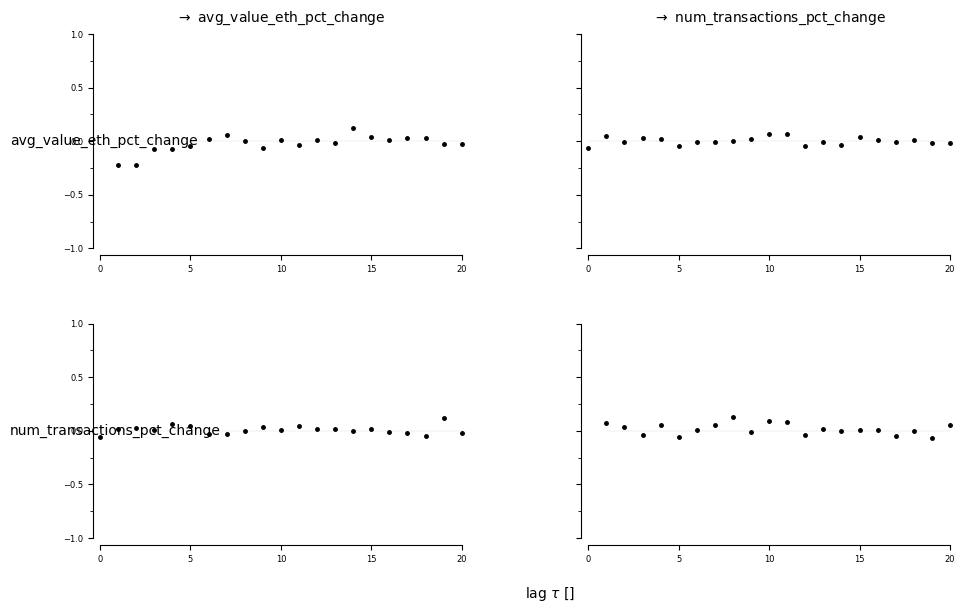


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


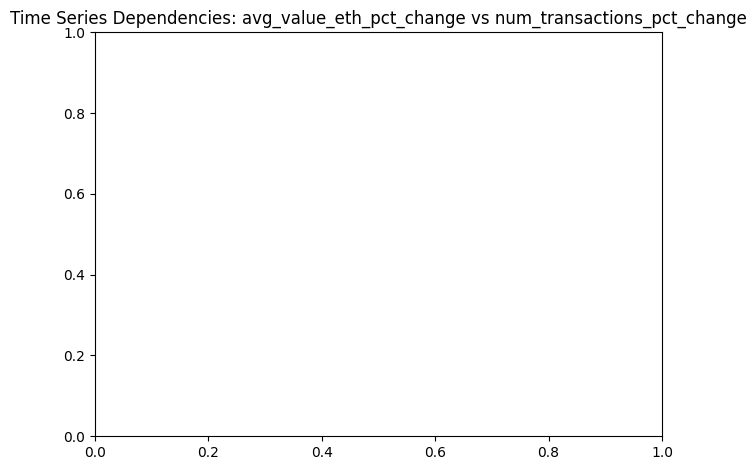

<Figure size 1000x600 with 0 Axes>

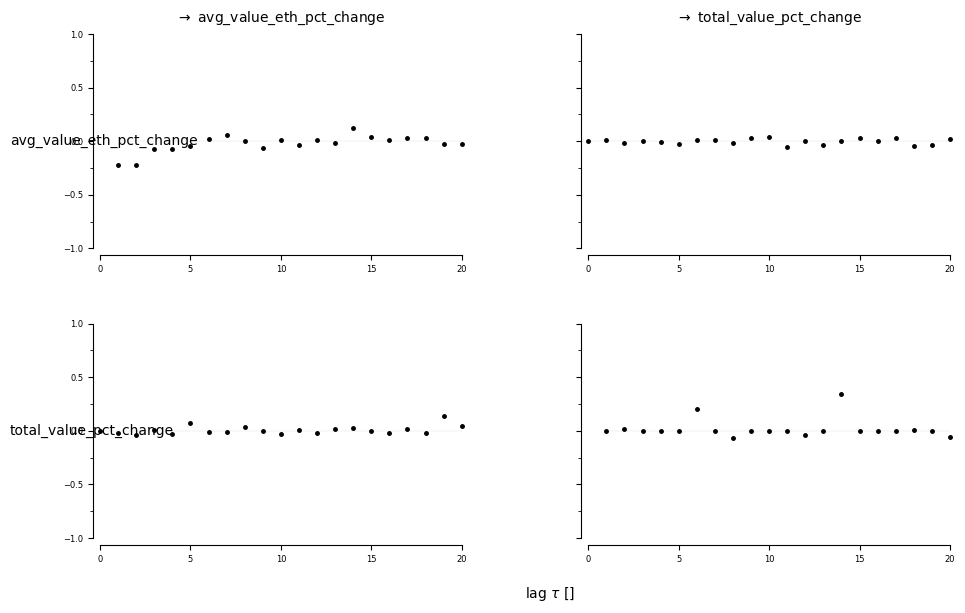


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


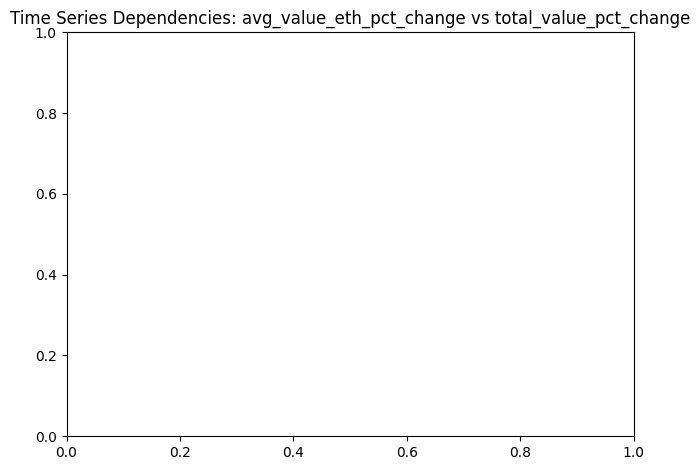

<Figure size 1000x600 with 0 Axes>

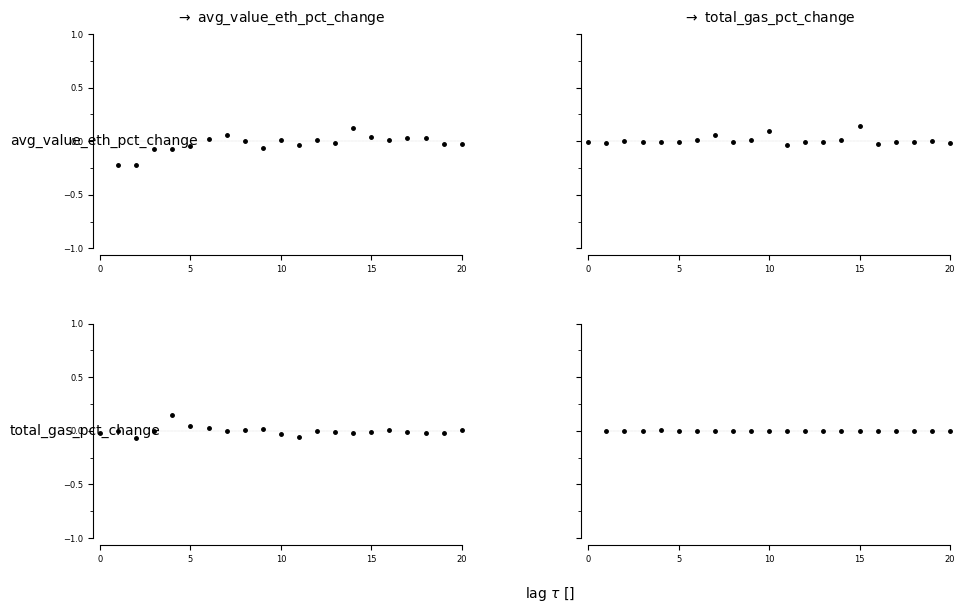


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


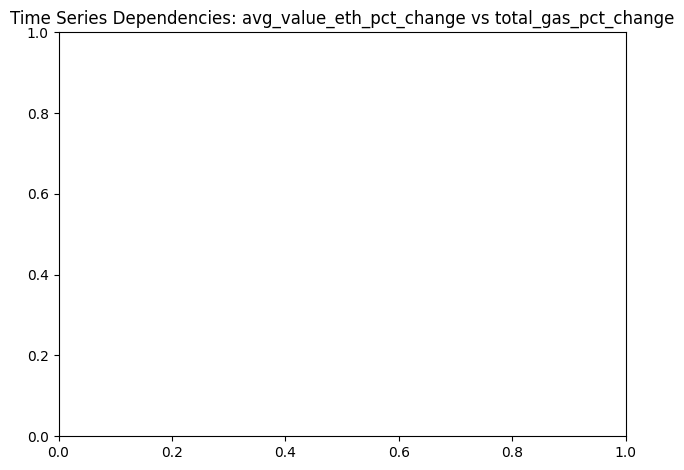

<Figure size 1000x600 with 0 Axes>

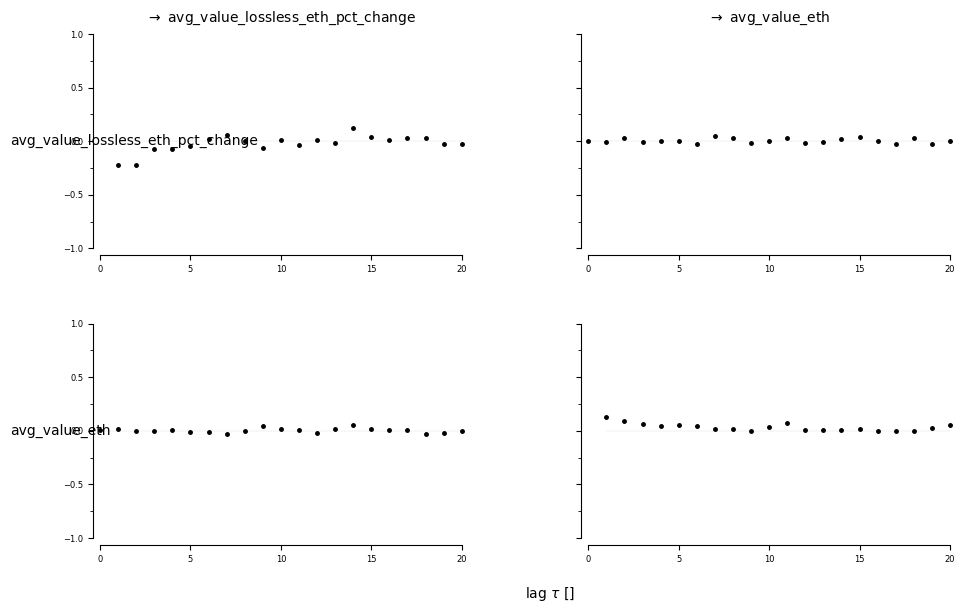


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


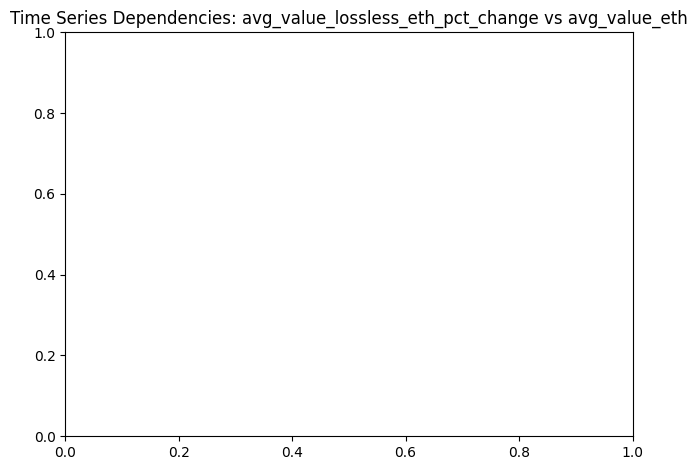

<Figure size 1000x600 with 0 Axes>

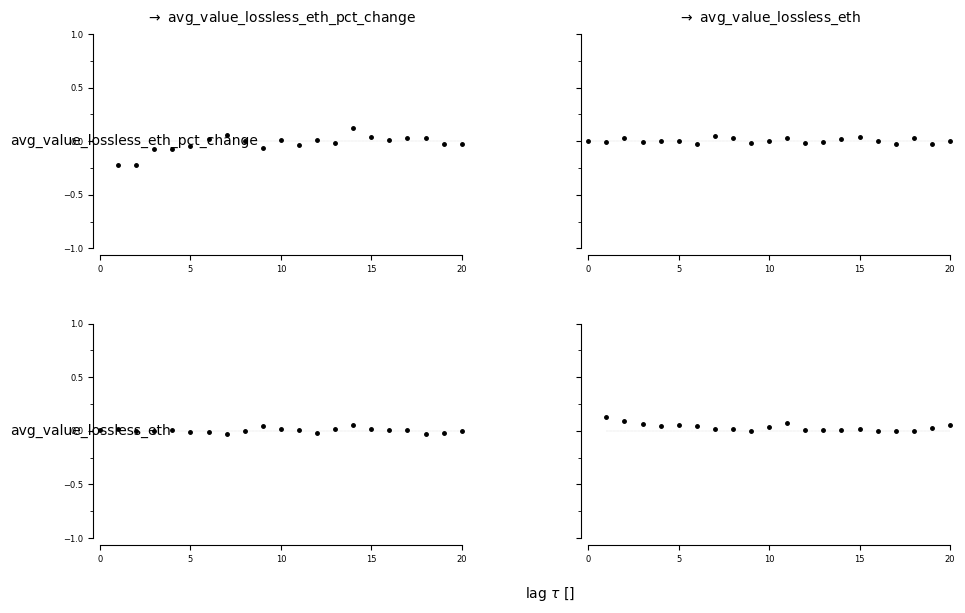


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


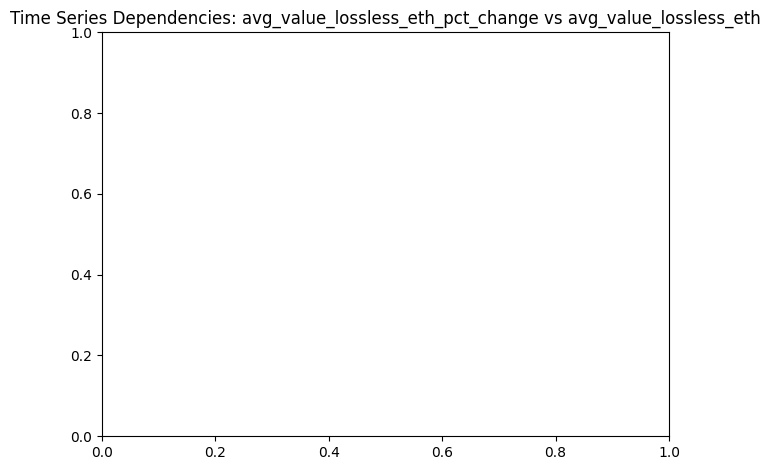

<Figure size 1000x600 with 0 Axes>

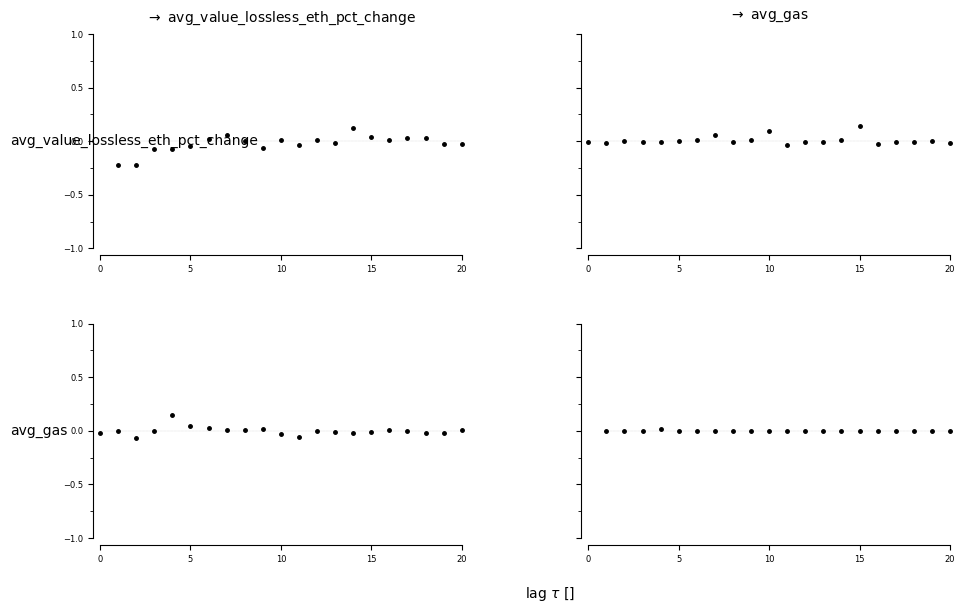


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


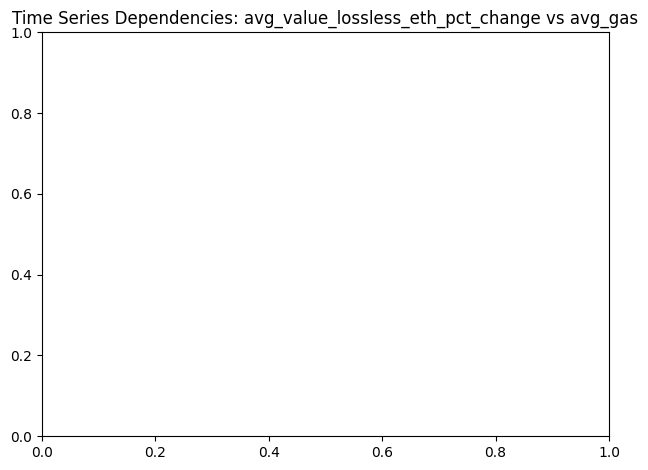

<Figure size 1000x600 with 0 Axes>

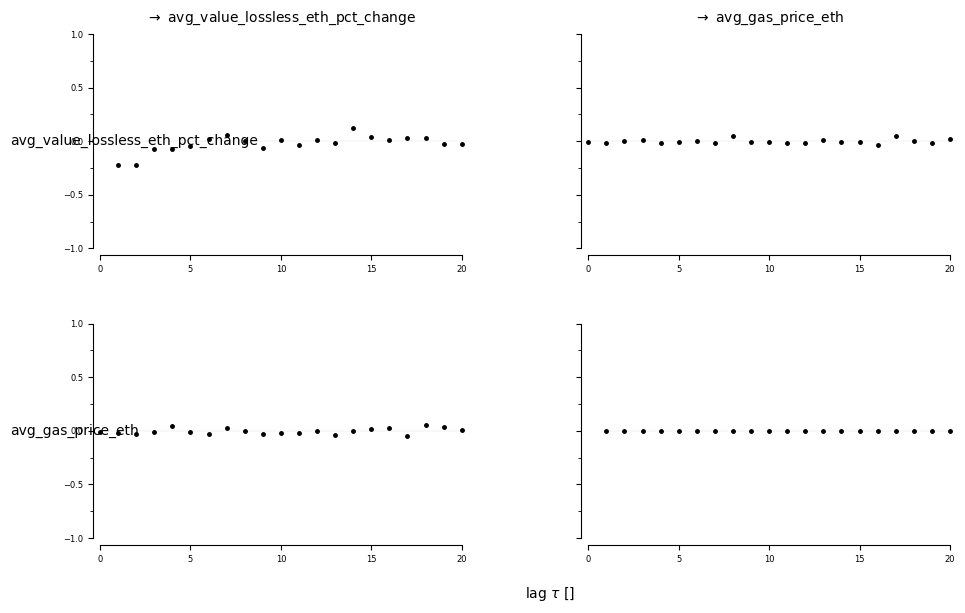


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


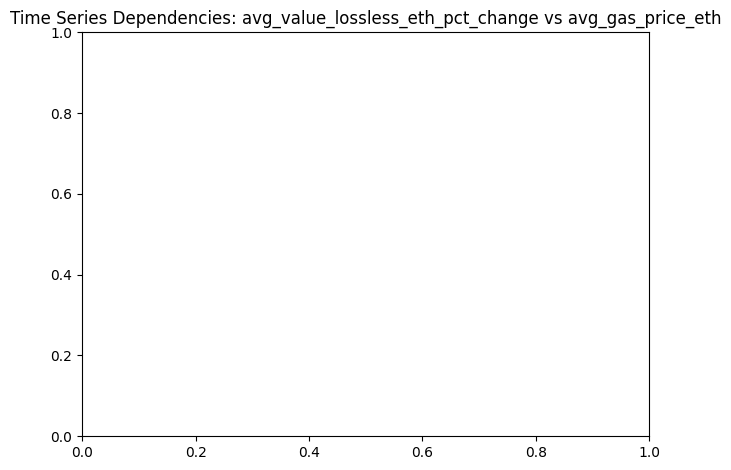

<Figure size 1000x600 with 0 Axes>

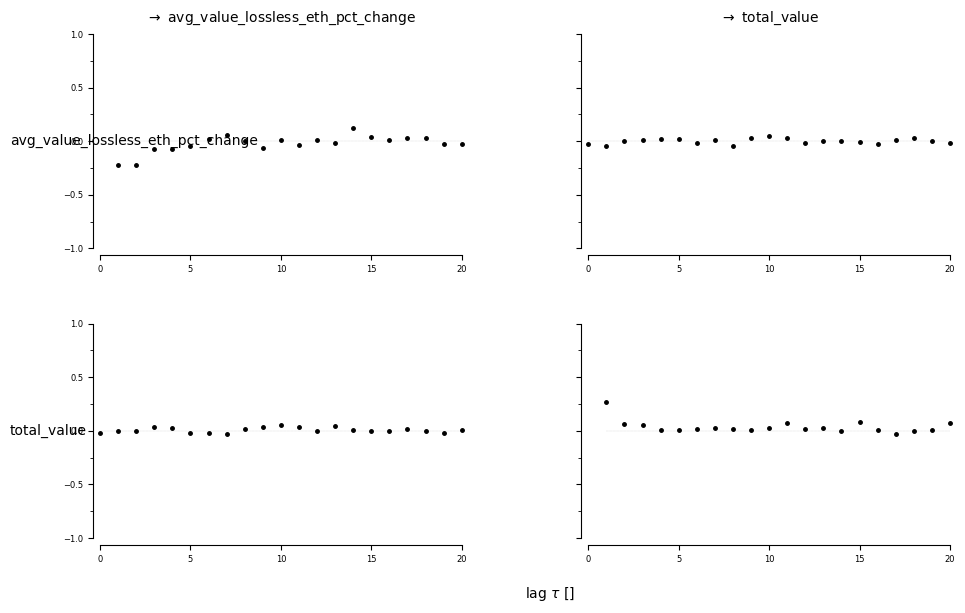


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


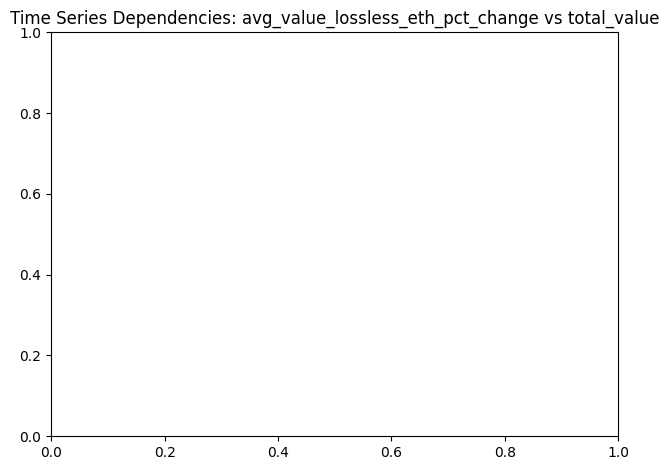

<Figure size 1000x600 with 0 Axes>

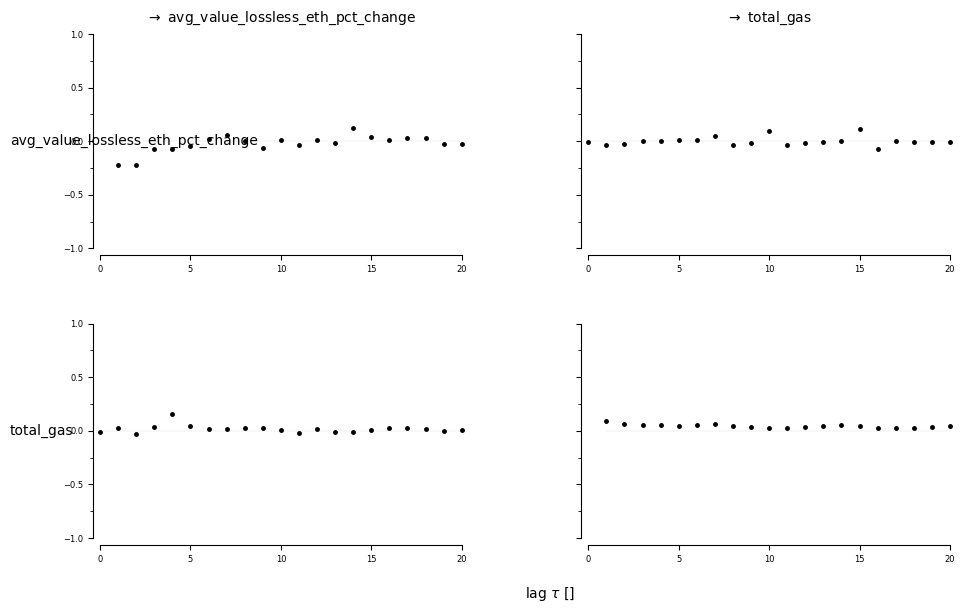


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


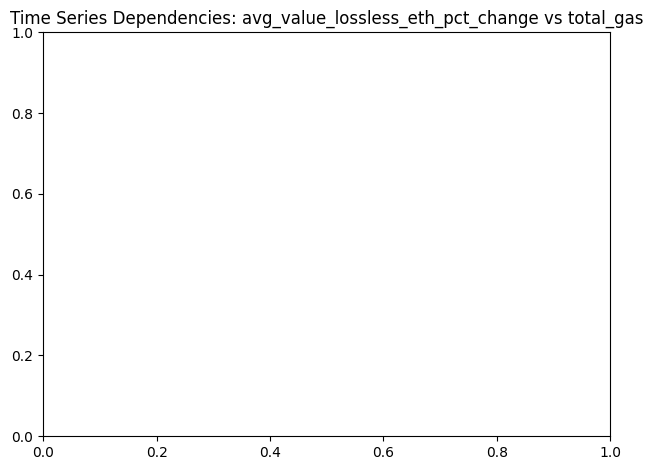

<Figure size 1000x600 with 0 Axes>

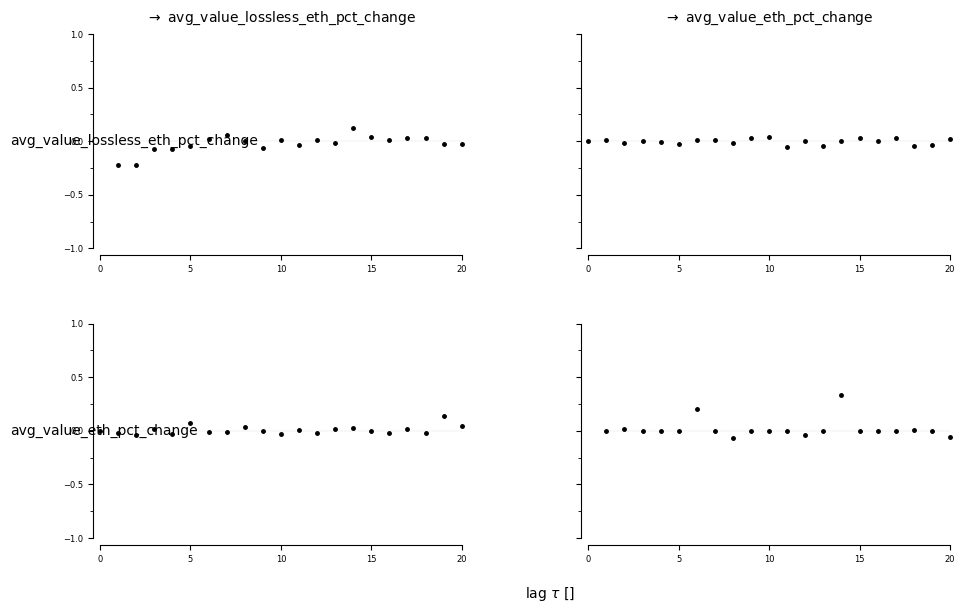


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


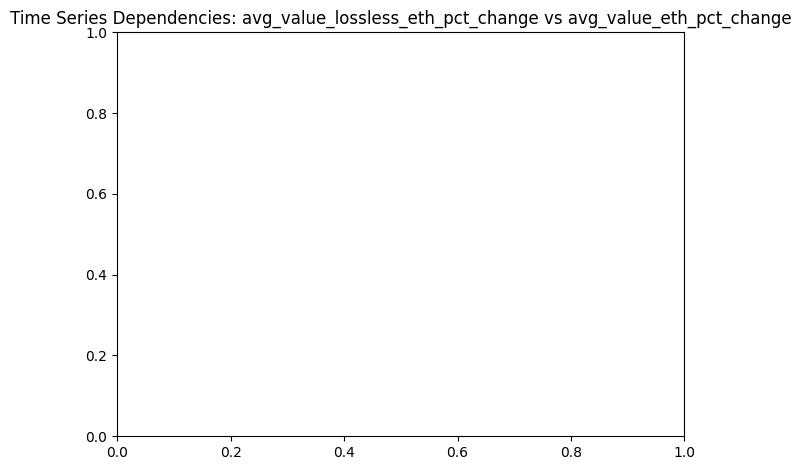

<Figure size 1000x600 with 0 Axes>

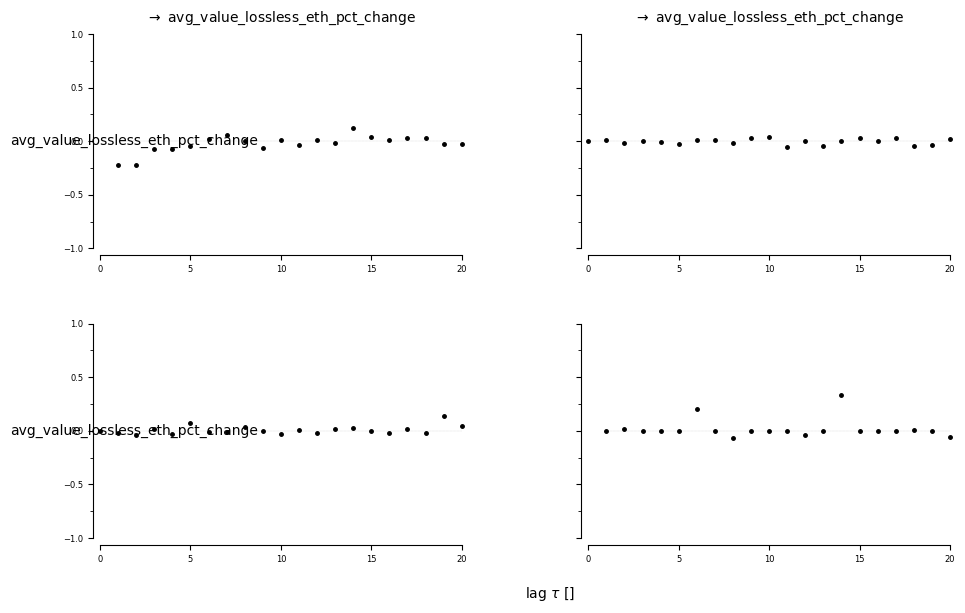


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


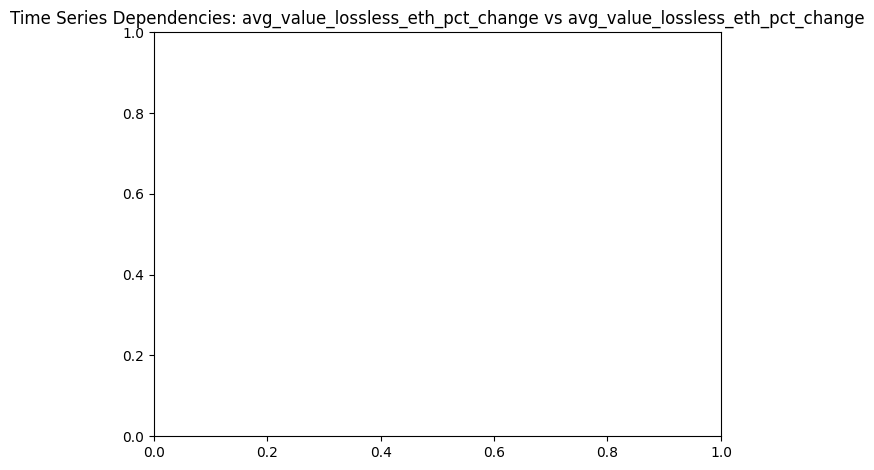

<Figure size 1000x600 with 0 Axes>

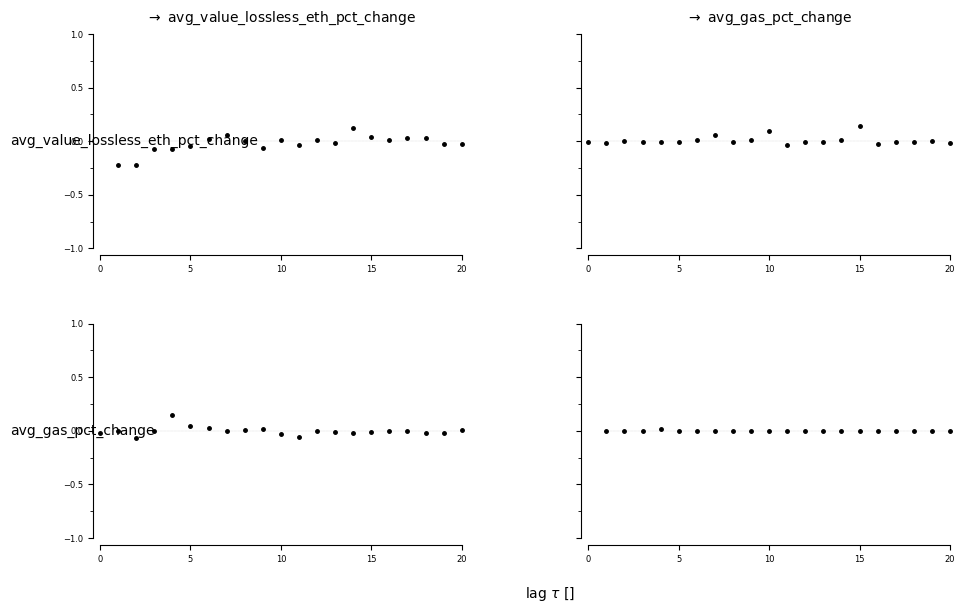


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


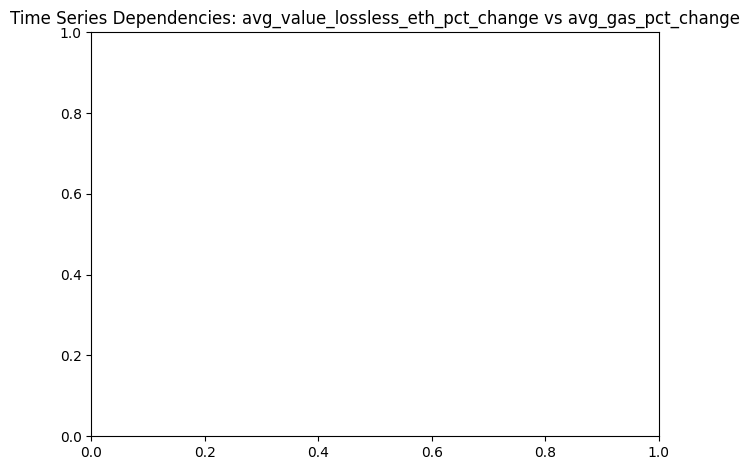

<Figure size 1000x600 with 0 Axes>

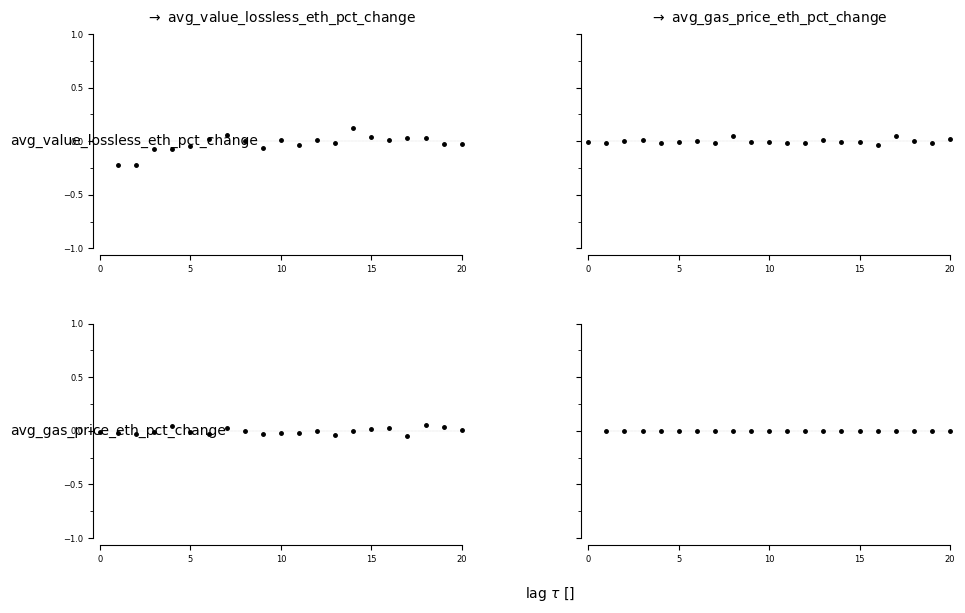


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


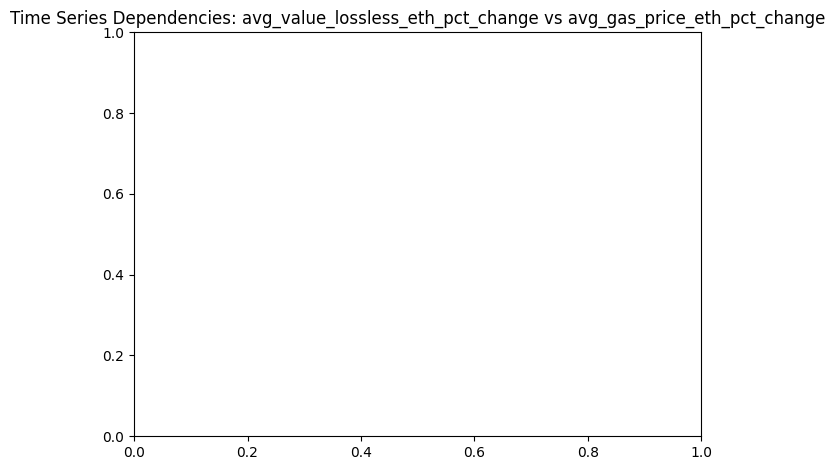

<Figure size 1000x600 with 0 Axes>

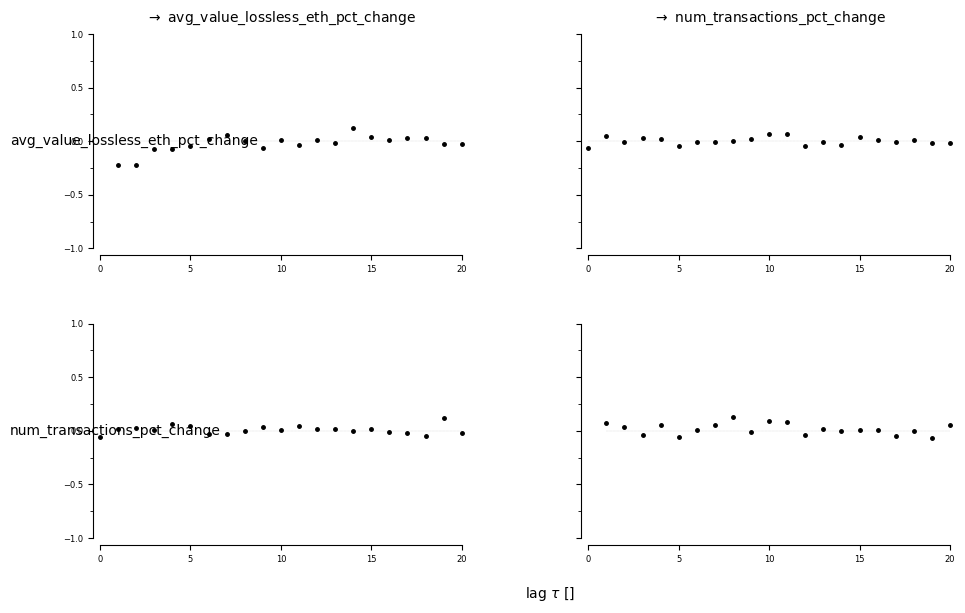


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


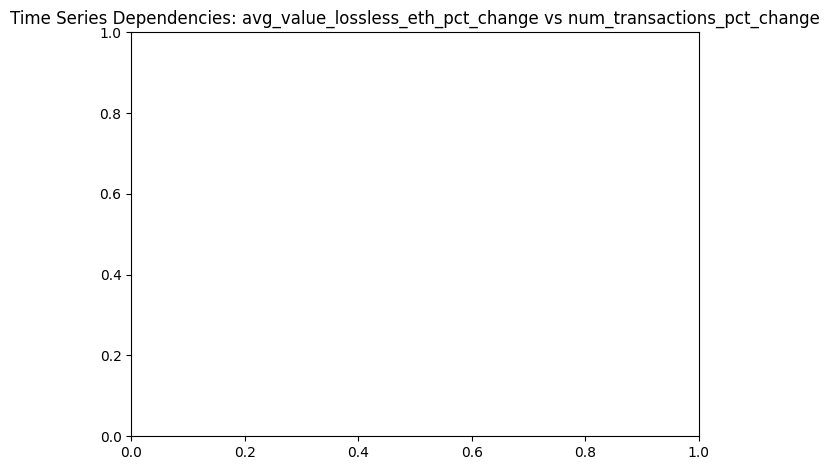

<Figure size 1000x600 with 0 Axes>

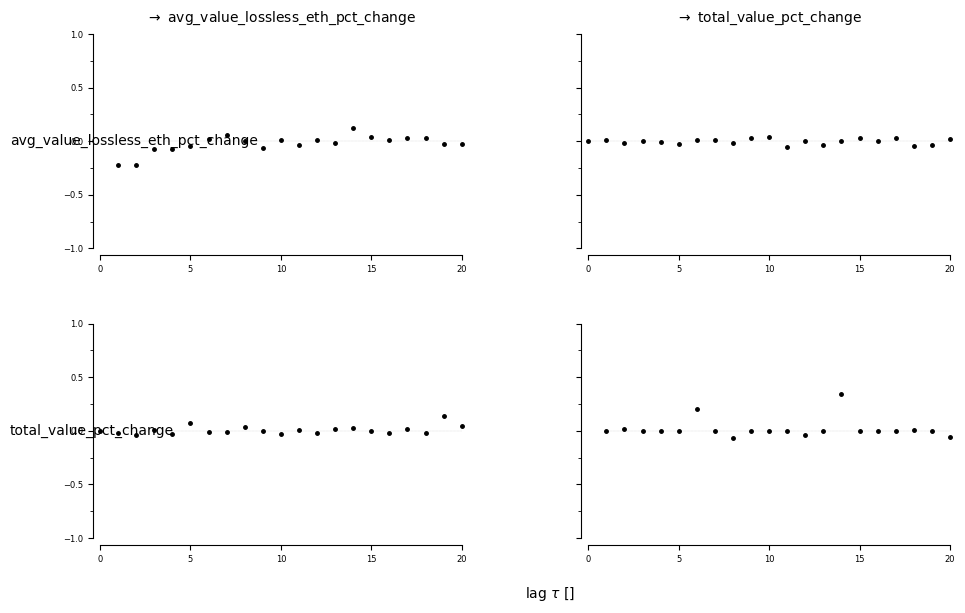


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


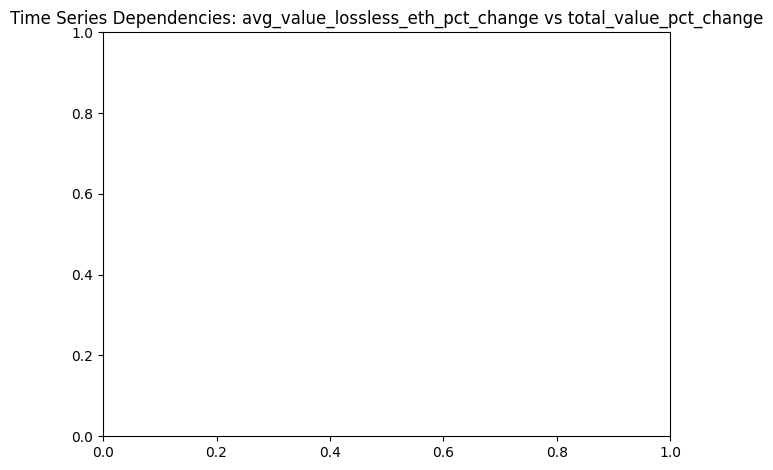

<Figure size 1000x600 with 0 Axes>

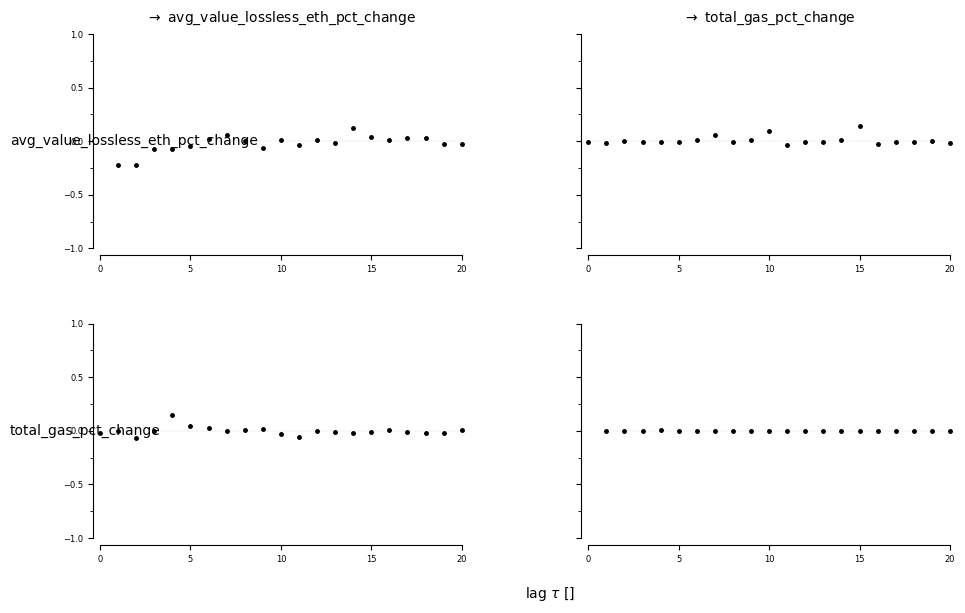


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


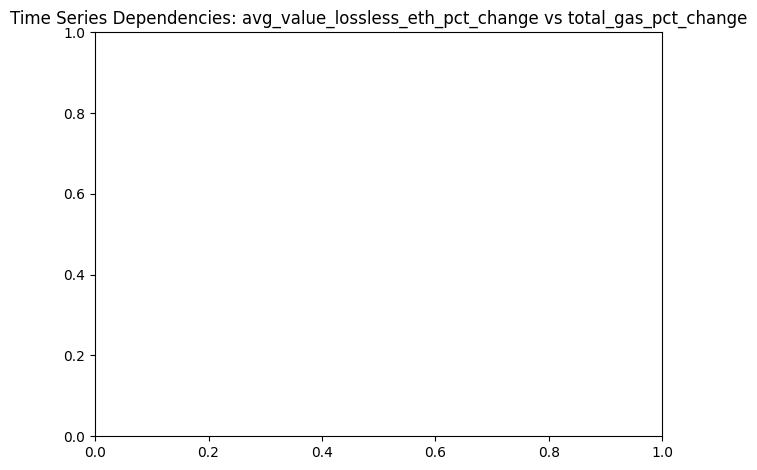

<Figure size 1000x600 with 0 Axes>

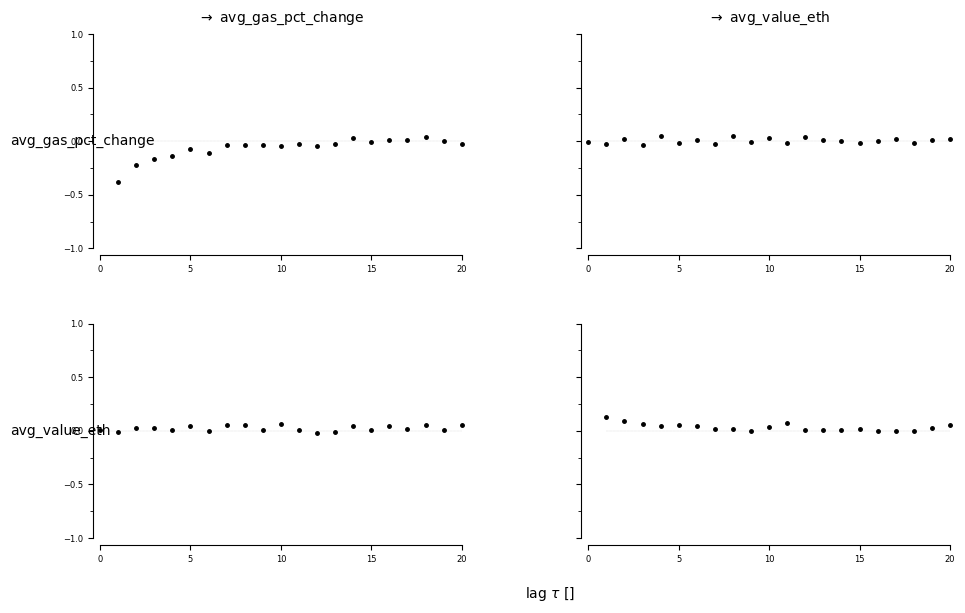


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


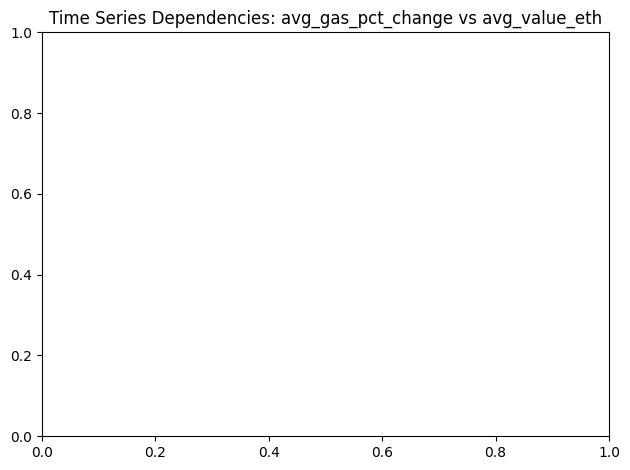

<Figure size 1000x600 with 0 Axes>

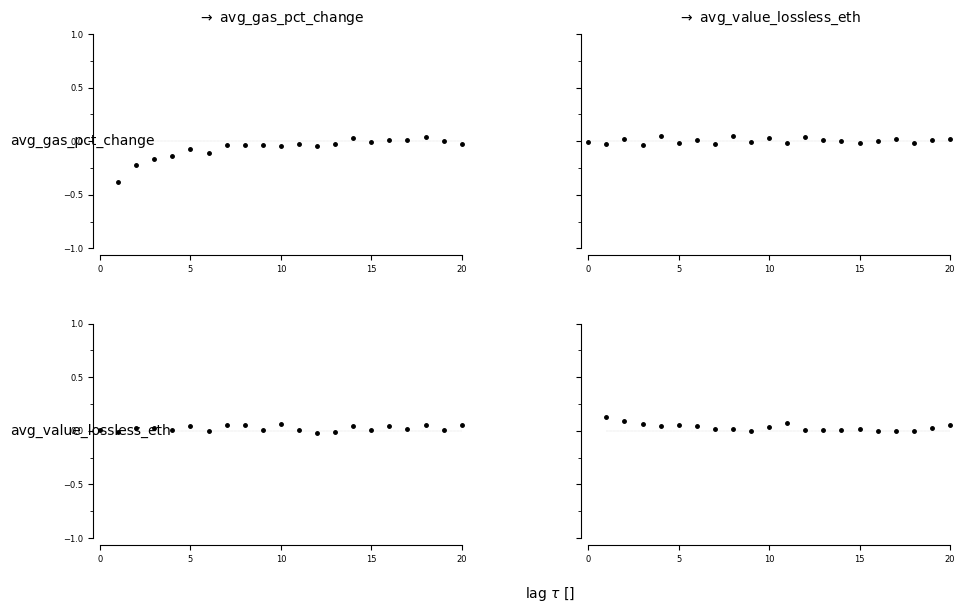


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


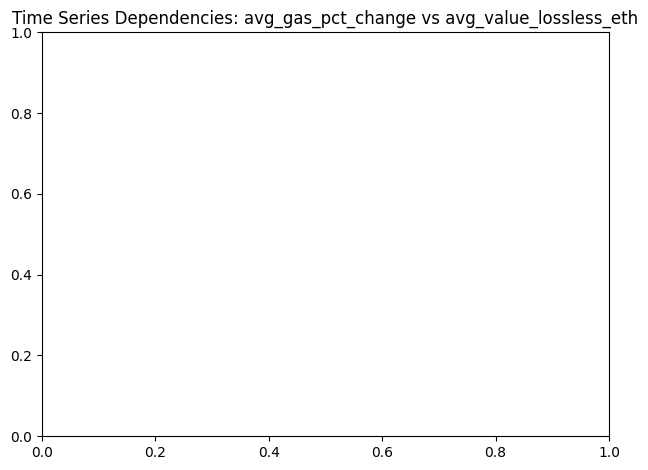

<Figure size 1000x600 with 0 Axes>

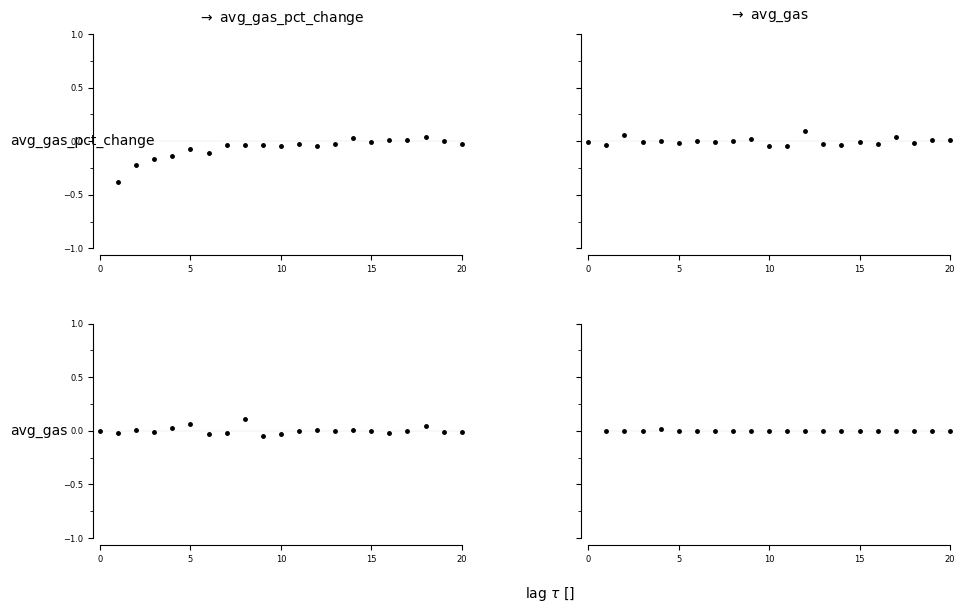


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


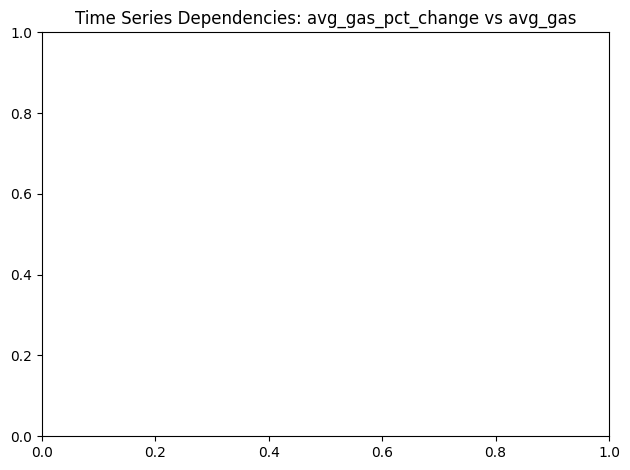

<Figure size 1000x600 with 0 Axes>

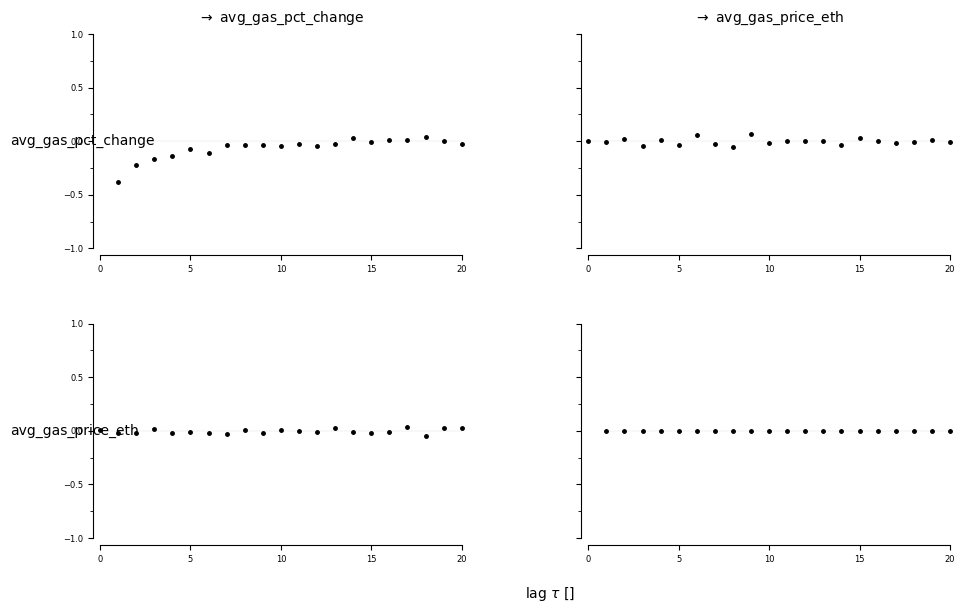


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


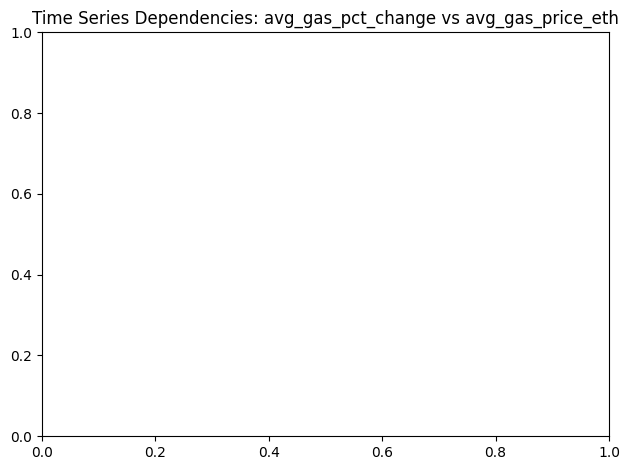

<Figure size 1000x600 with 0 Axes>

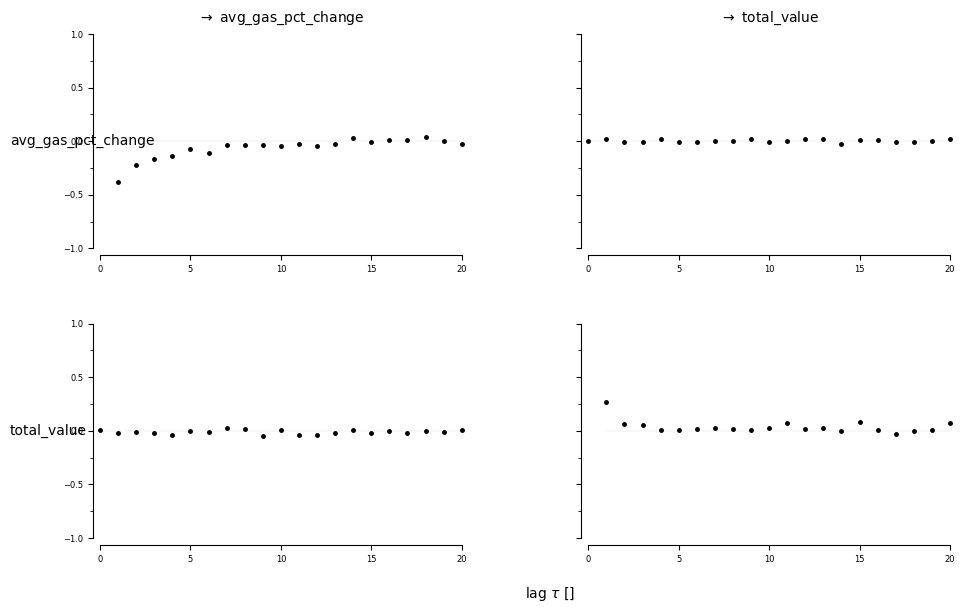


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


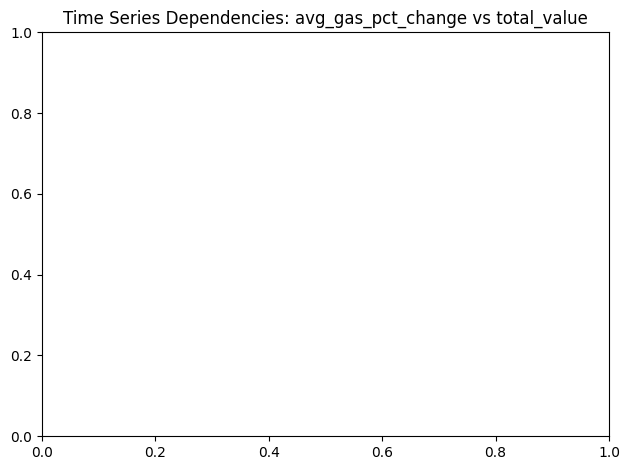

<Figure size 1000x600 with 0 Axes>

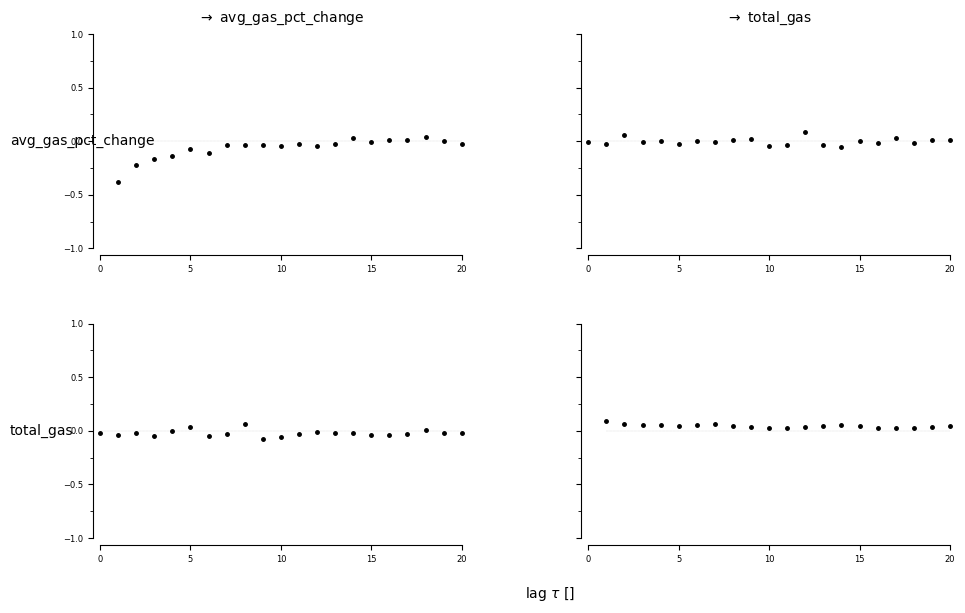


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


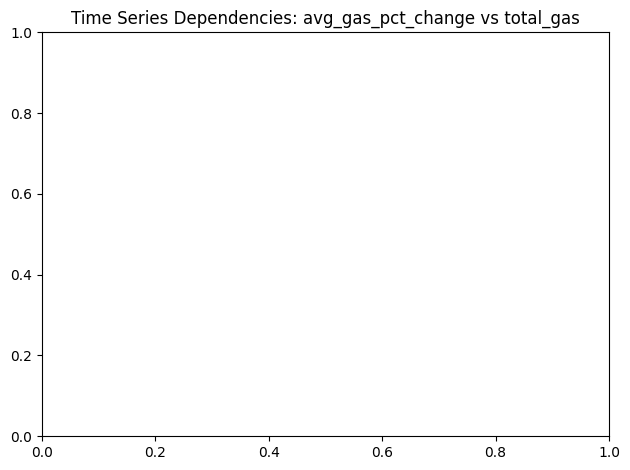

<Figure size 1000x600 with 0 Axes>

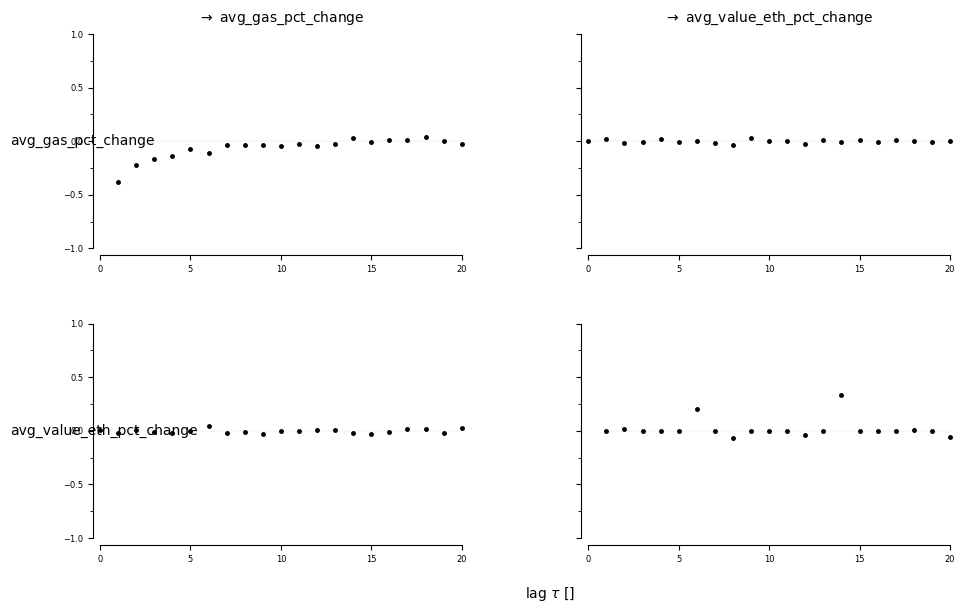


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


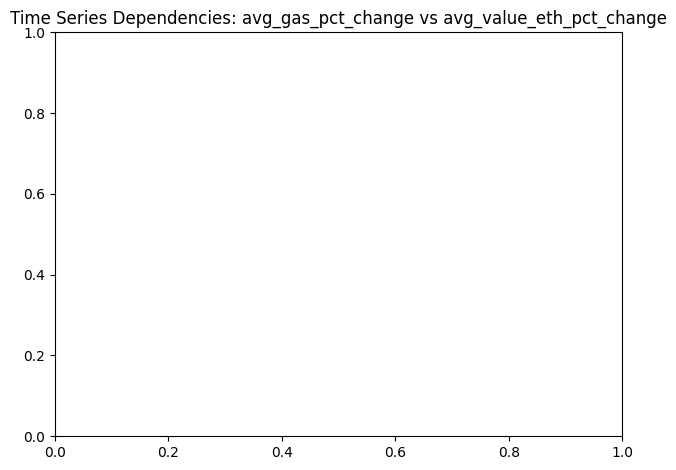

<Figure size 1000x600 with 0 Axes>

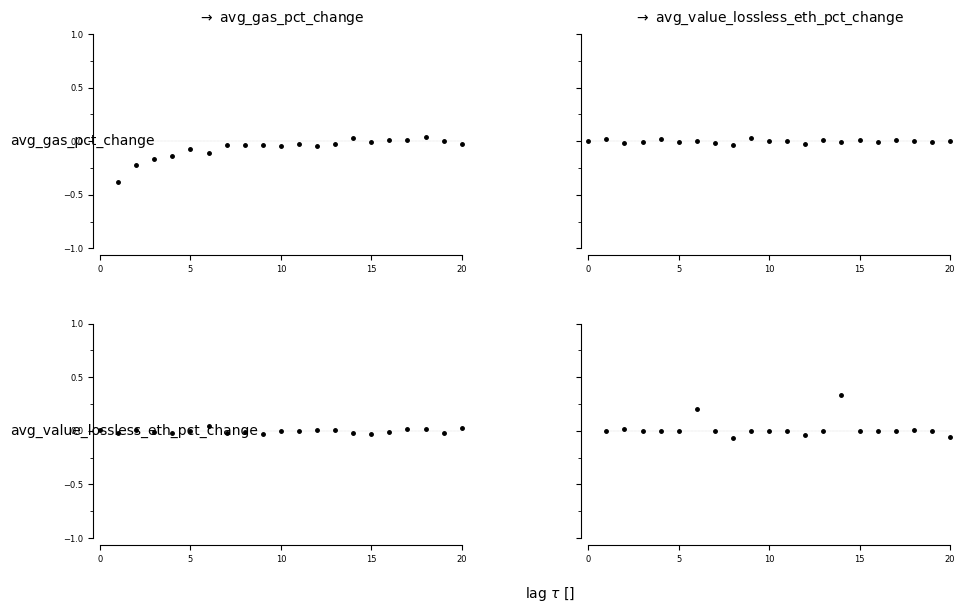


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


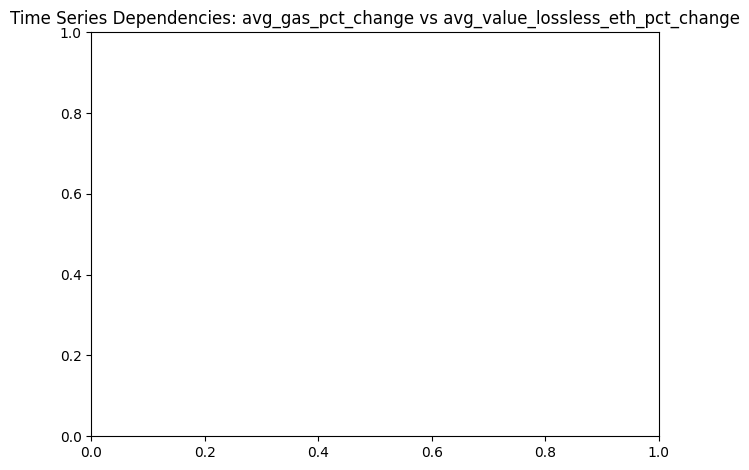

<Figure size 1000x600 with 0 Axes>

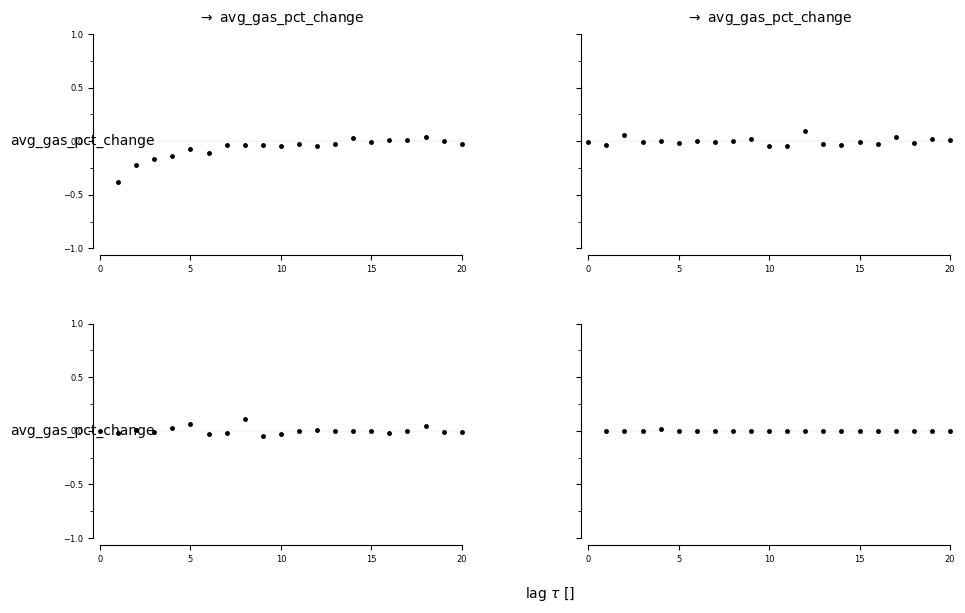


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


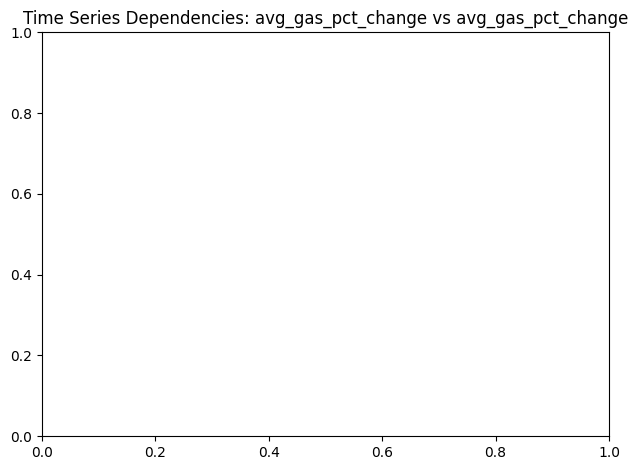

<Figure size 1000x600 with 0 Axes>

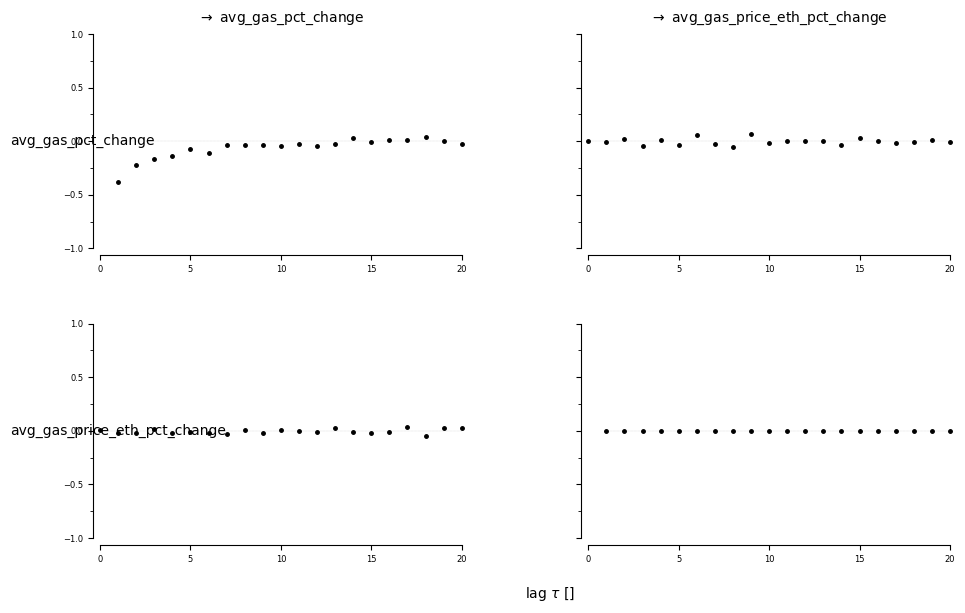


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


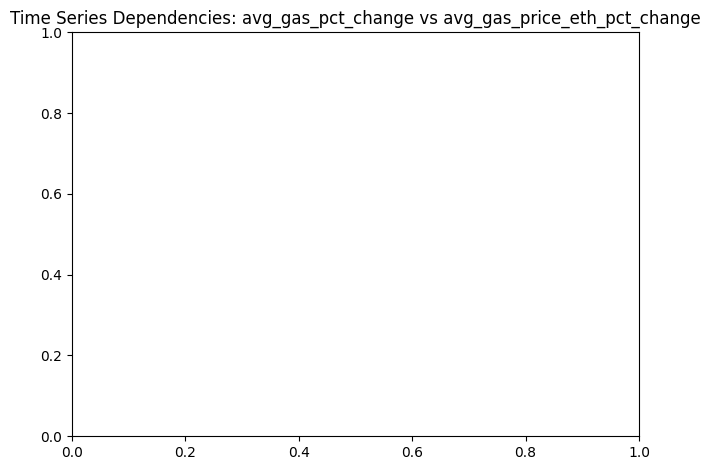

<Figure size 1000x600 with 0 Axes>

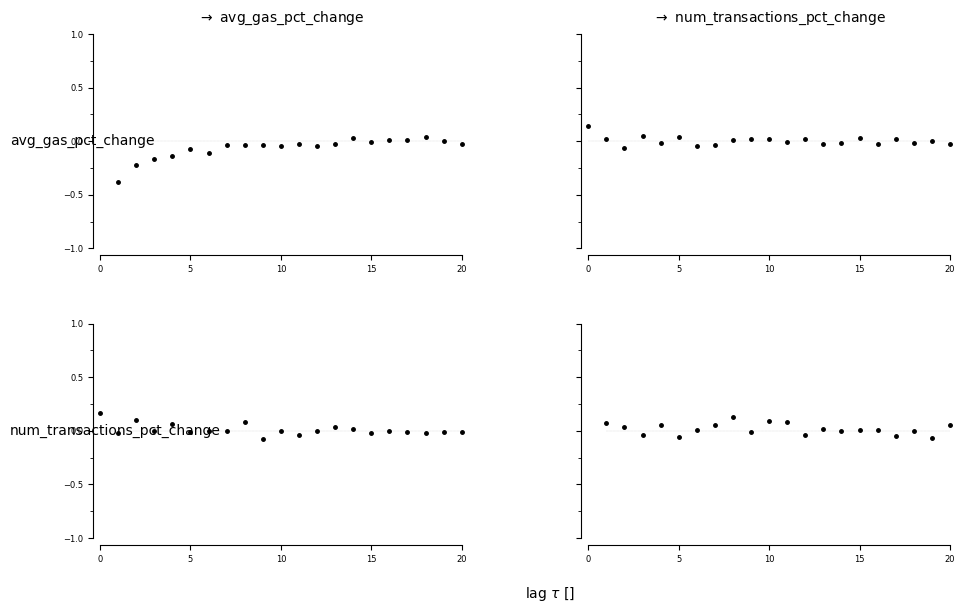


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


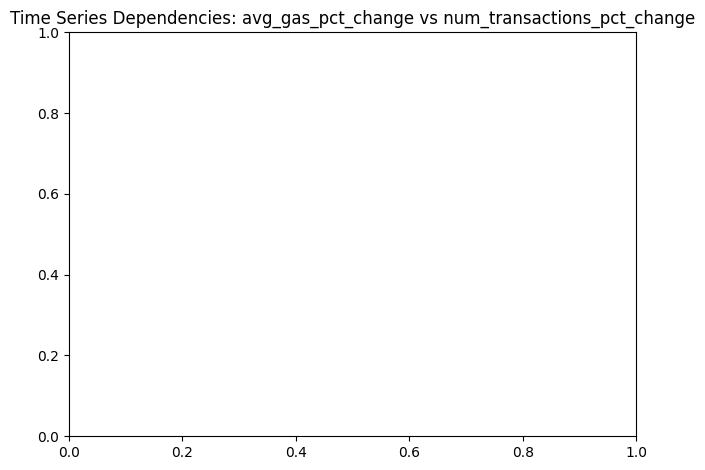

<Figure size 1000x600 with 0 Axes>

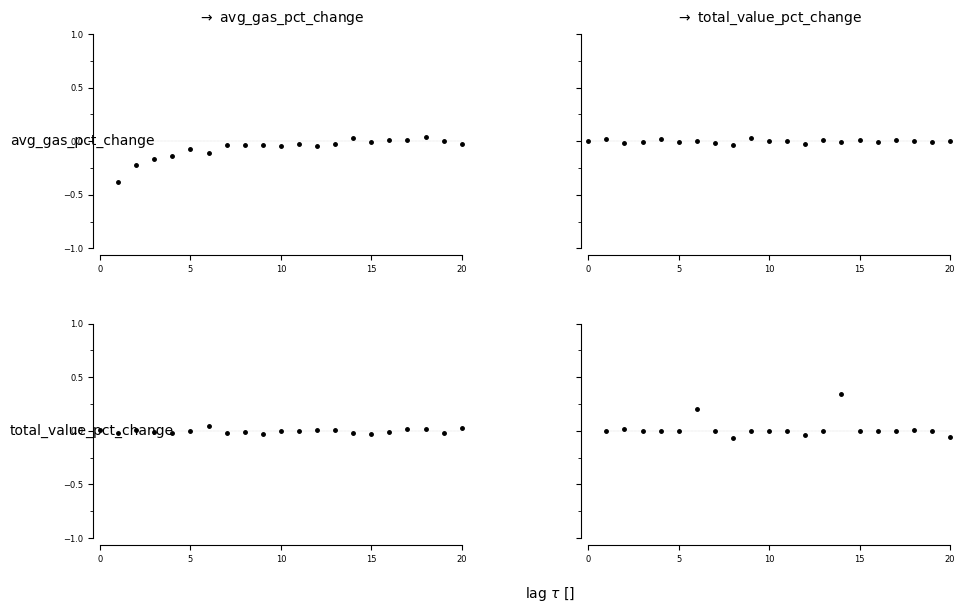


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


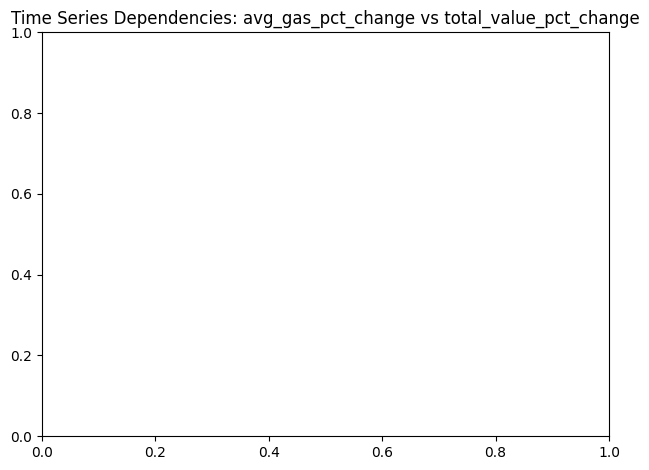

<Figure size 1000x600 with 0 Axes>

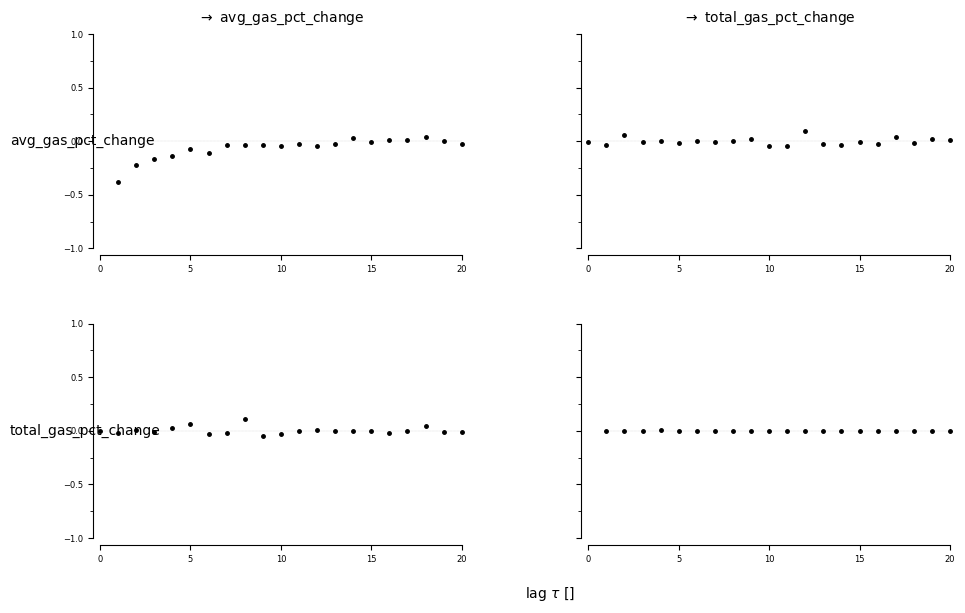


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


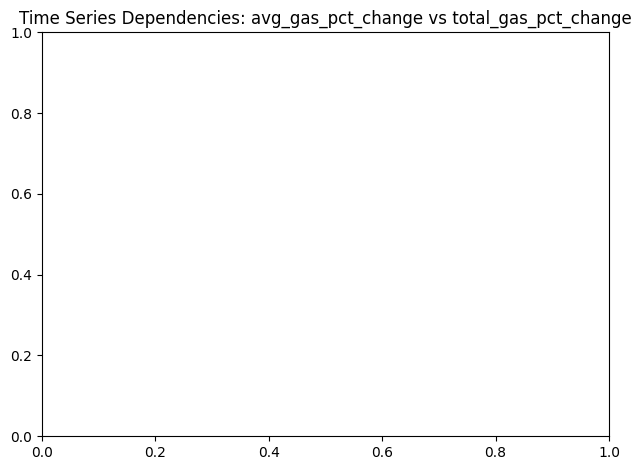

<Figure size 1000x600 with 0 Axes>

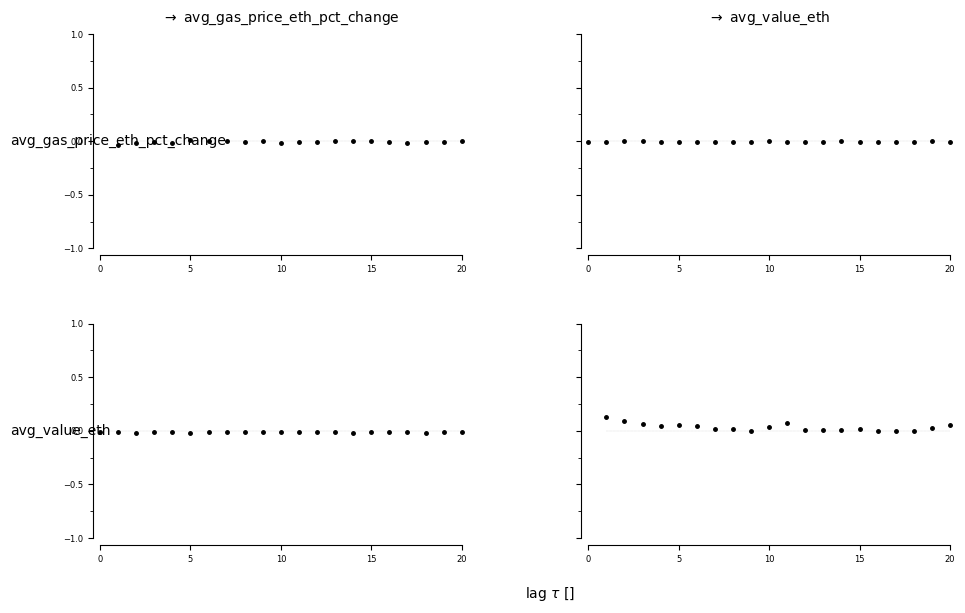


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


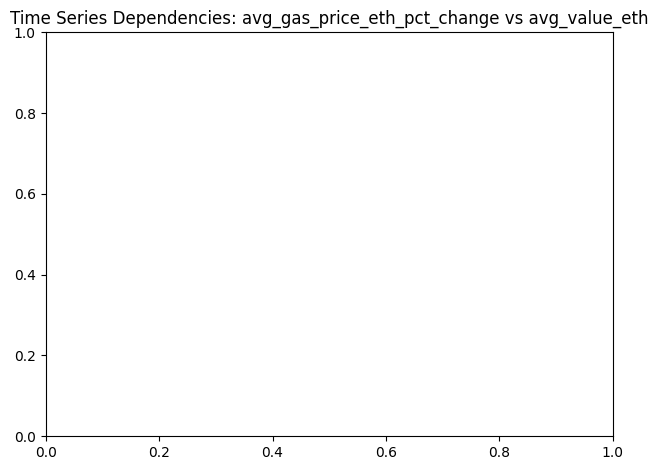

<Figure size 1000x600 with 0 Axes>

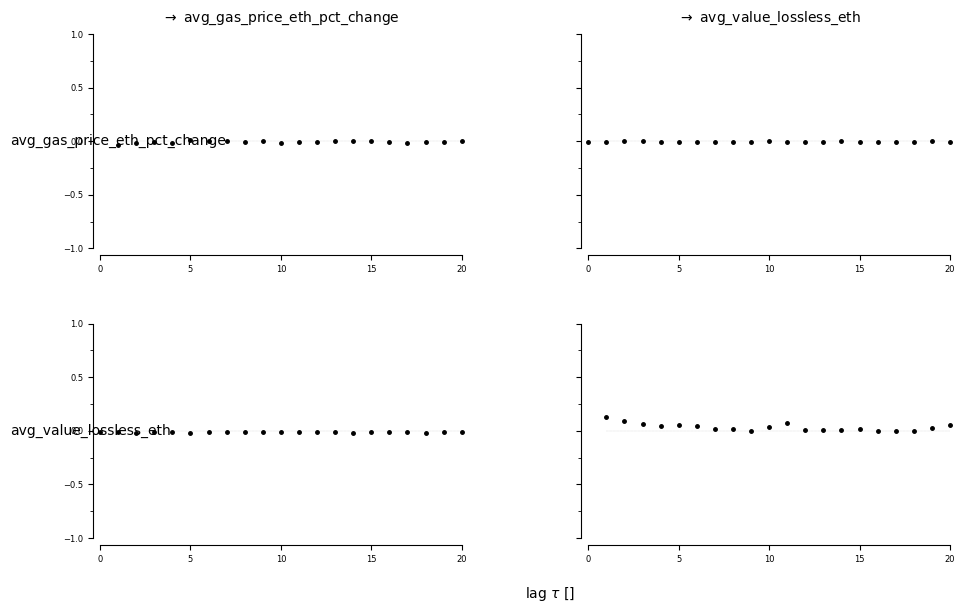


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


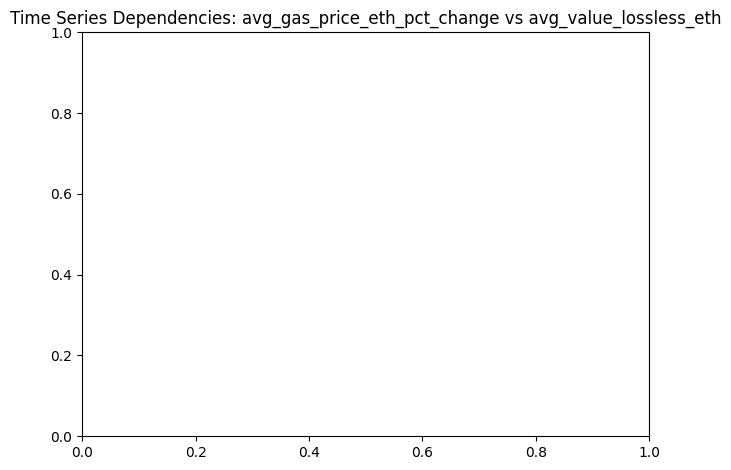

<Figure size 1000x600 with 0 Axes>

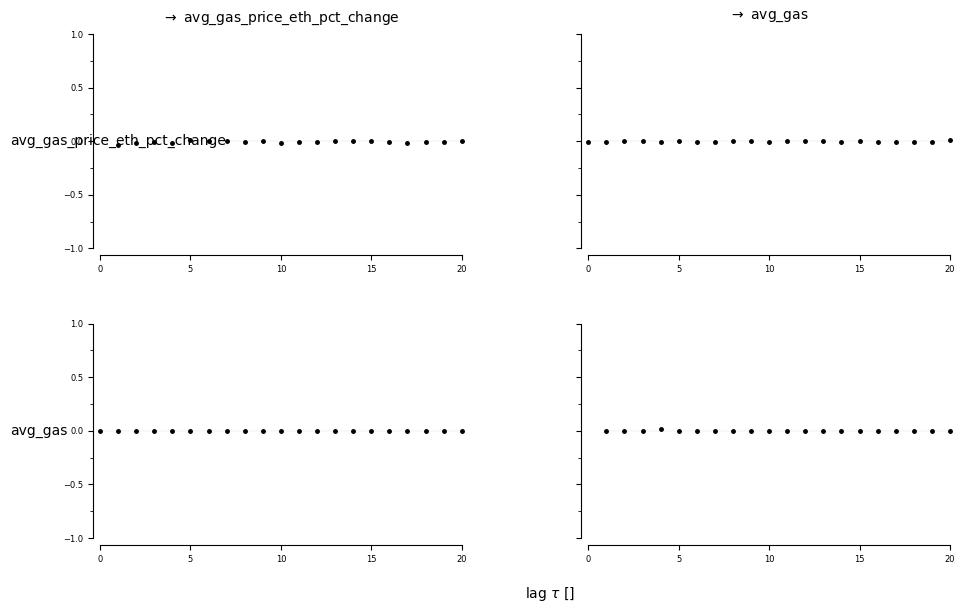


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


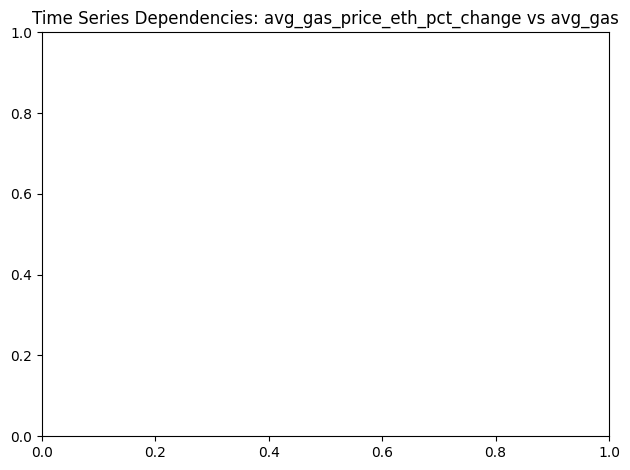

<Figure size 1000x600 with 0 Axes>

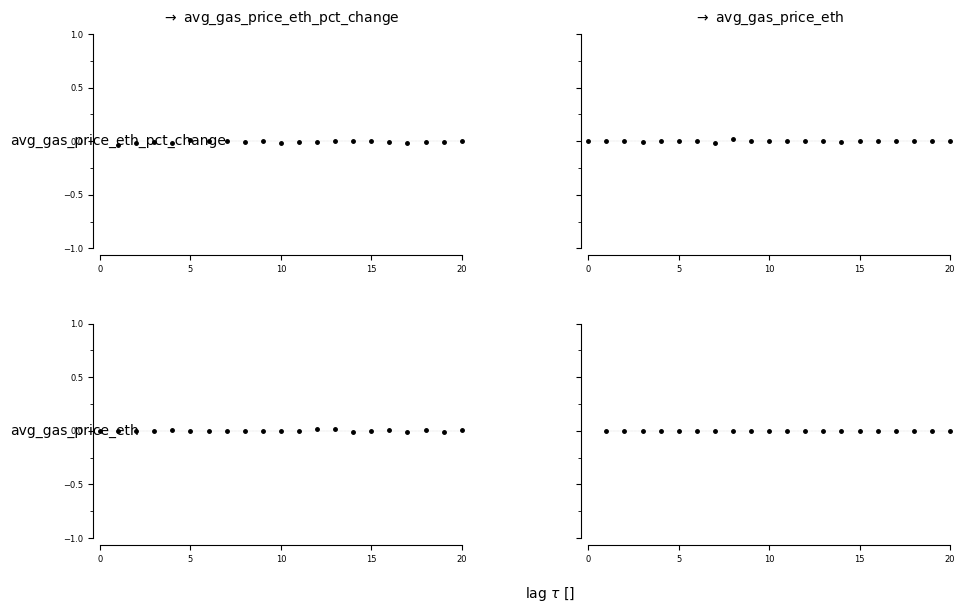


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


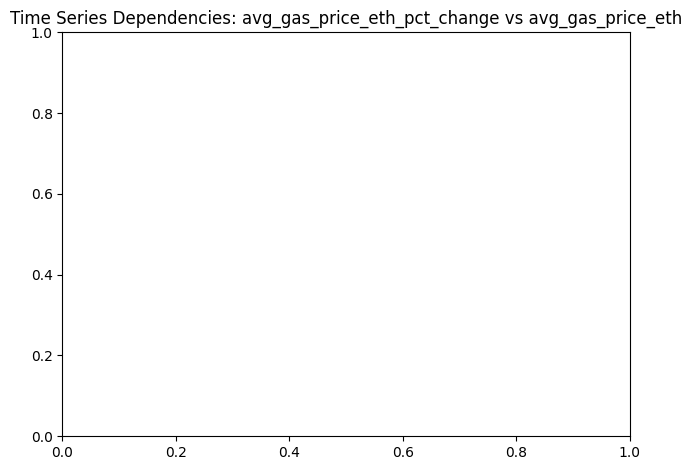

<Figure size 1000x600 with 0 Axes>

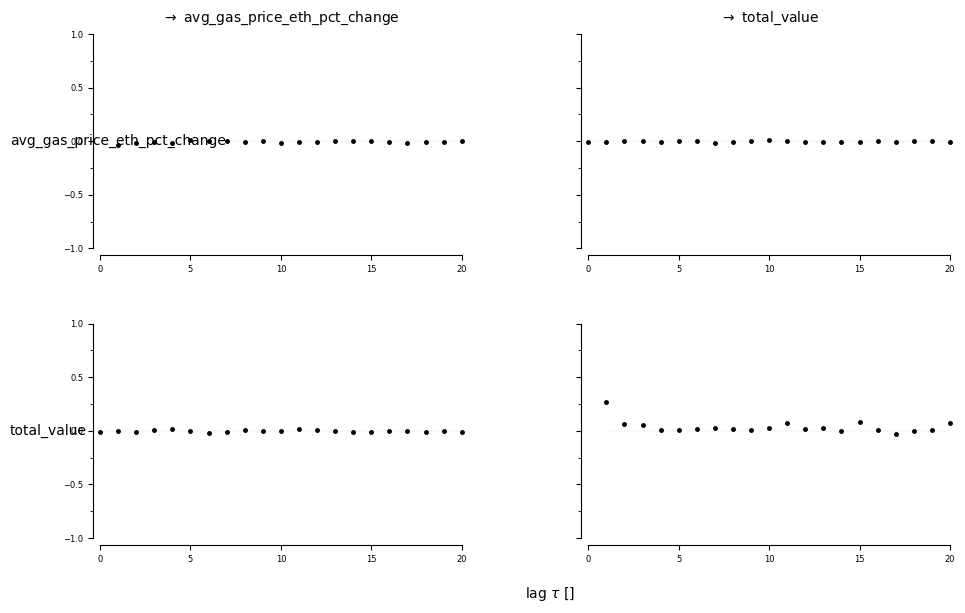


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


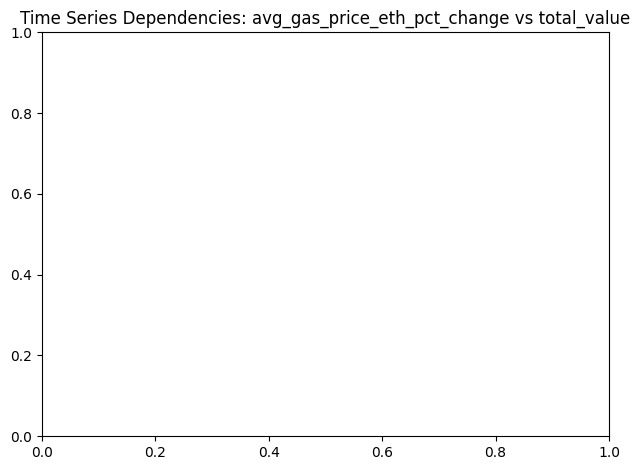

<Figure size 1000x600 with 0 Axes>

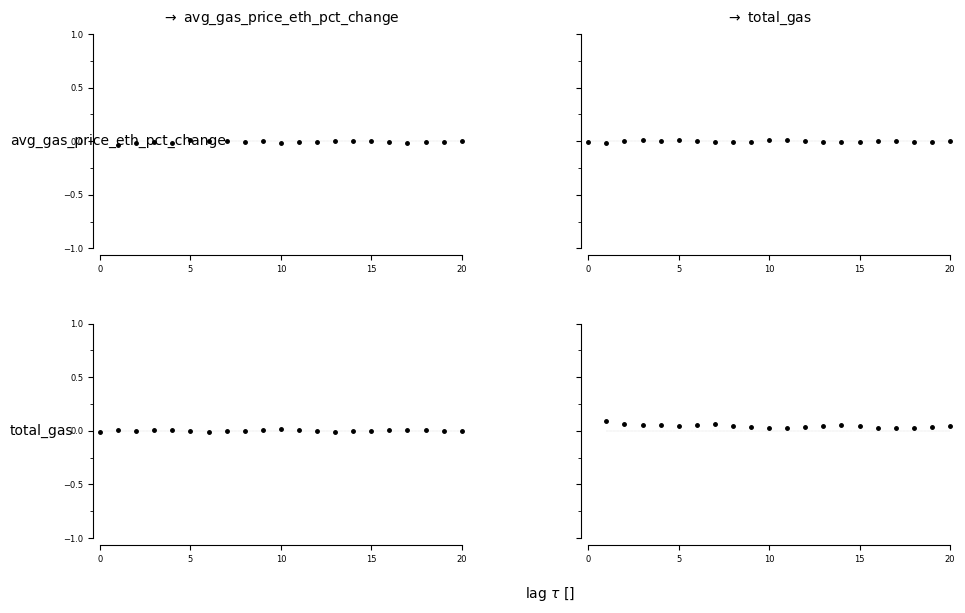


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


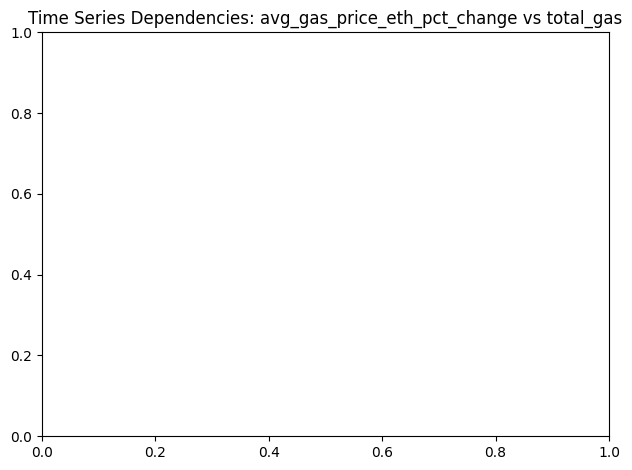

<Figure size 1000x600 with 0 Axes>

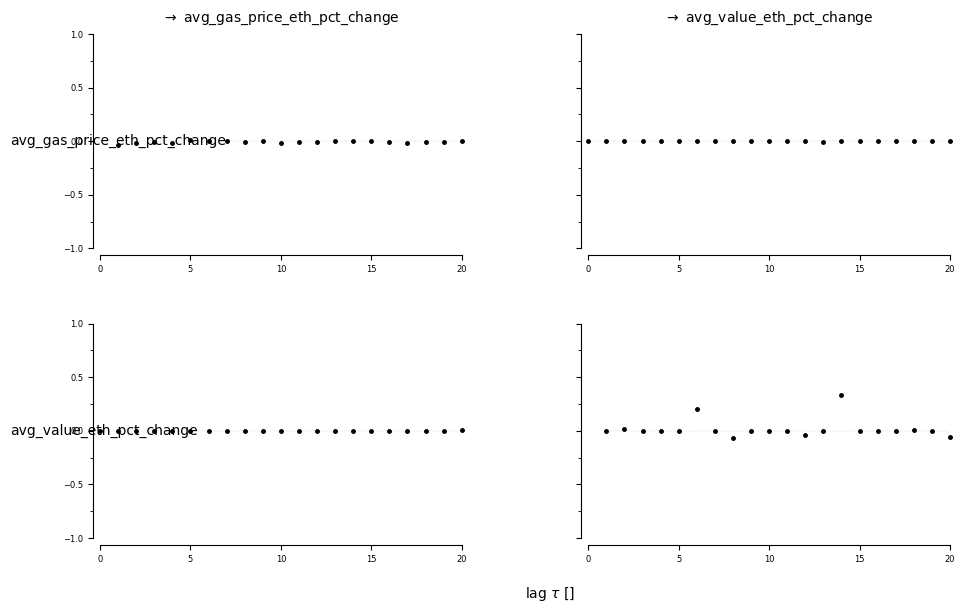


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


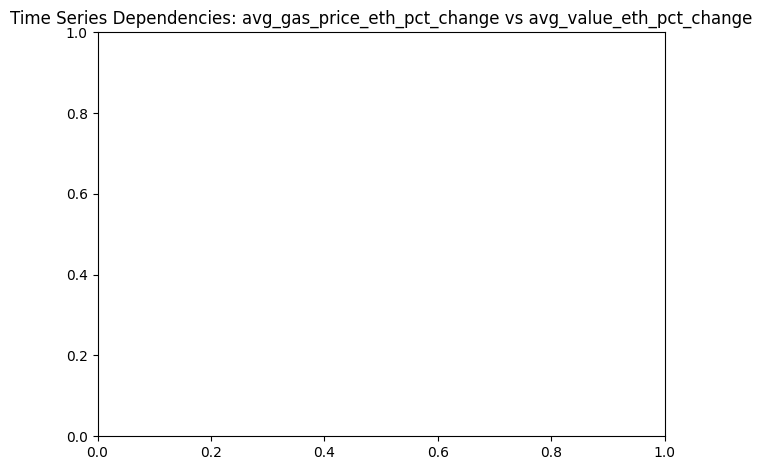

<Figure size 1000x600 with 0 Axes>

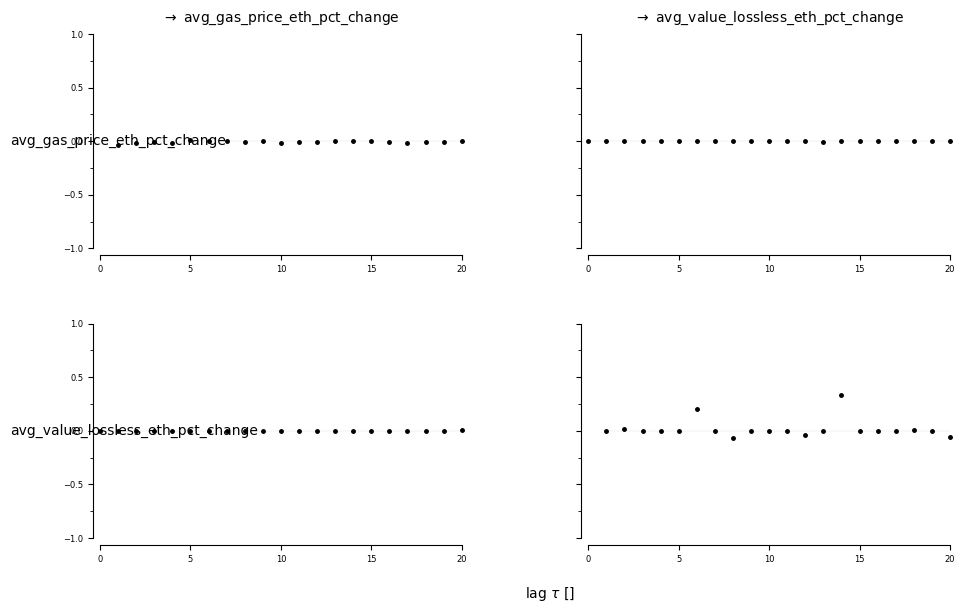


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


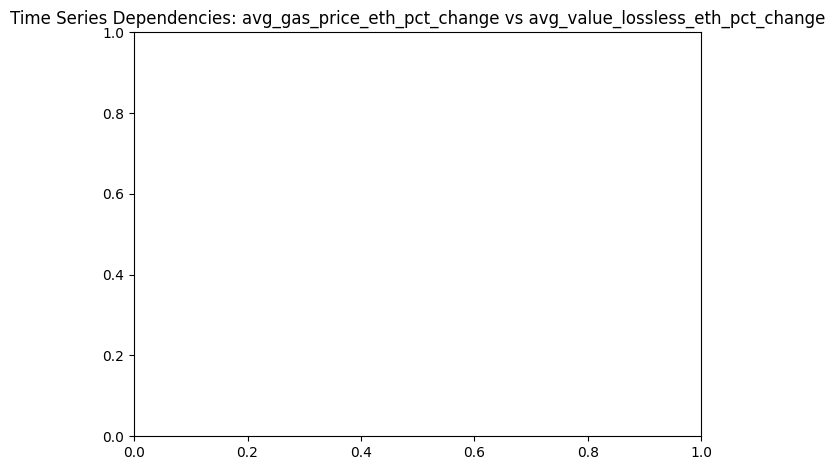

<Figure size 1000x600 with 0 Axes>

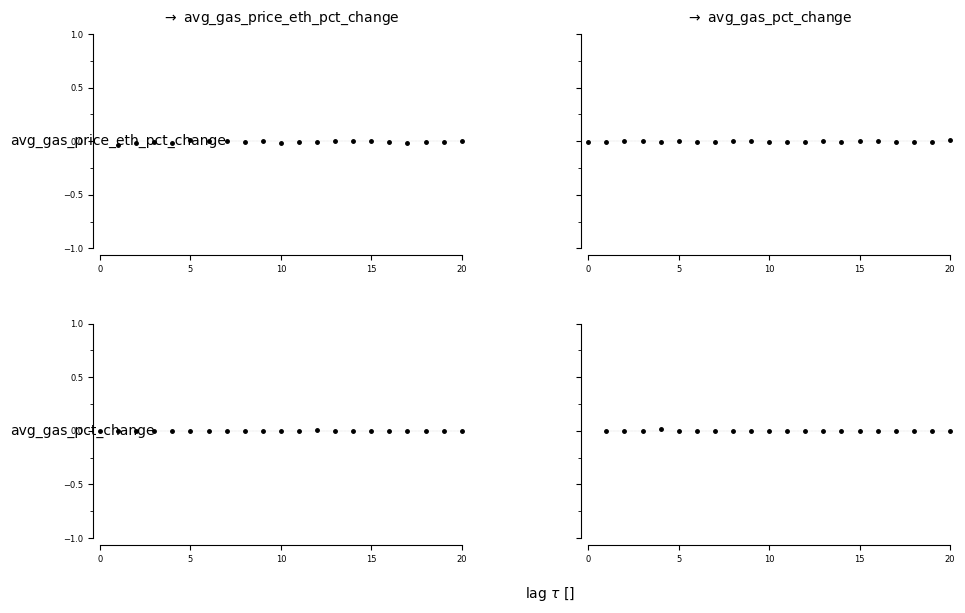


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


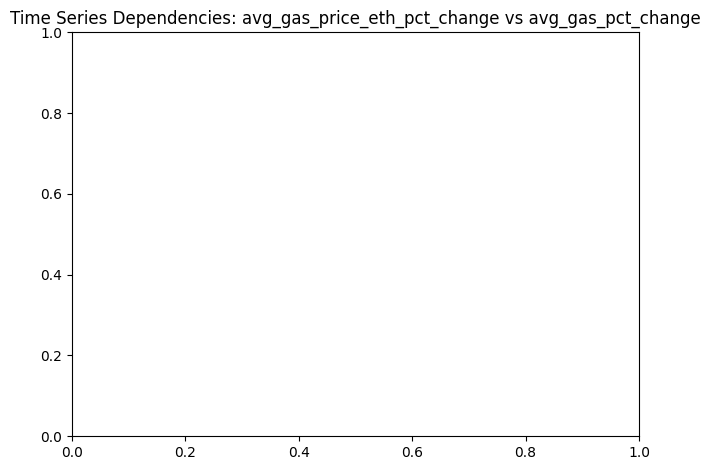

<Figure size 1000x600 with 0 Axes>

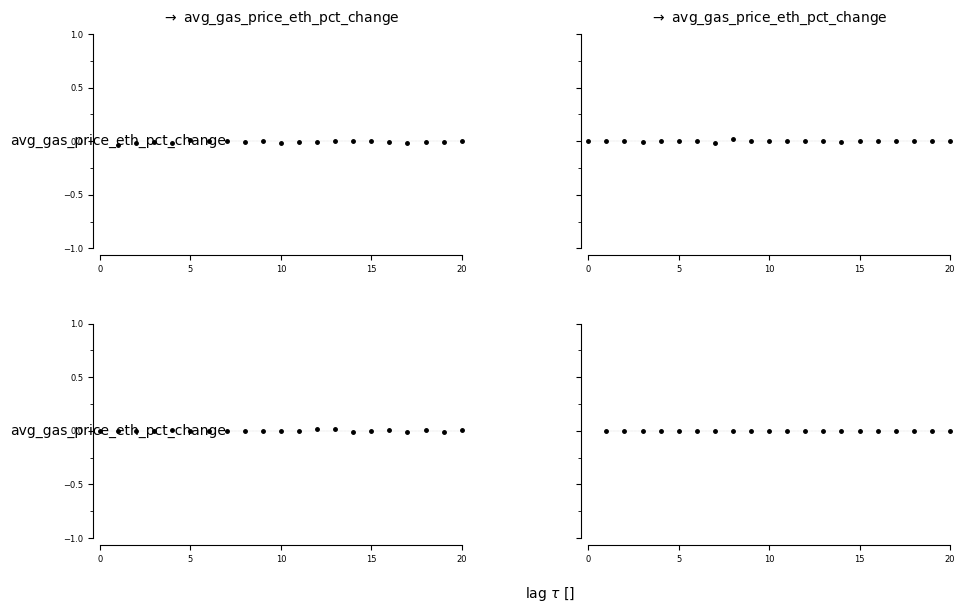


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


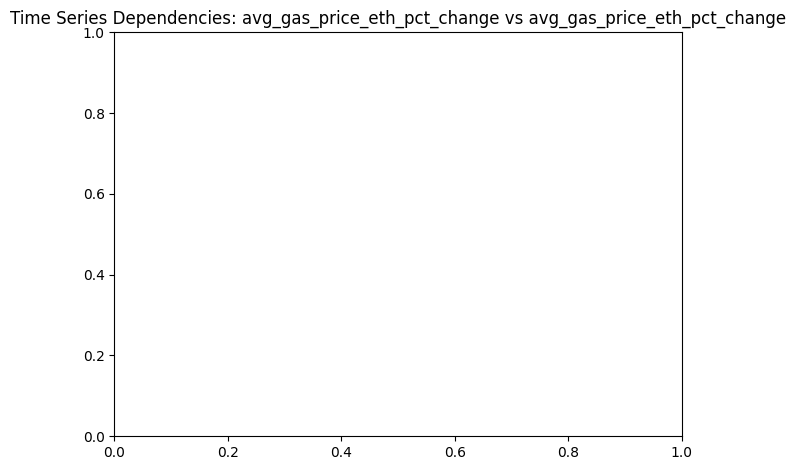

<Figure size 1000x600 with 0 Axes>

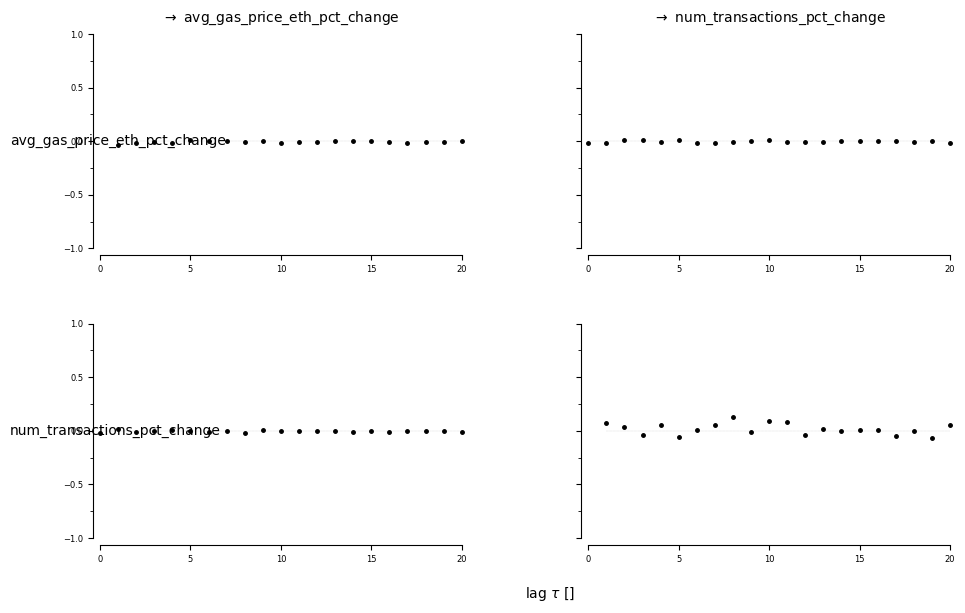


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


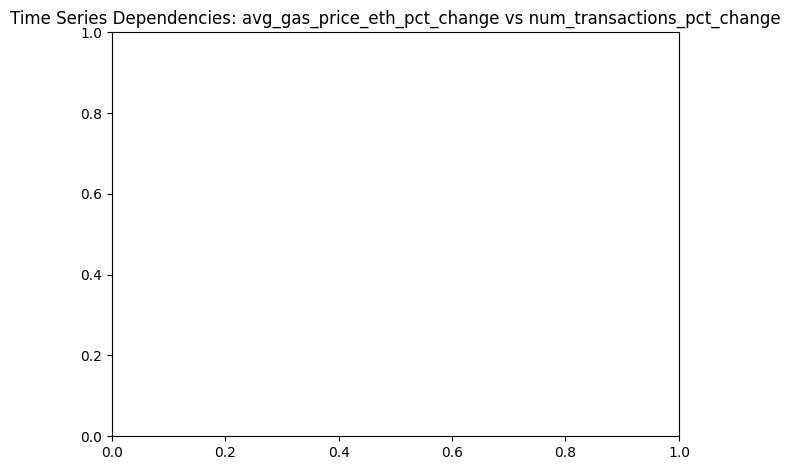

<Figure size 1000x600 with 0 Axes>

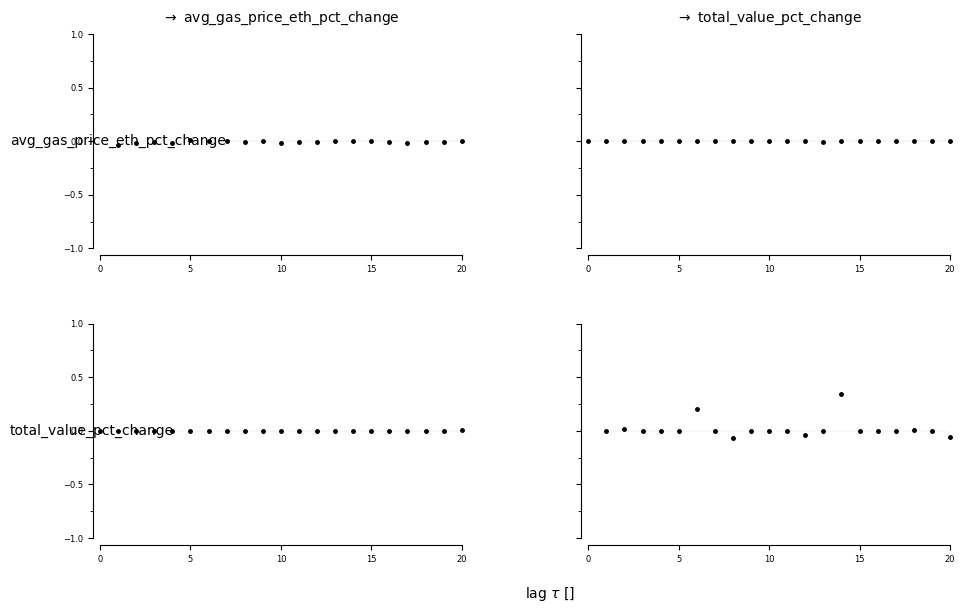


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


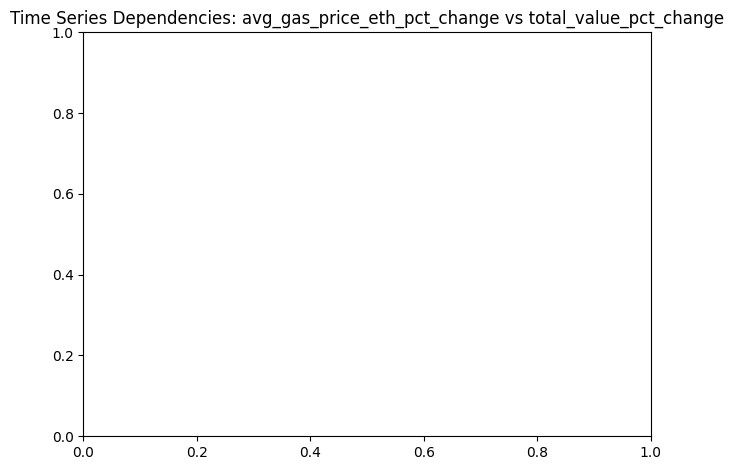

<Figure size 1000x600 with 0 Axes>

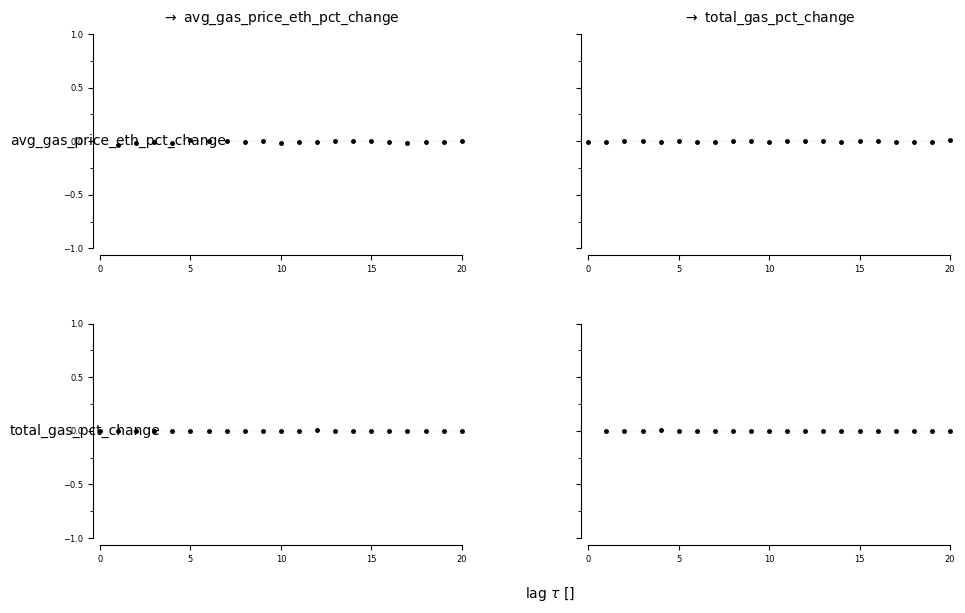


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


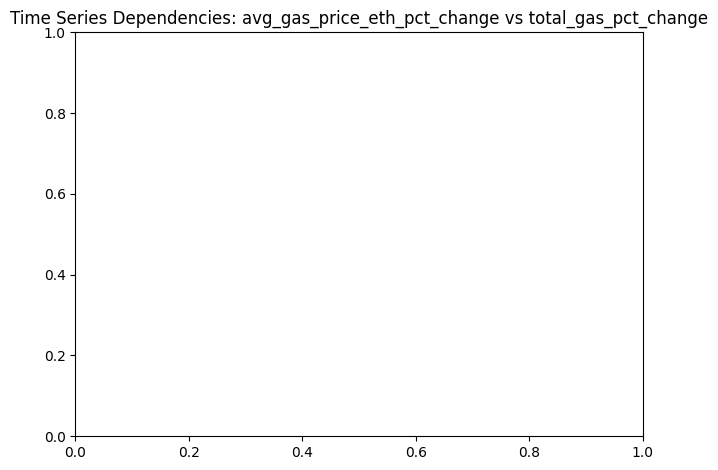

<Figure size 1000x600 with 0 Axes>

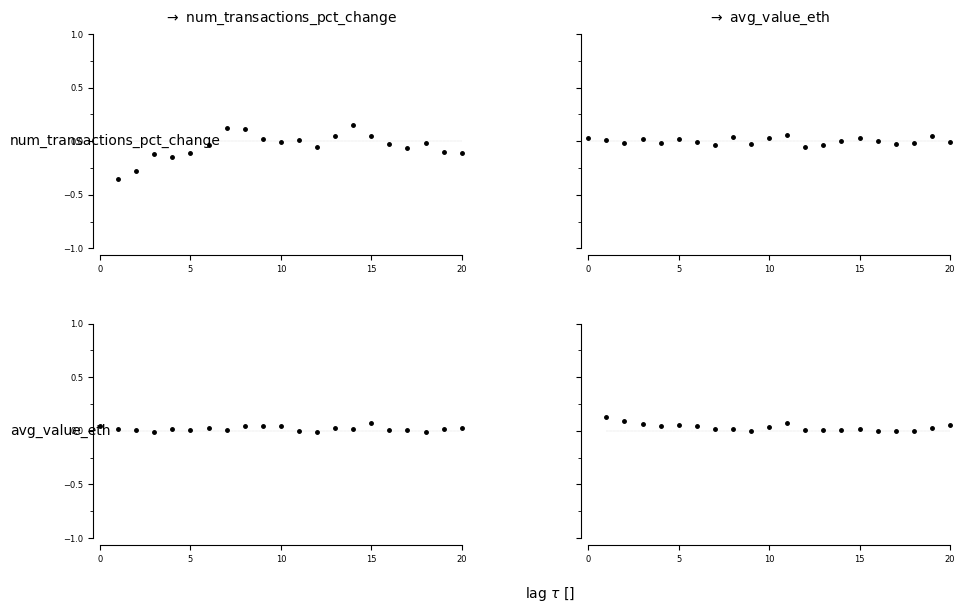


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


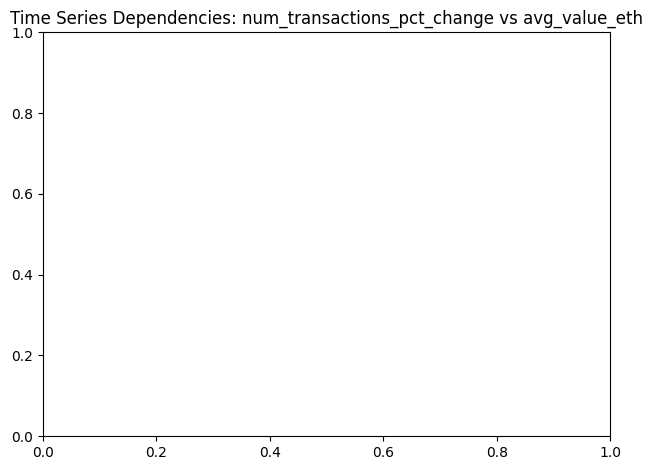

<Figure size 1000x600 with 0 Axes>

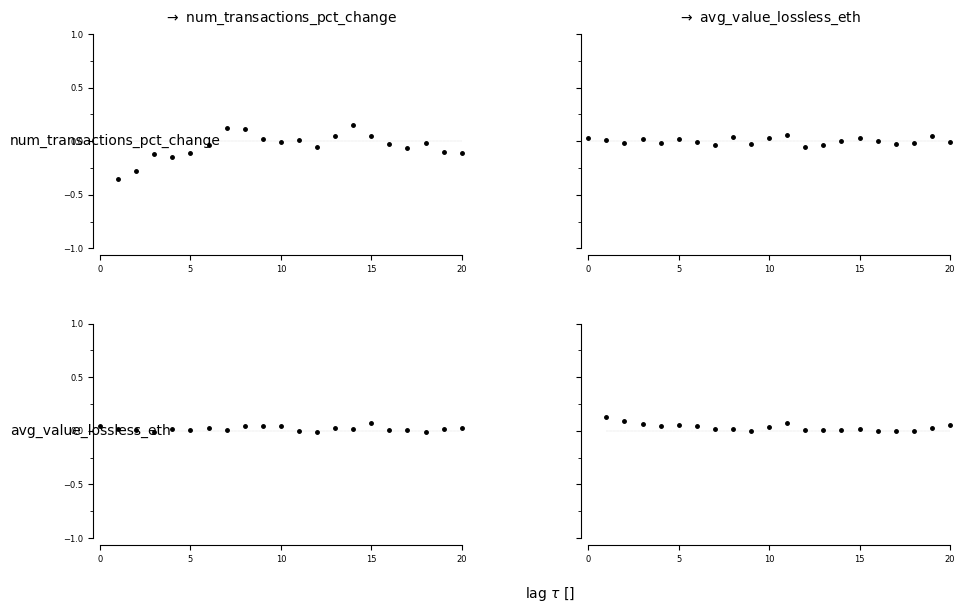


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


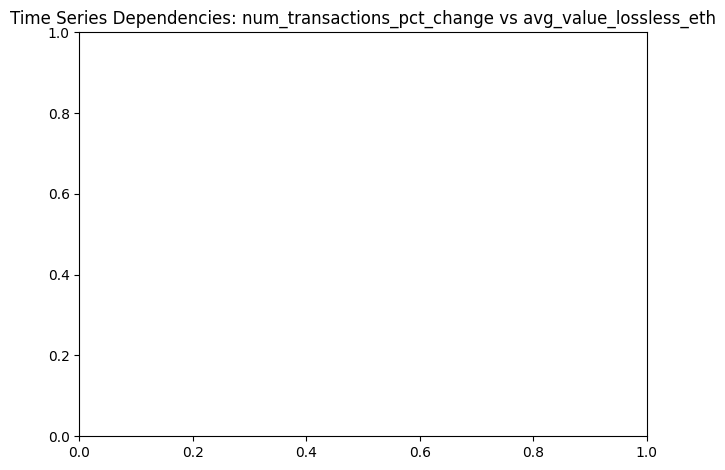

<Figure size 1000x600 with 0 Axes>

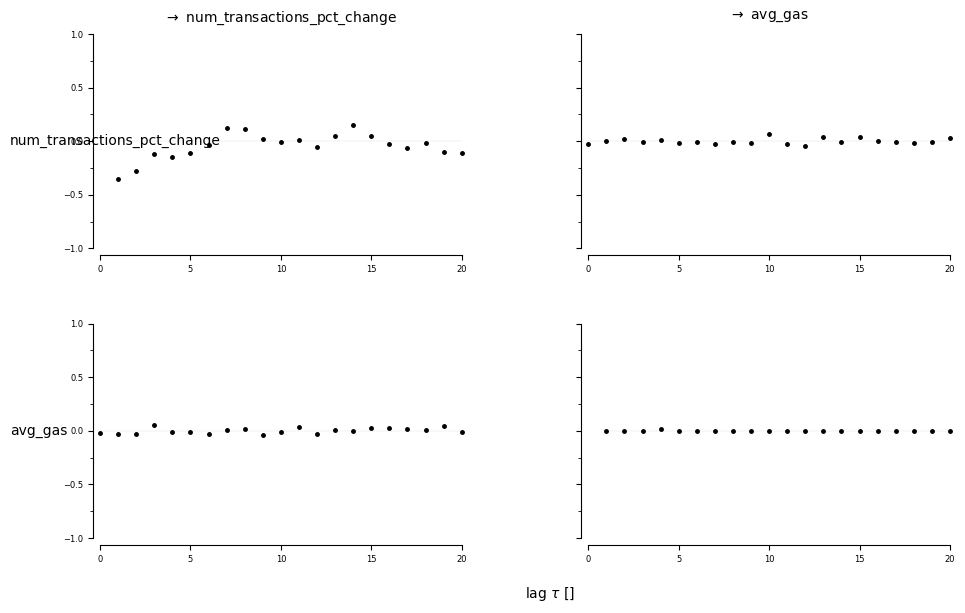


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


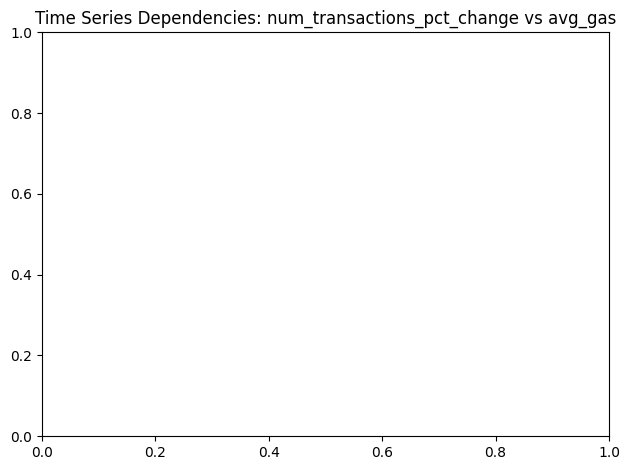

<Figure size 1000x600 with 0 Axes>

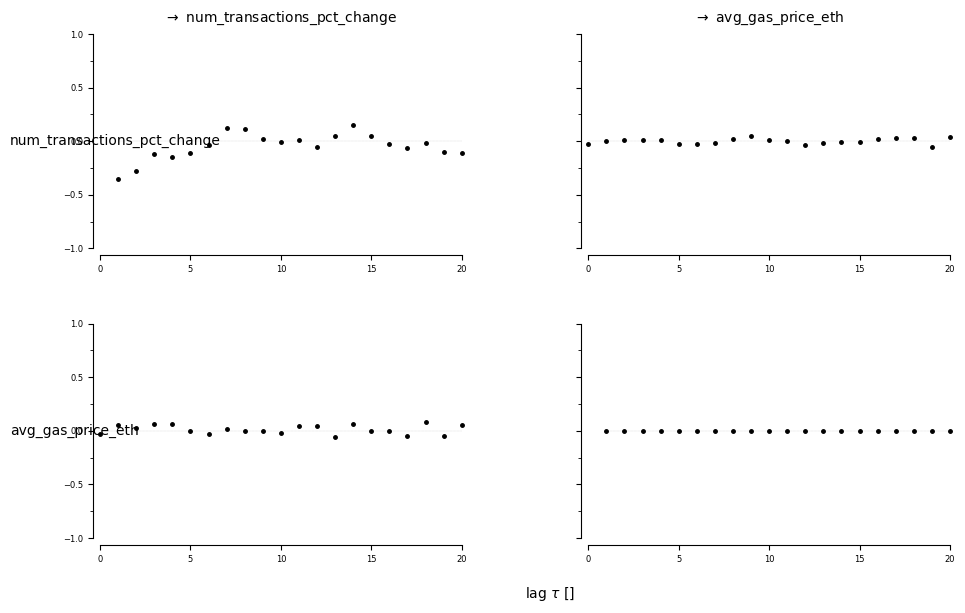


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


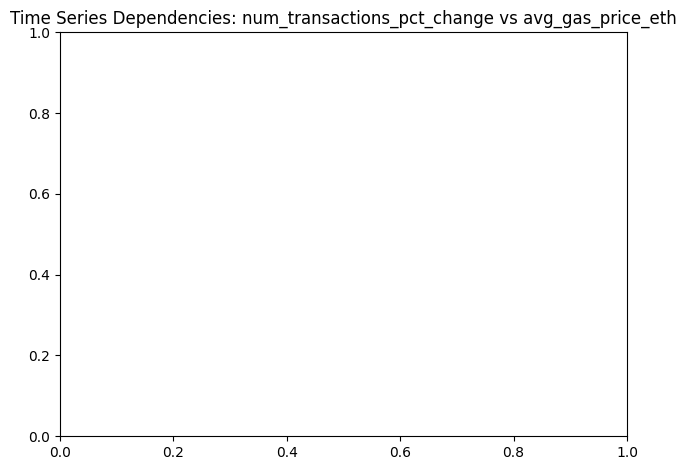

<Figure size 1000x600 with 0 Axes>

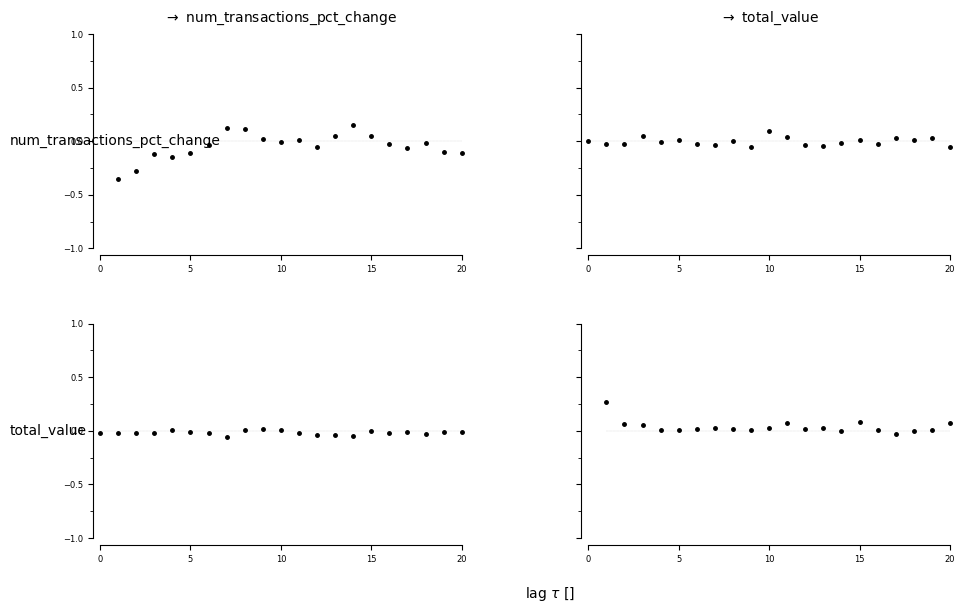


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


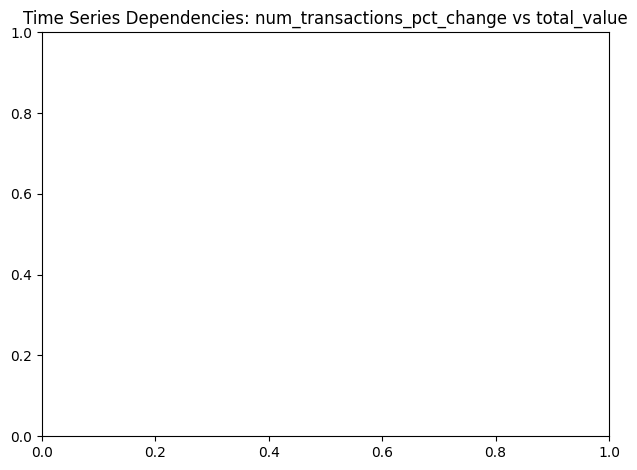

<Figure size 1000x600 with 0 Axes>

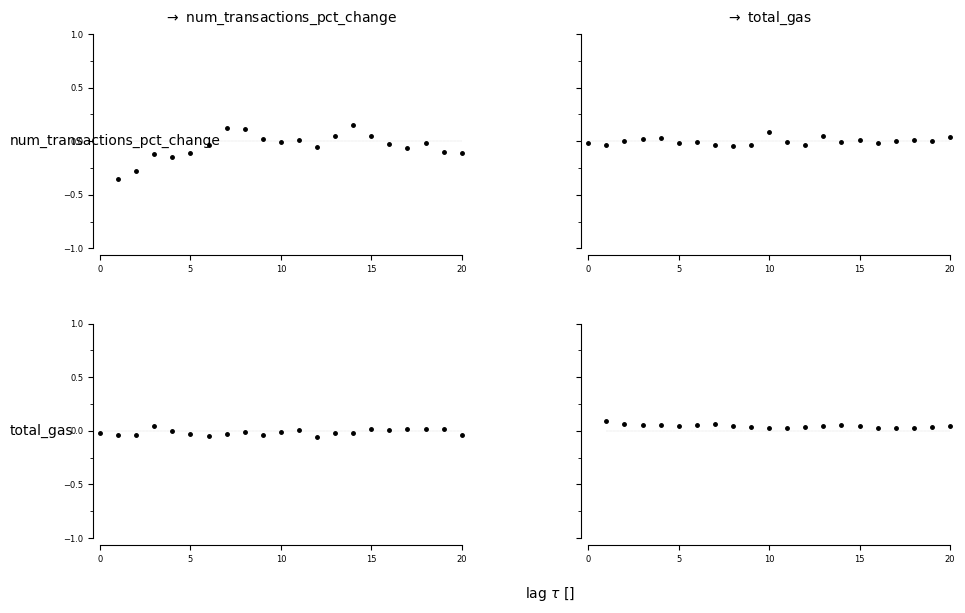


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


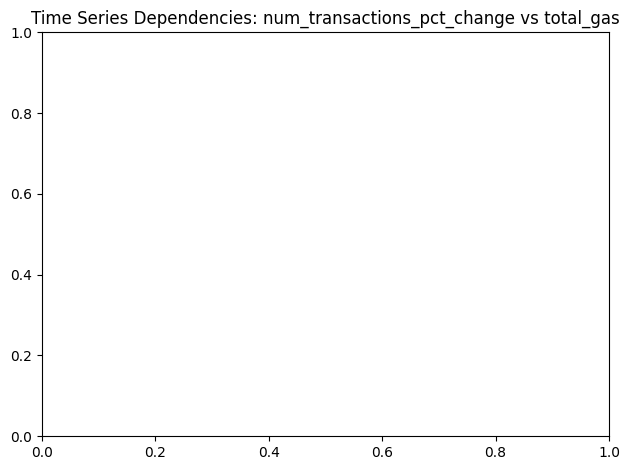

<Figure size 1000x600 with 0 Axes>

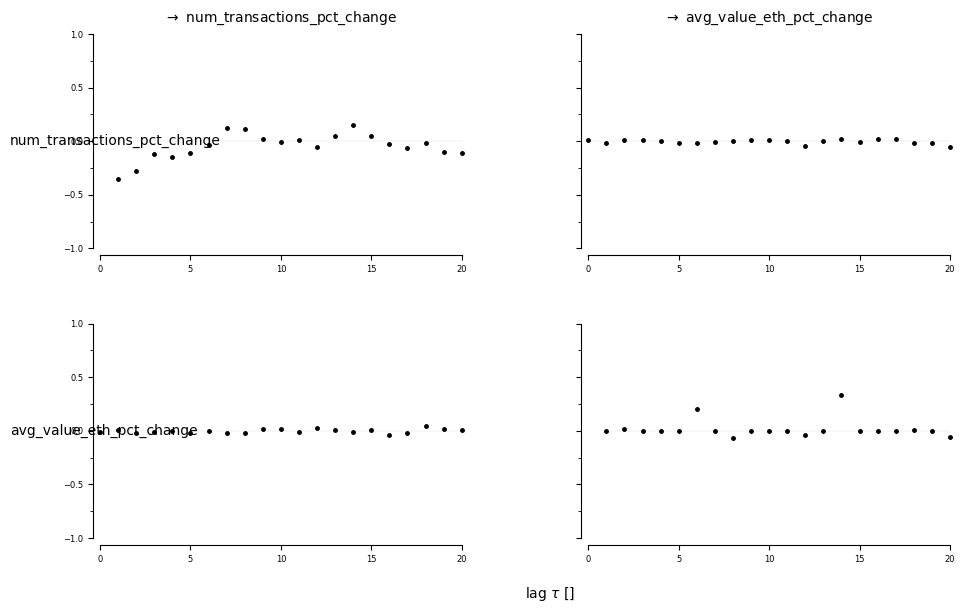


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


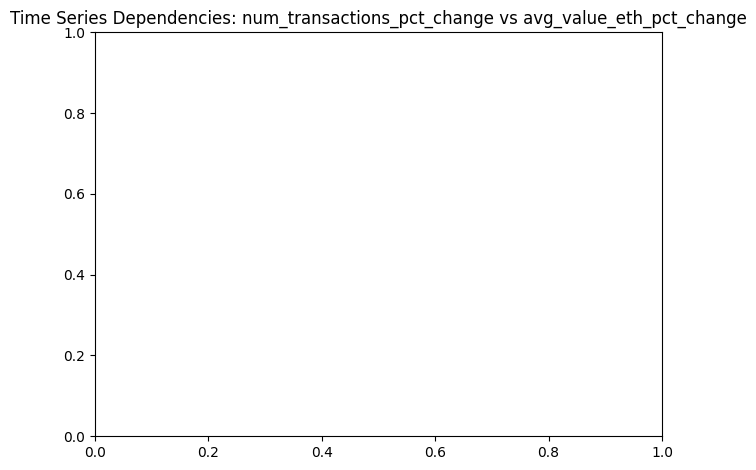

<Figure size 1000x600 with 0 Axes>

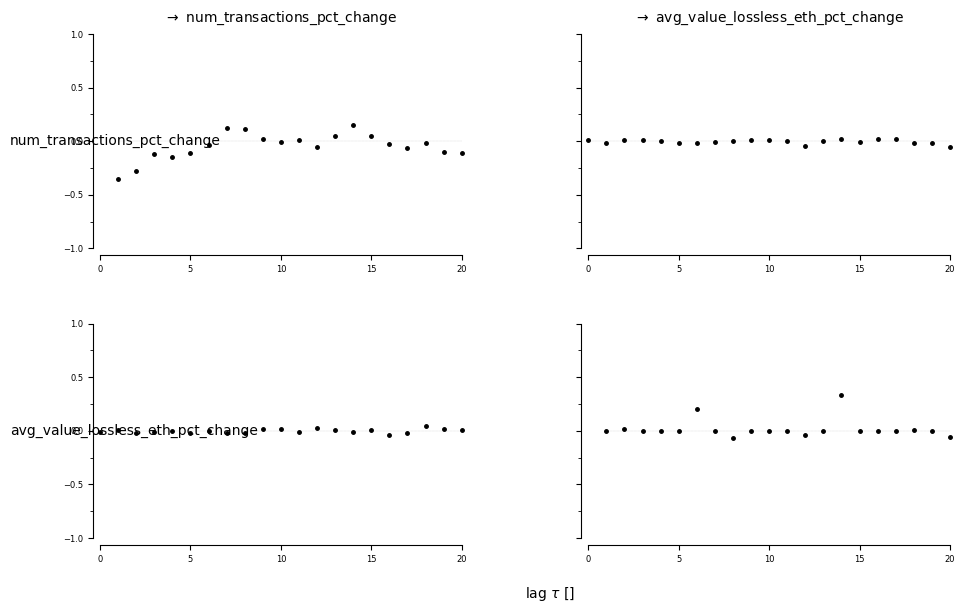


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


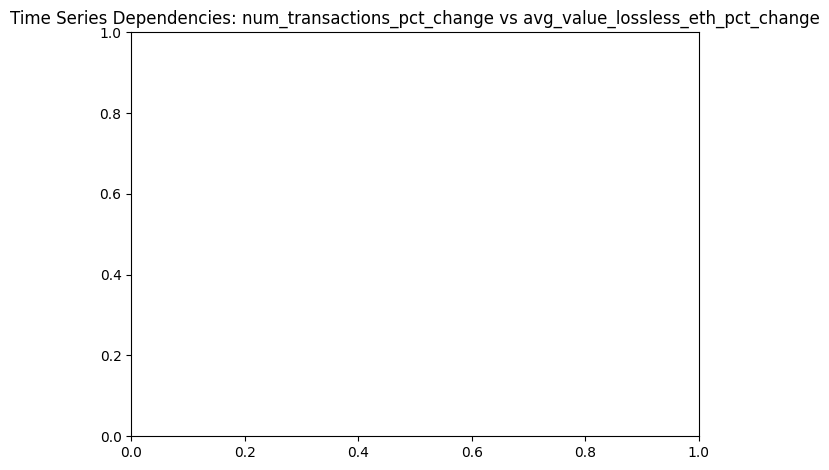

<Figure size 1000x600 with 0 Axes>

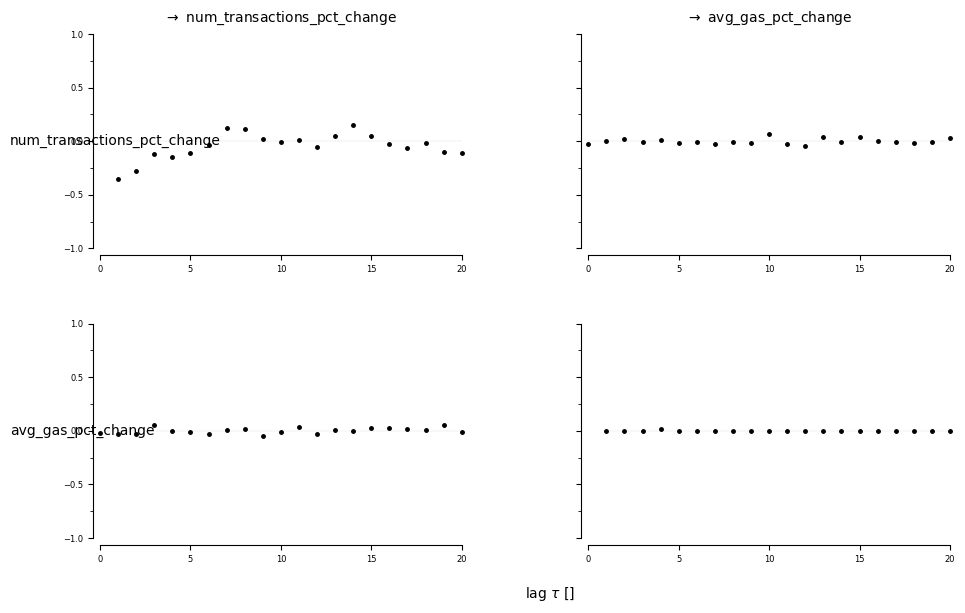


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


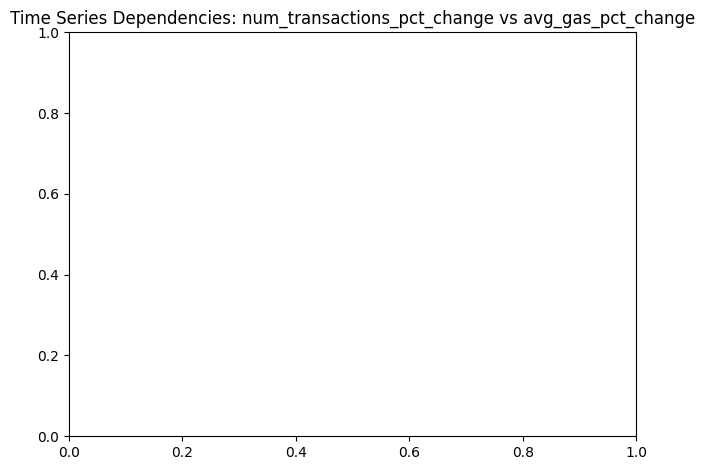

<Figure size 1000x600 with 0 Axes>

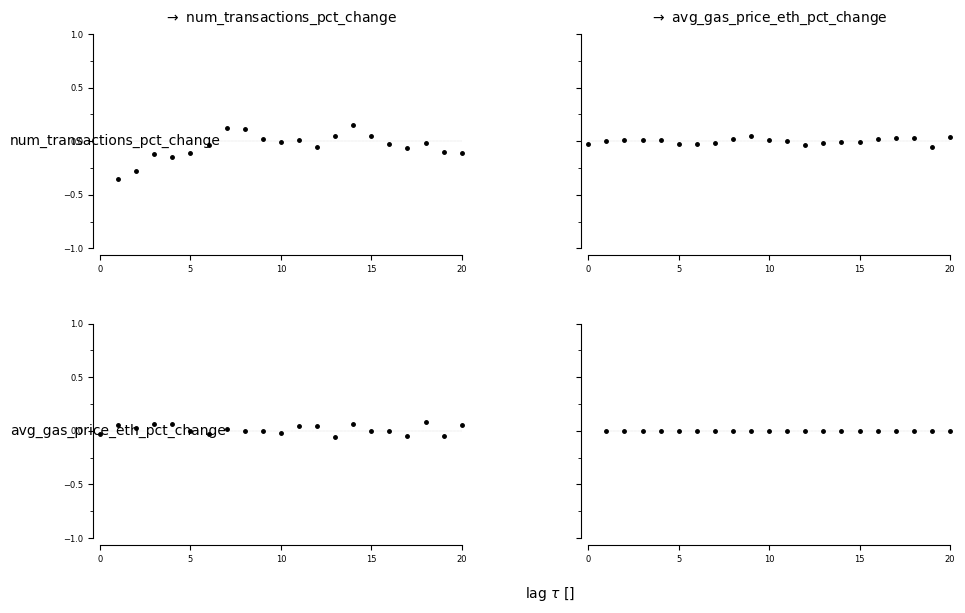


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


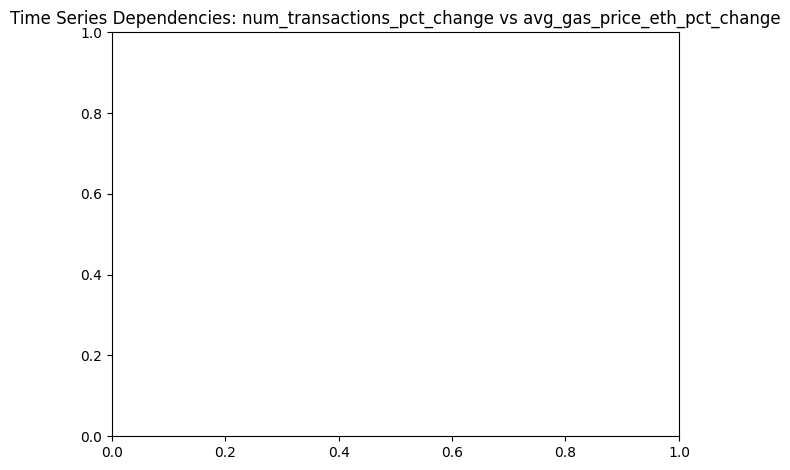

<Figure size 1000x600 with 0 Axes>

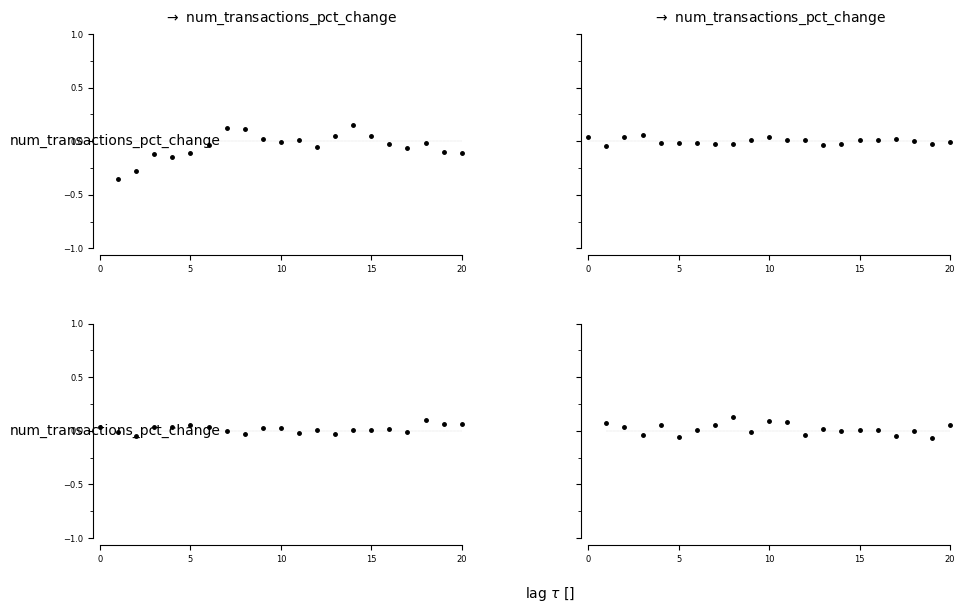


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


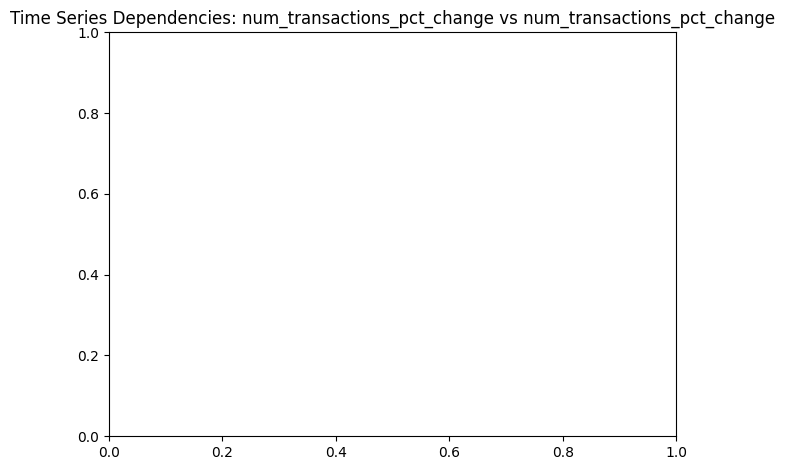

<Figure size 1000x600 with 0 Axes>

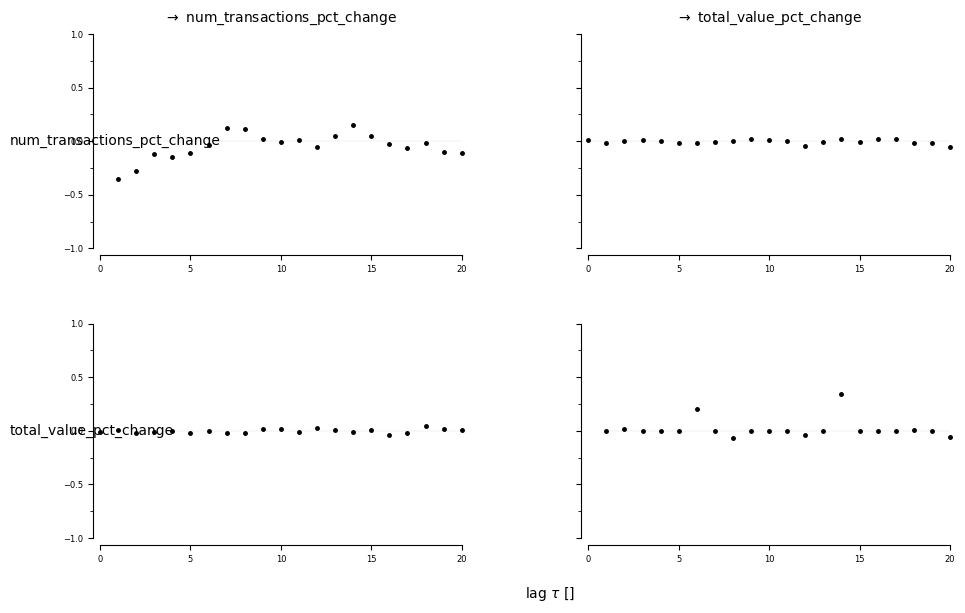


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


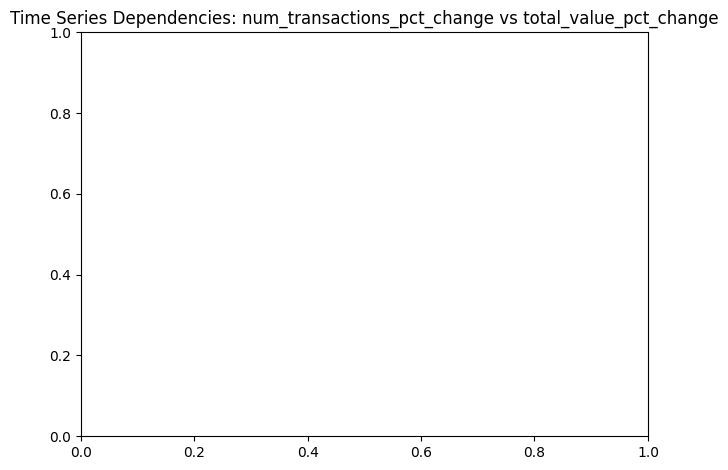

<Figure size 1000x600 with 0 Axes>

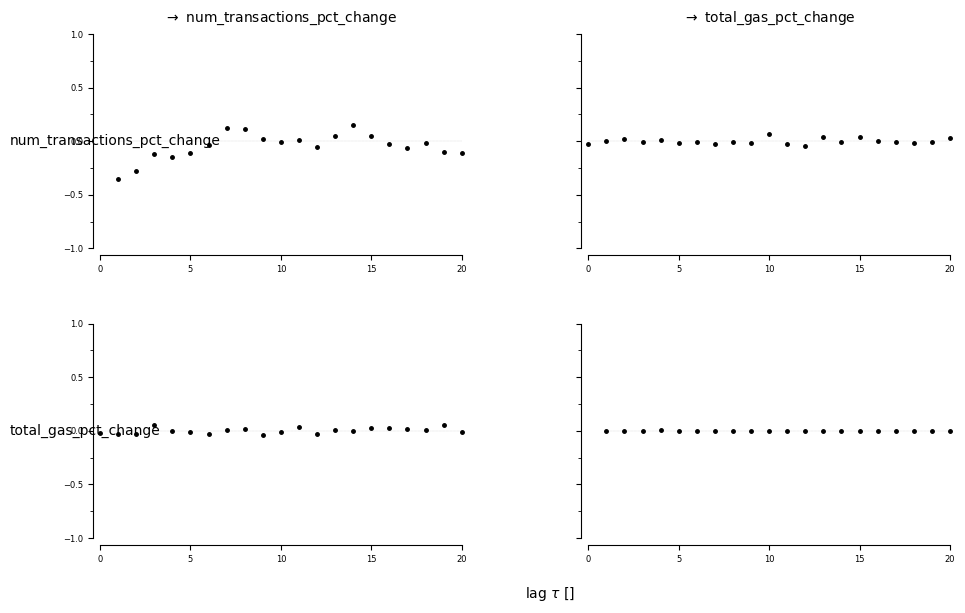


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


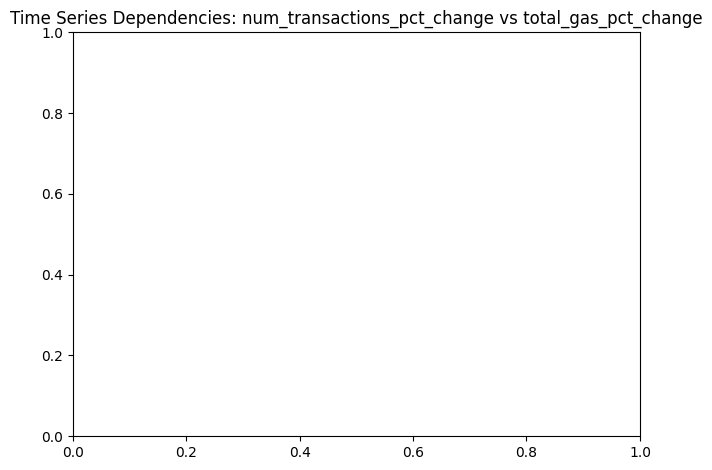

<Figure size 1000x600 with 0 Axes>

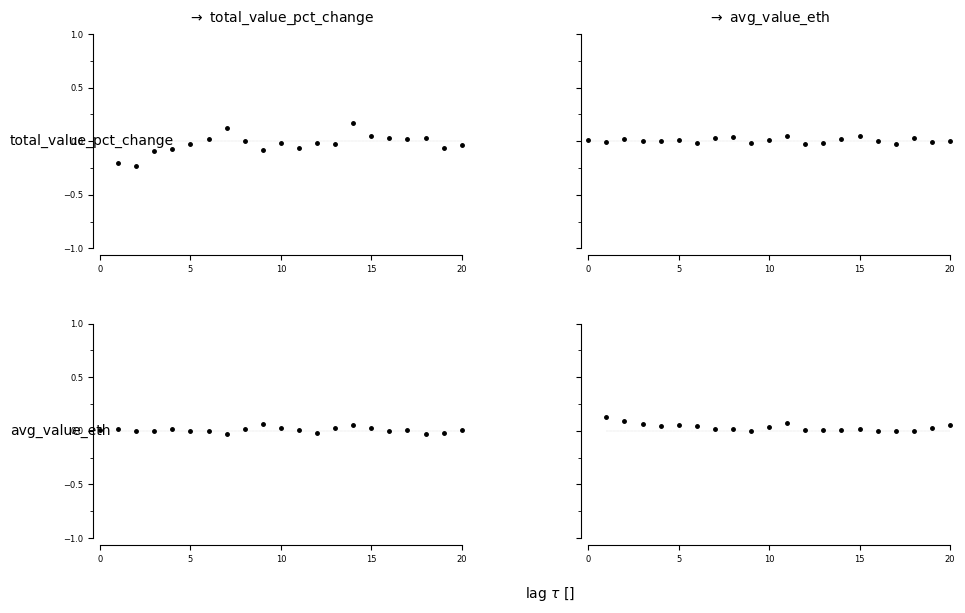


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


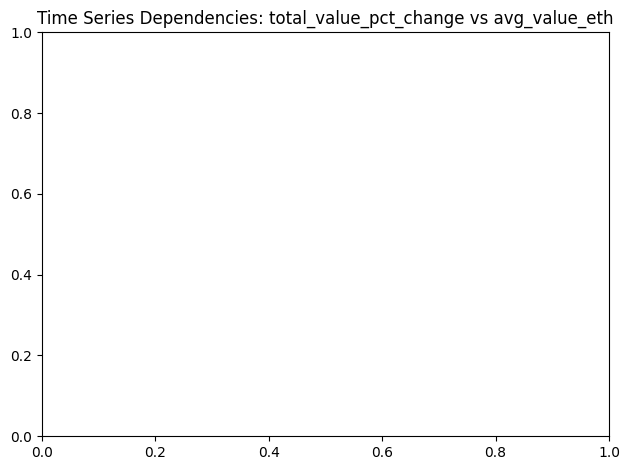

<Figure size 1000x600 with 0 Axes>

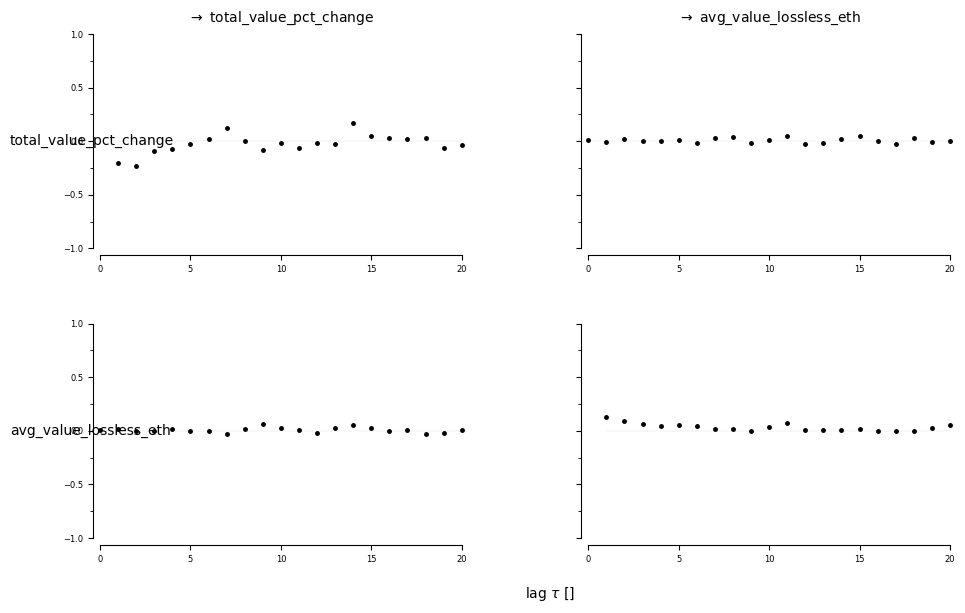


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


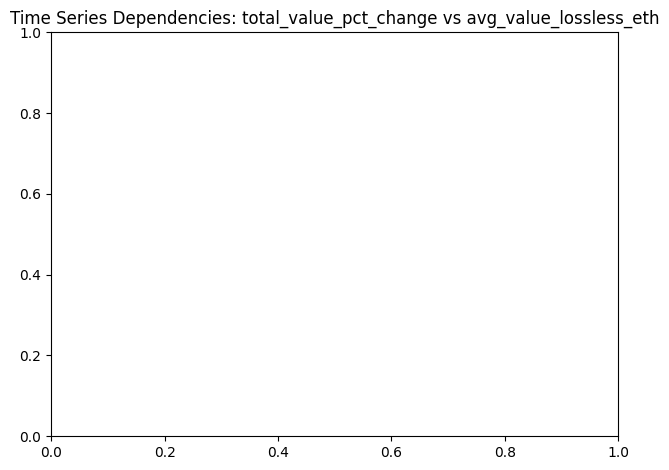

<Figure size 1000x600 with 0 Axes>

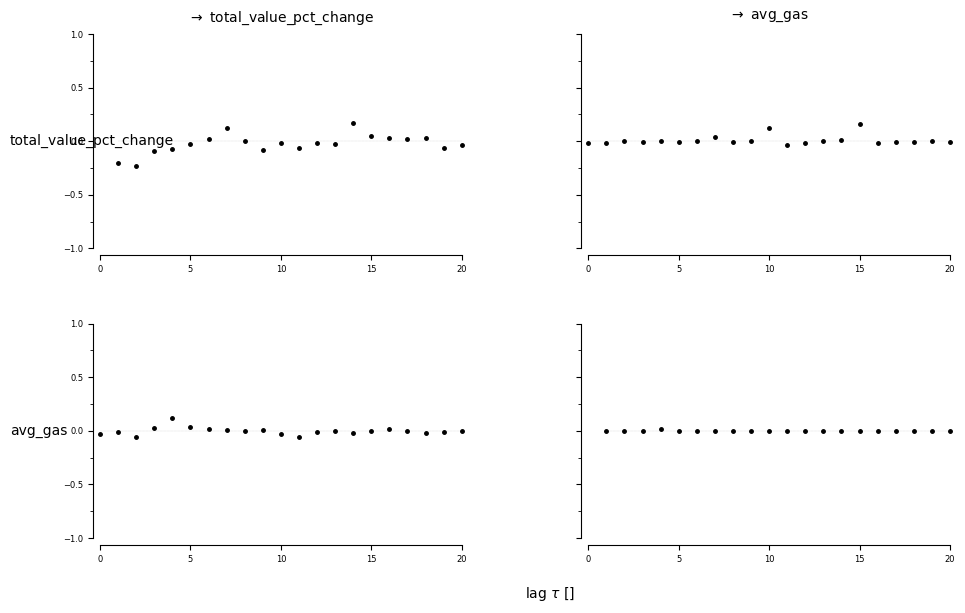


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


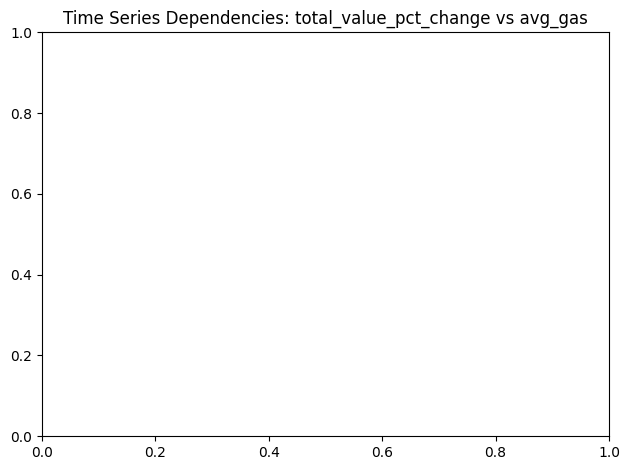

<Figure size 1000x600 with 0 Axes>

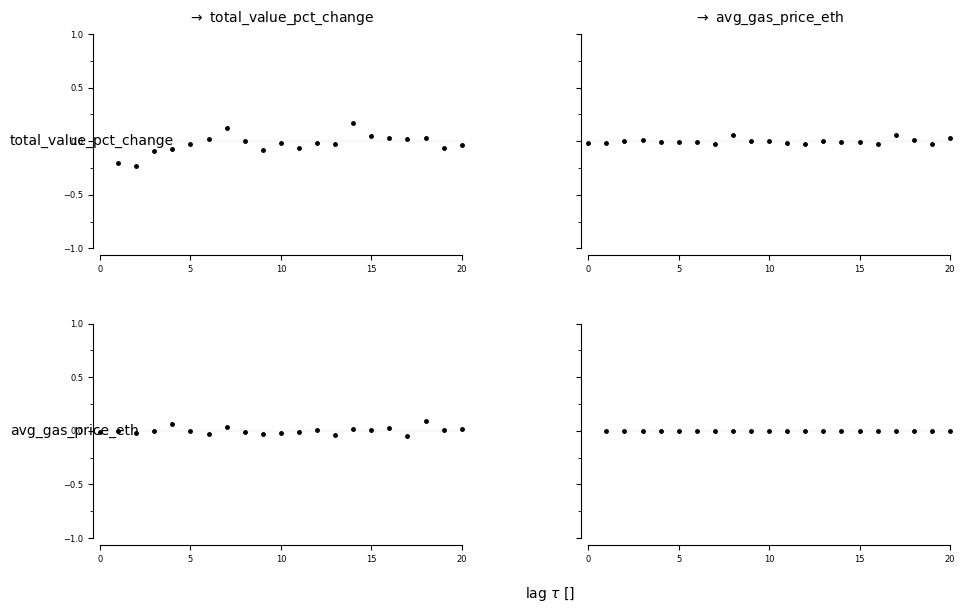


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


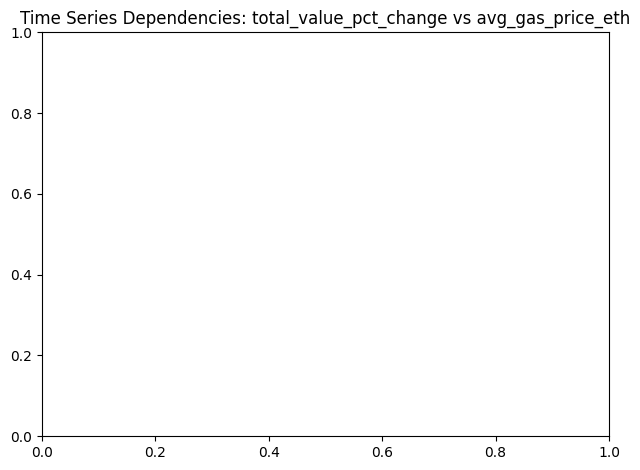

<Figure size 1000x600 with 0 Axes>

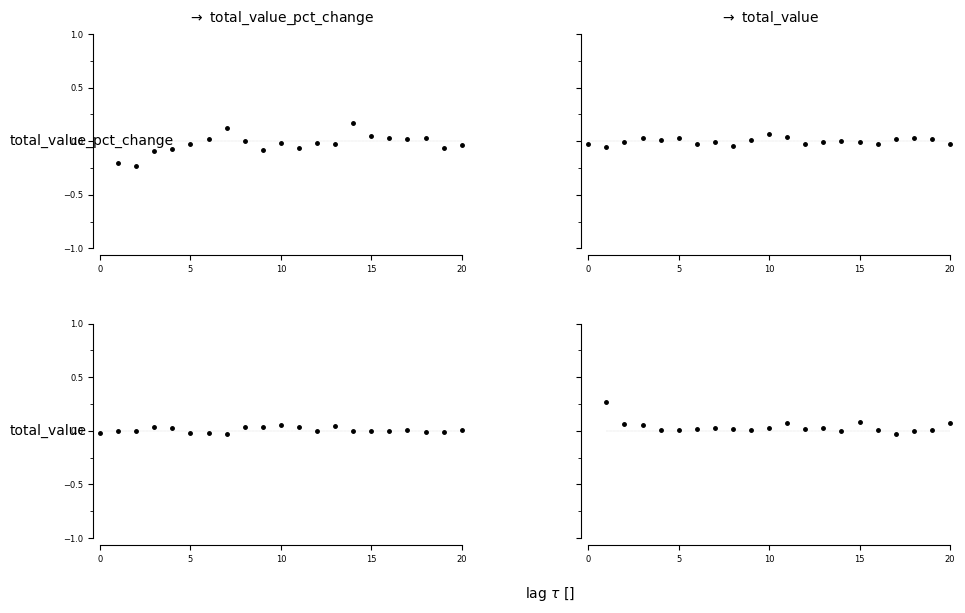


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


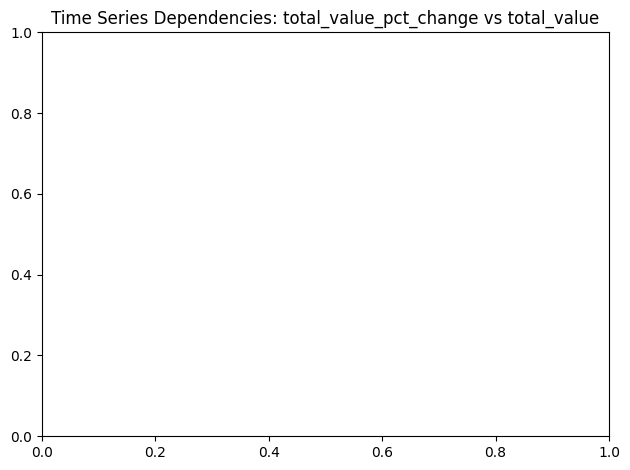

<Figure size 1000x600 with 0 Axes>

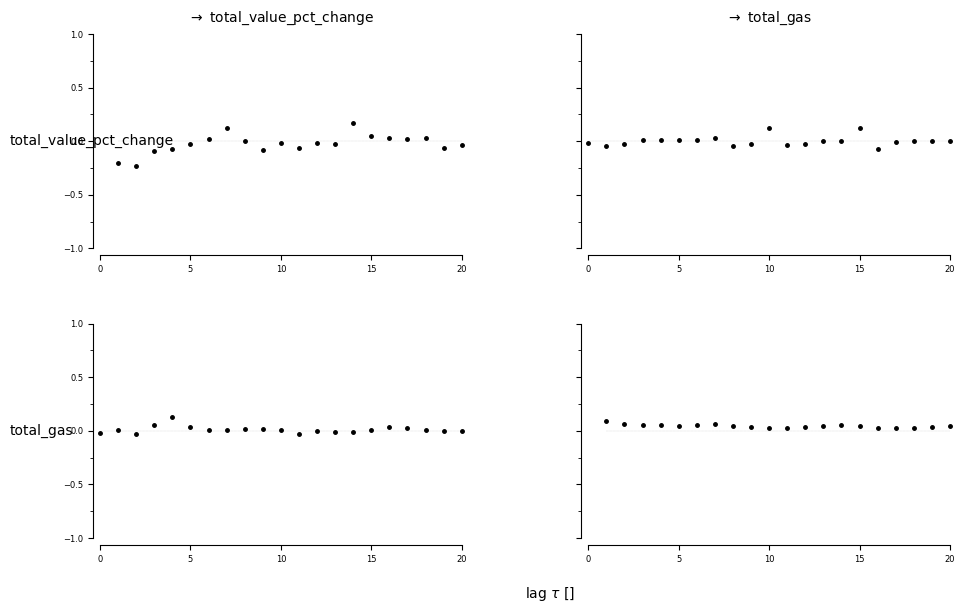


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


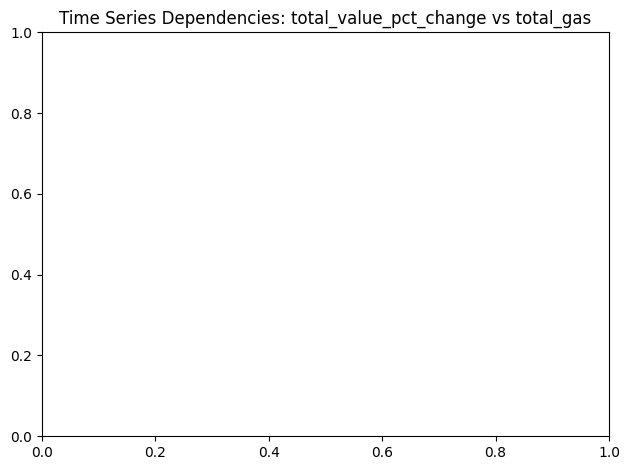

<Figure size 1000x600 with 0 Axes>

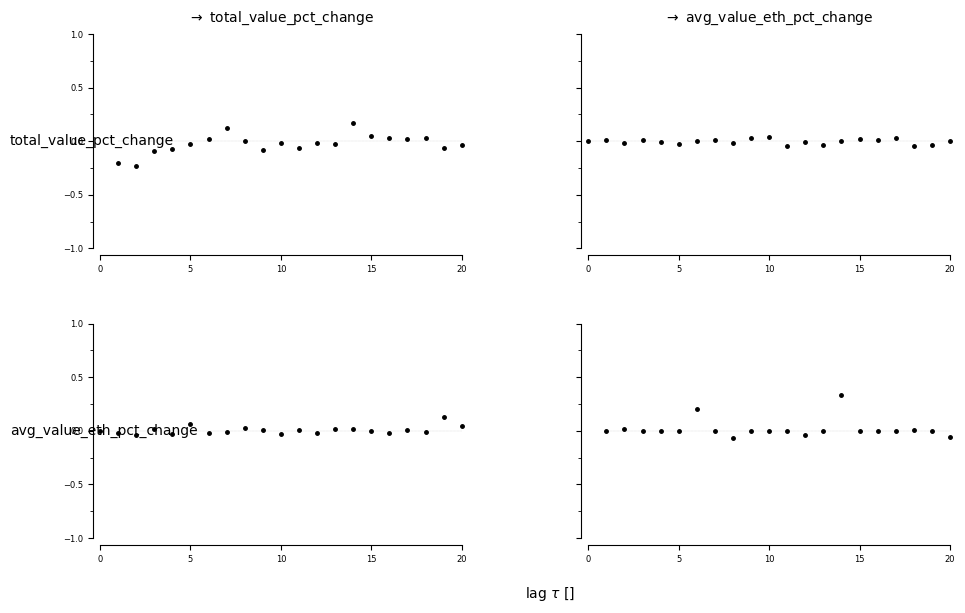


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


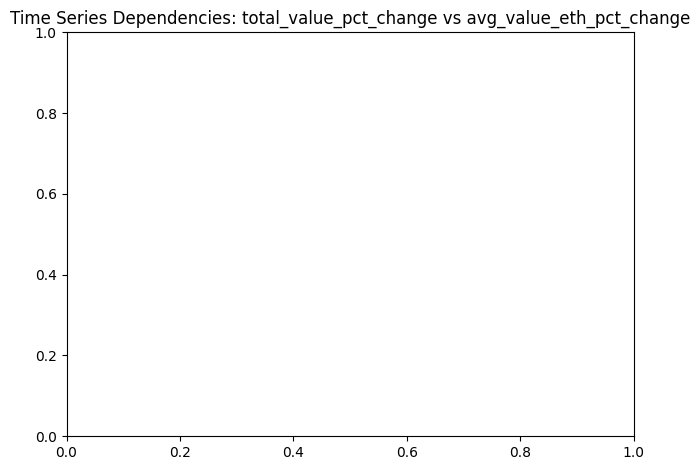

<Figure size 1000x600 with 0 Axes>

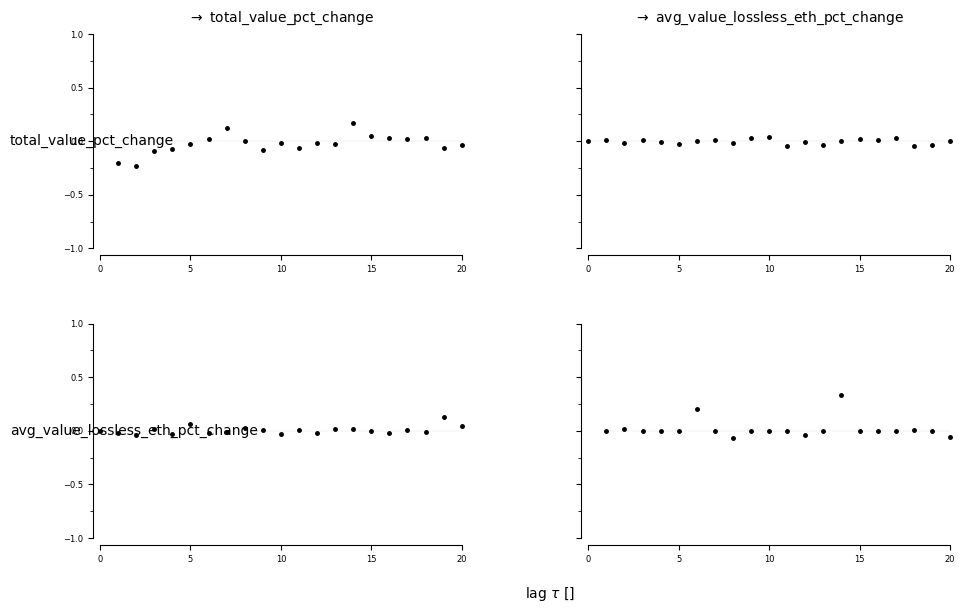


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


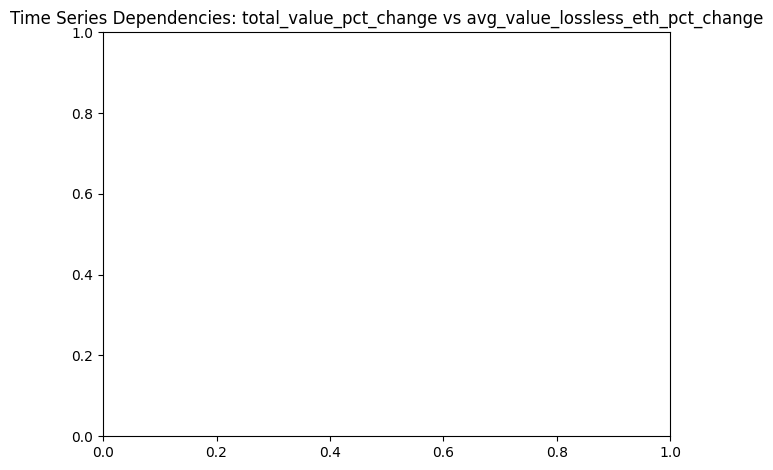

<Figure size 1000x600 with 0 Axes>

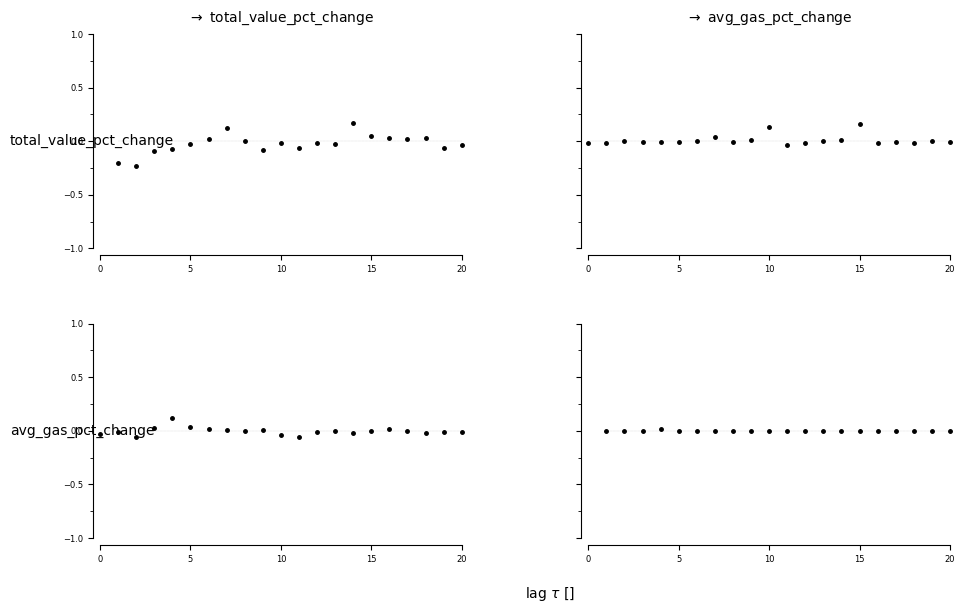


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


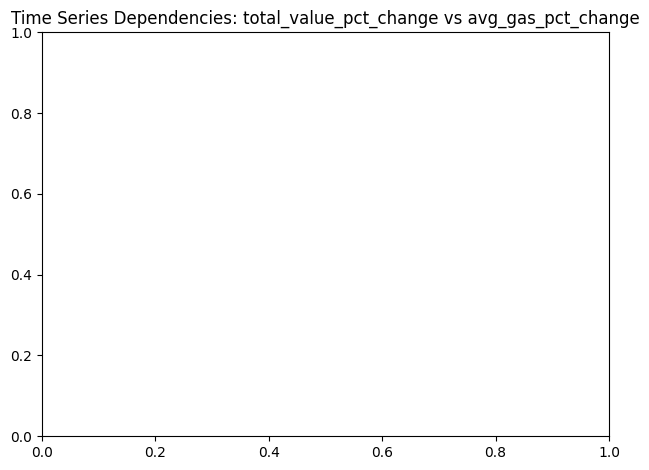

<Figure size 1000x600 with 0 Axes>

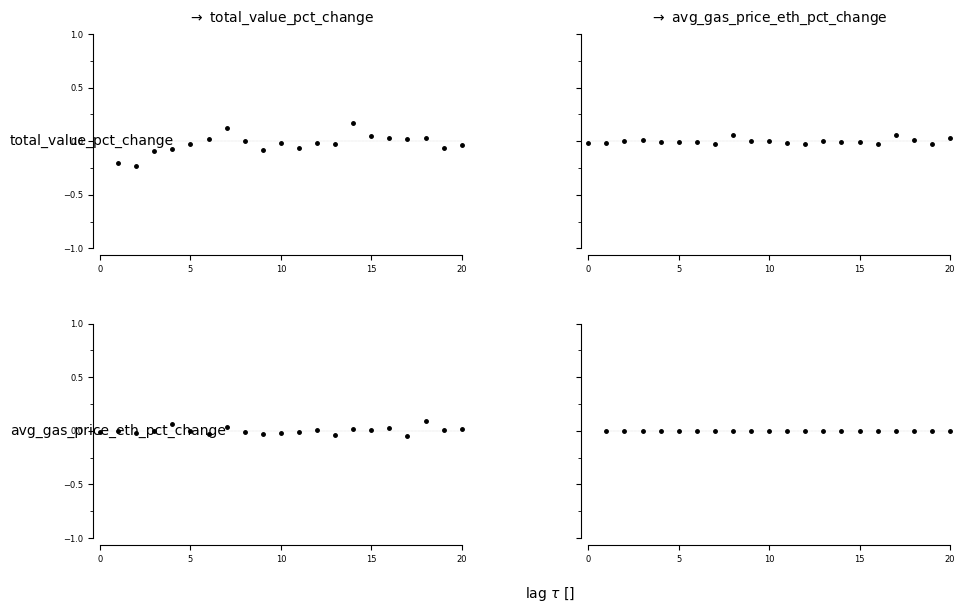


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


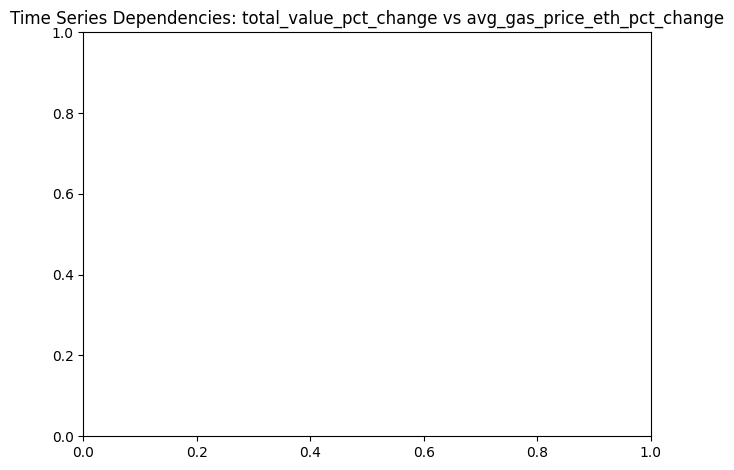

<Figure size 1000x600 with 0 Axes>

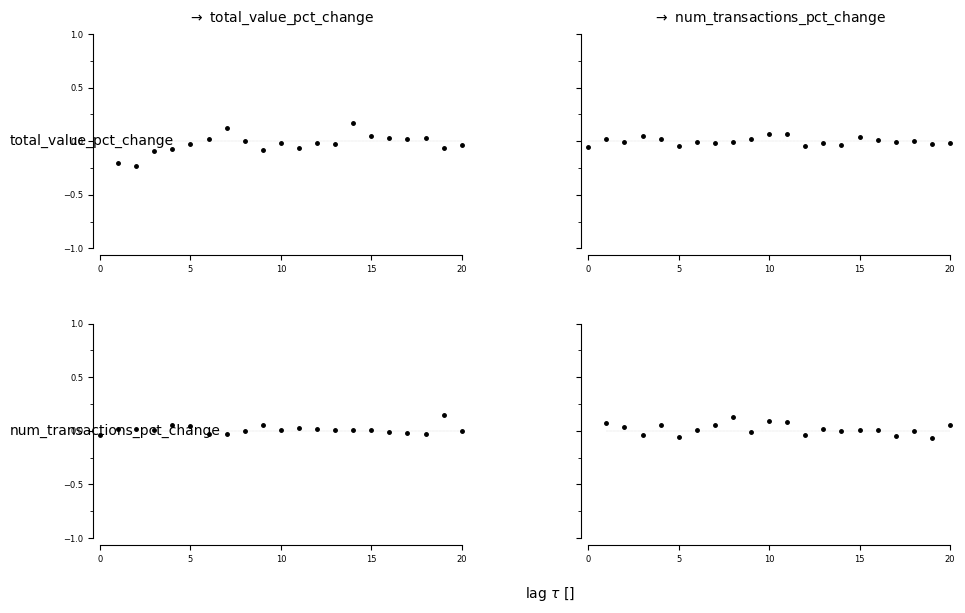


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


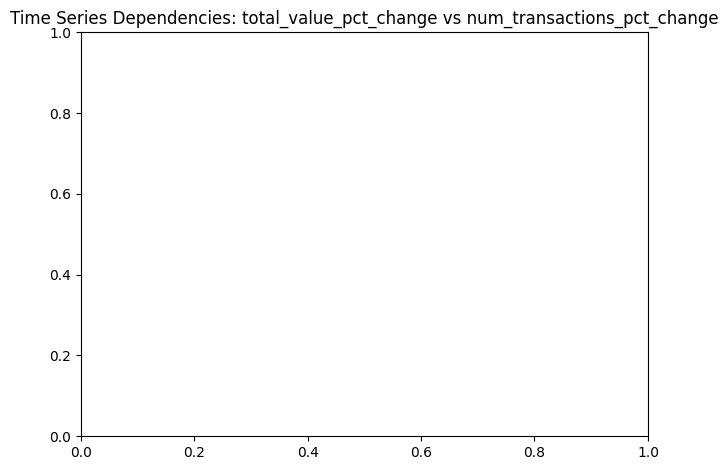

<Figure size 1000x600 with 0 Axes>

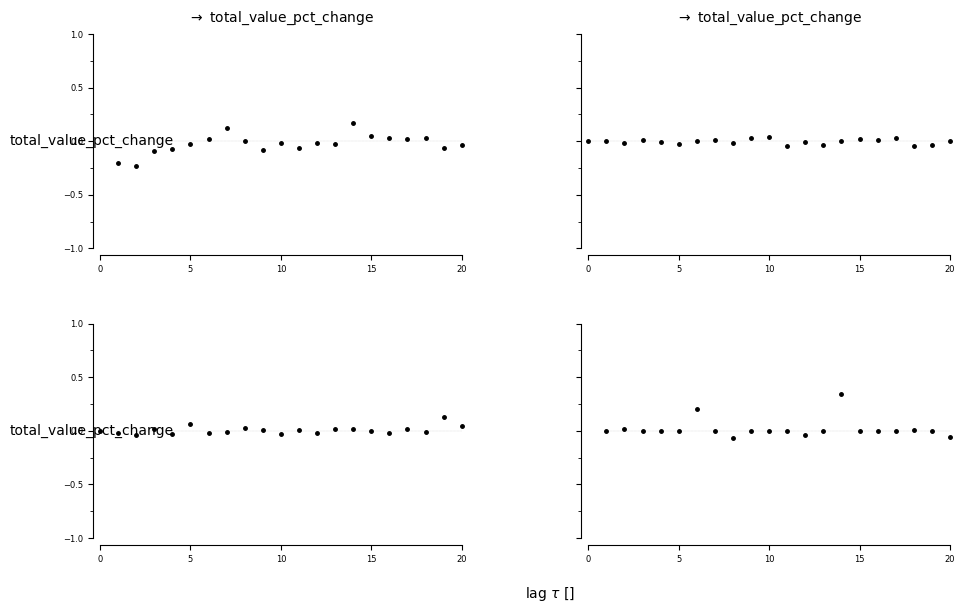


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


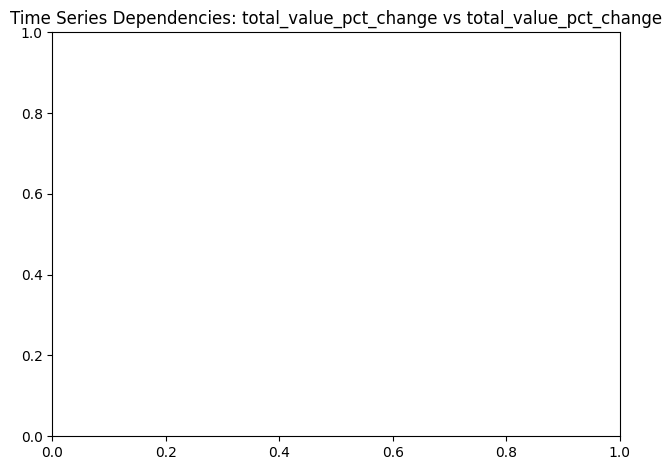

<Figure size 1000x600 with 0 Axes>

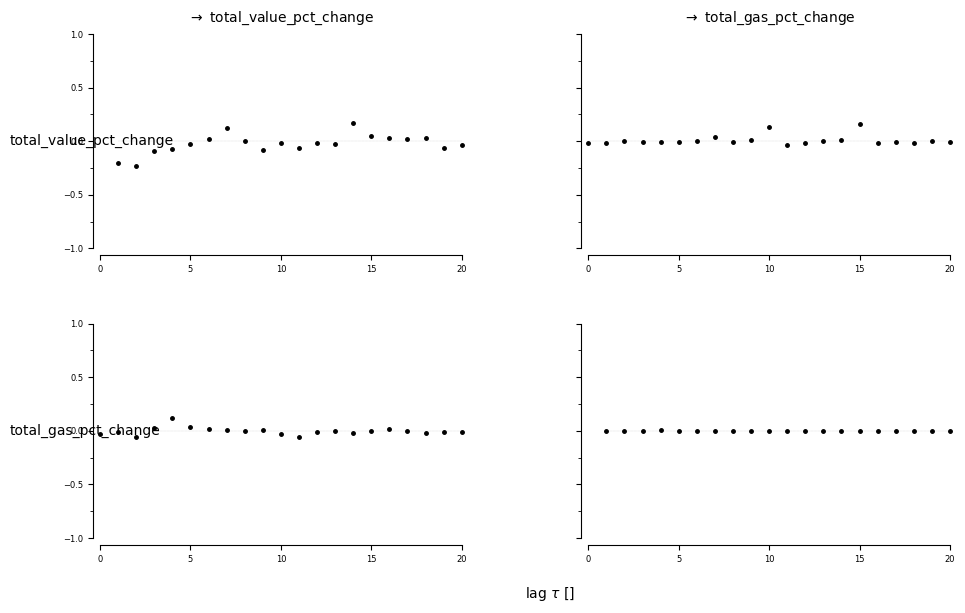


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


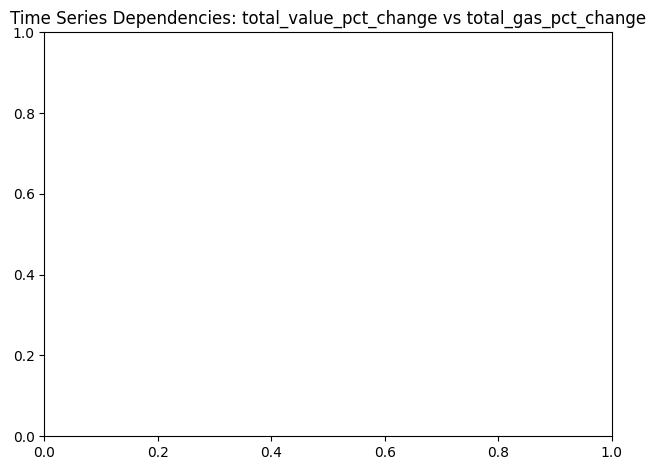

<Figure size 1000x600 with 0 Axes>

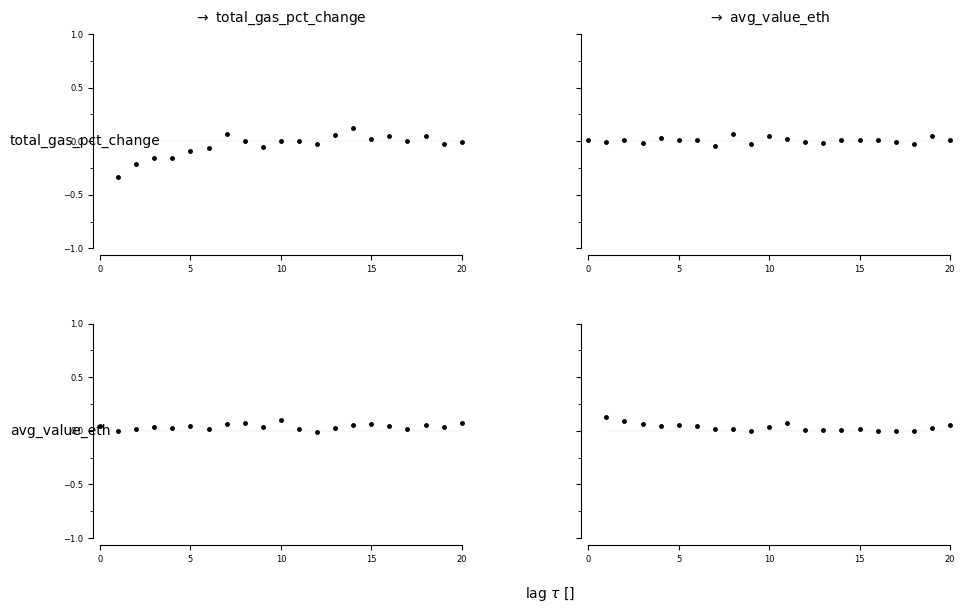


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


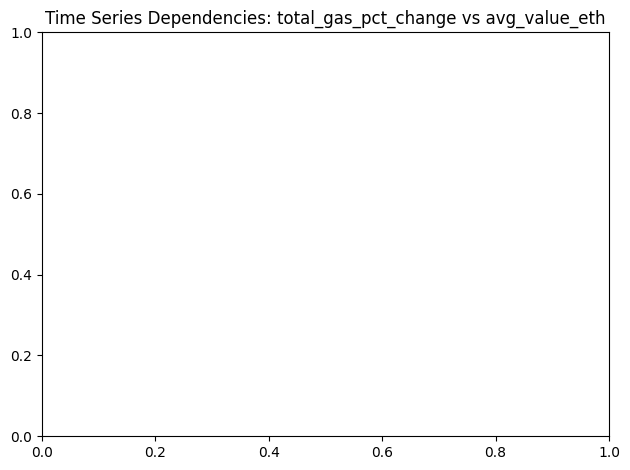

<Figure size 1000x600 with 0 Axes>

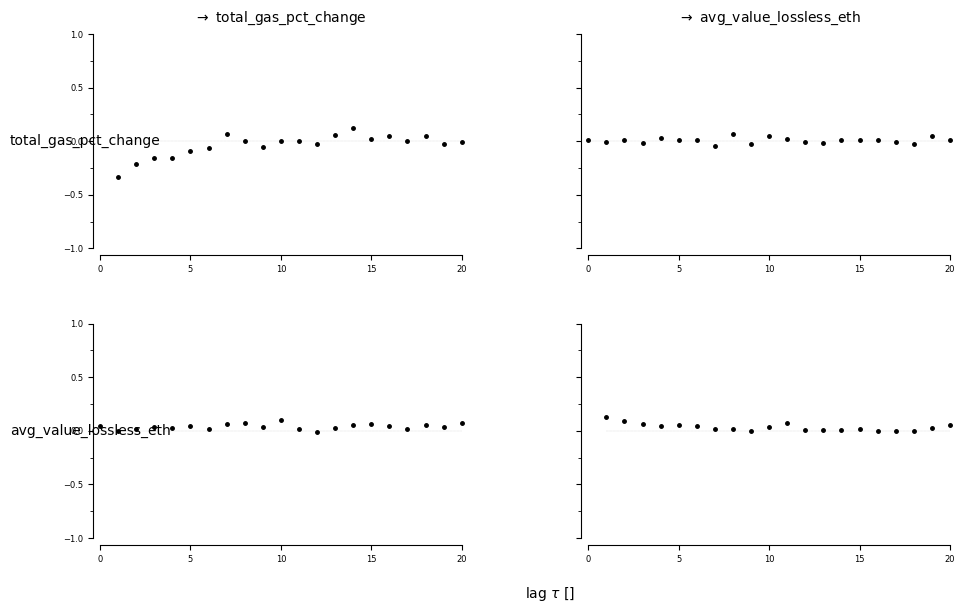


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


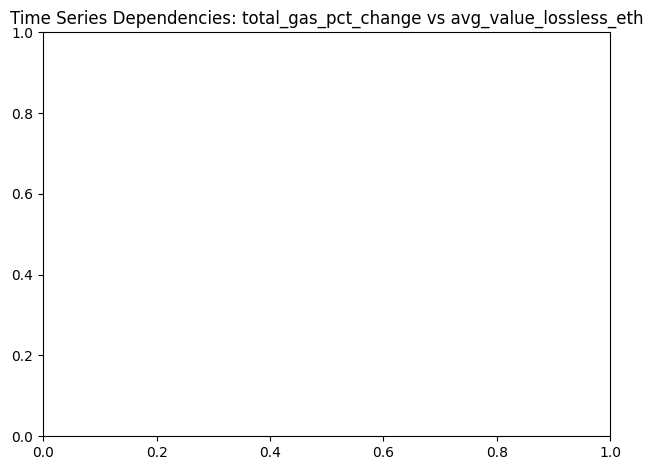

<Figure size 1000x600 with 0 Axes>

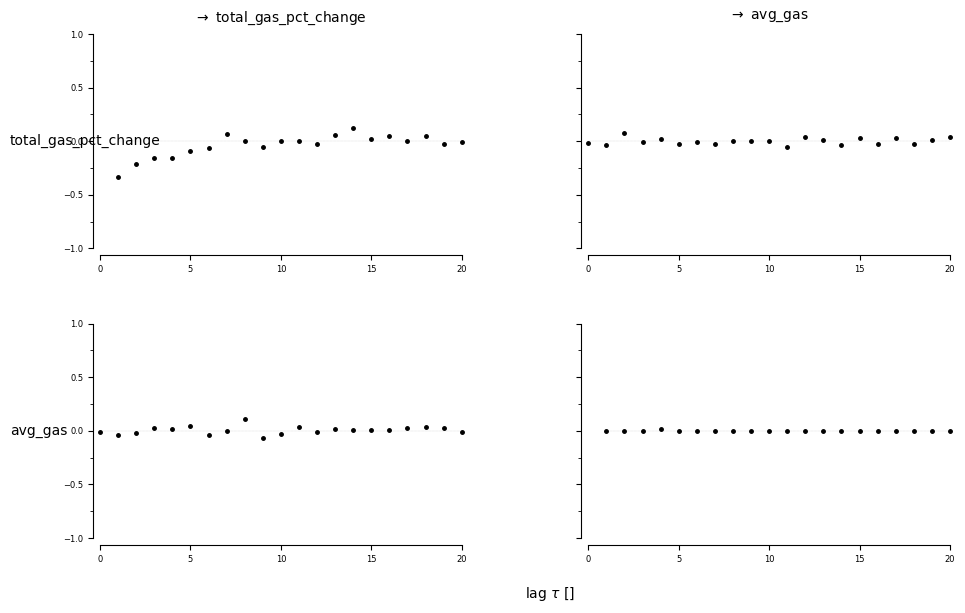


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


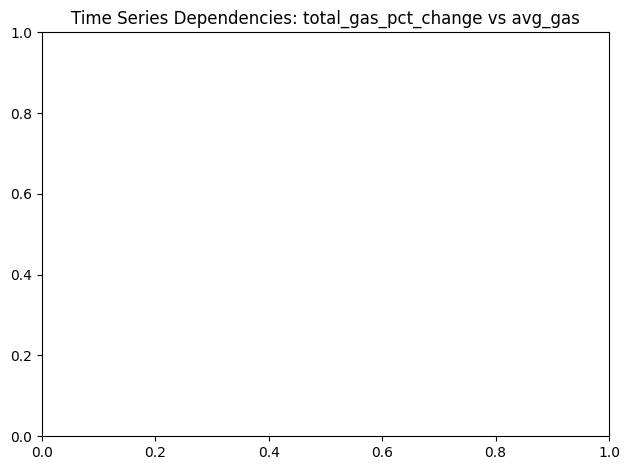

<Figure size 1000x600 with 0 Axes>

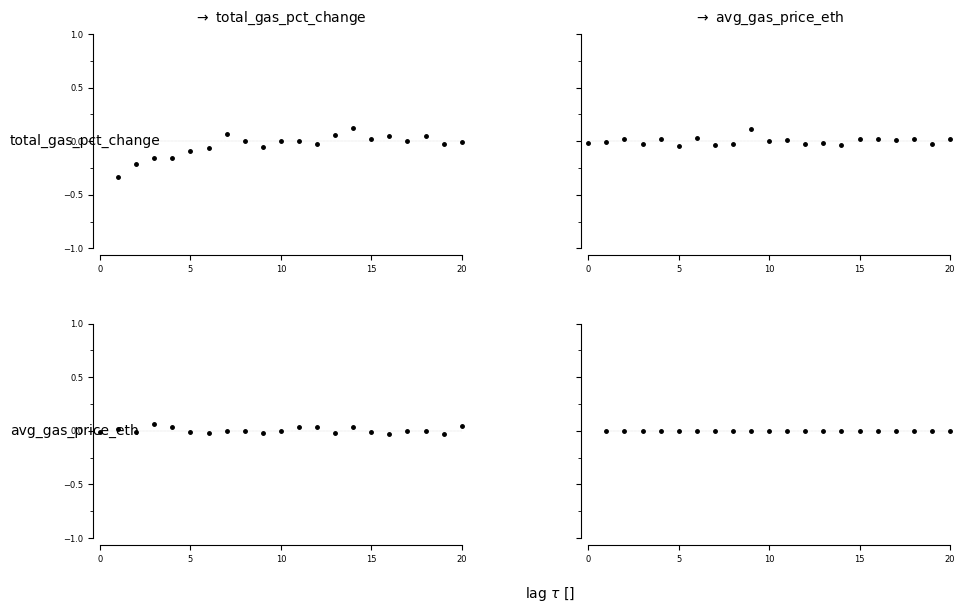


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


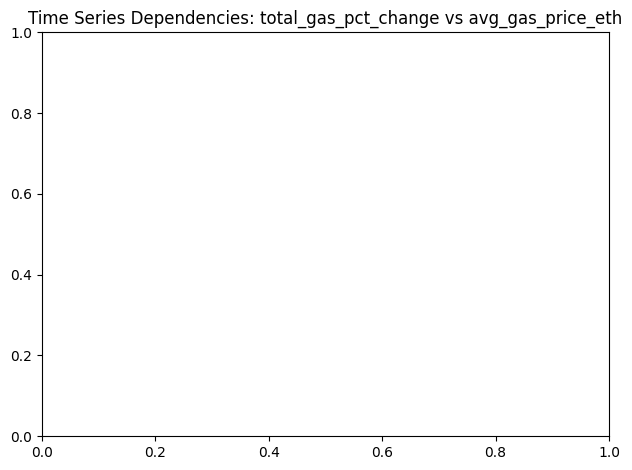

<Figure size 1000x600 with 0 Axes>

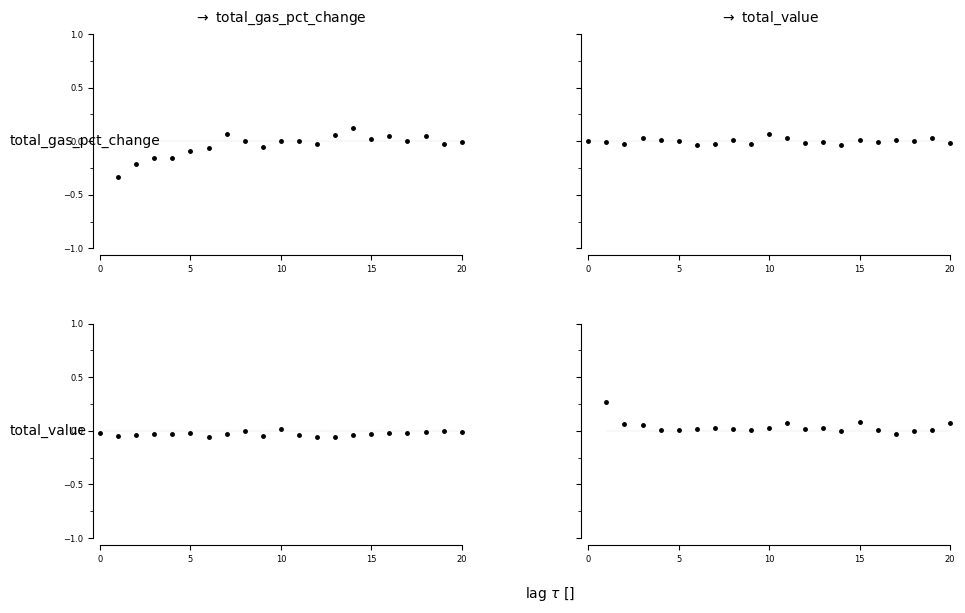


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


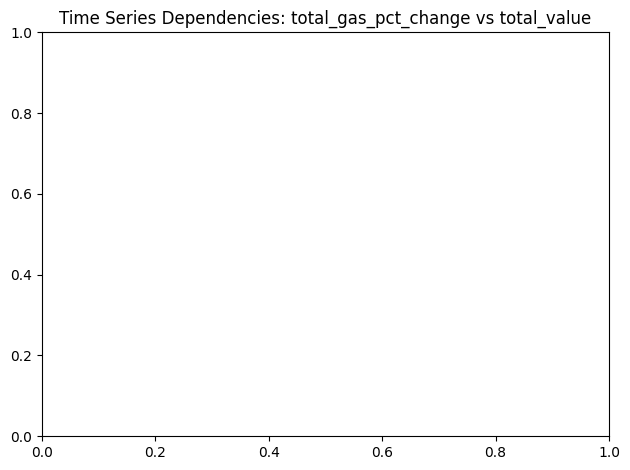

<Figure size 1000x600 with 0 Axes>

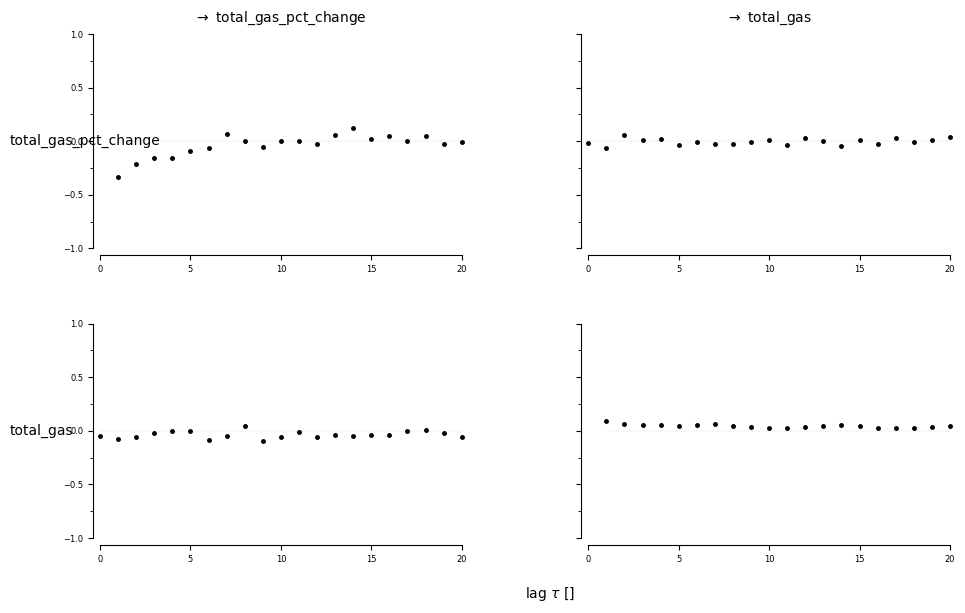


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


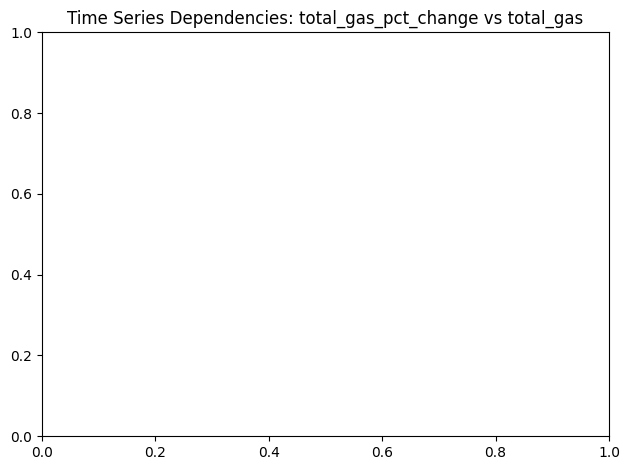

<Figure size 1000x600 with 0 Axes>

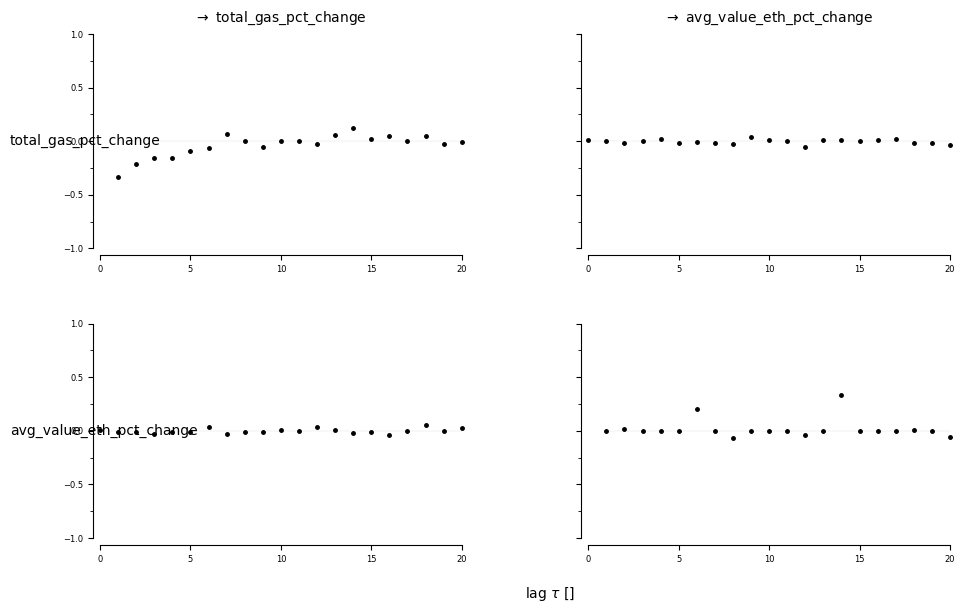


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


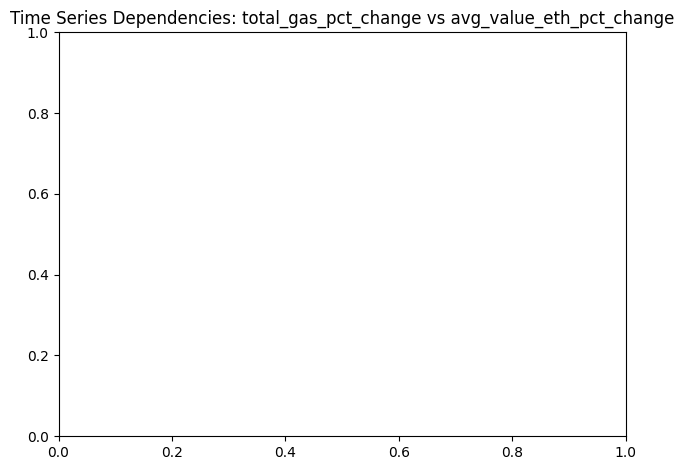

<Figure size 1000x600 with 0 Axes>

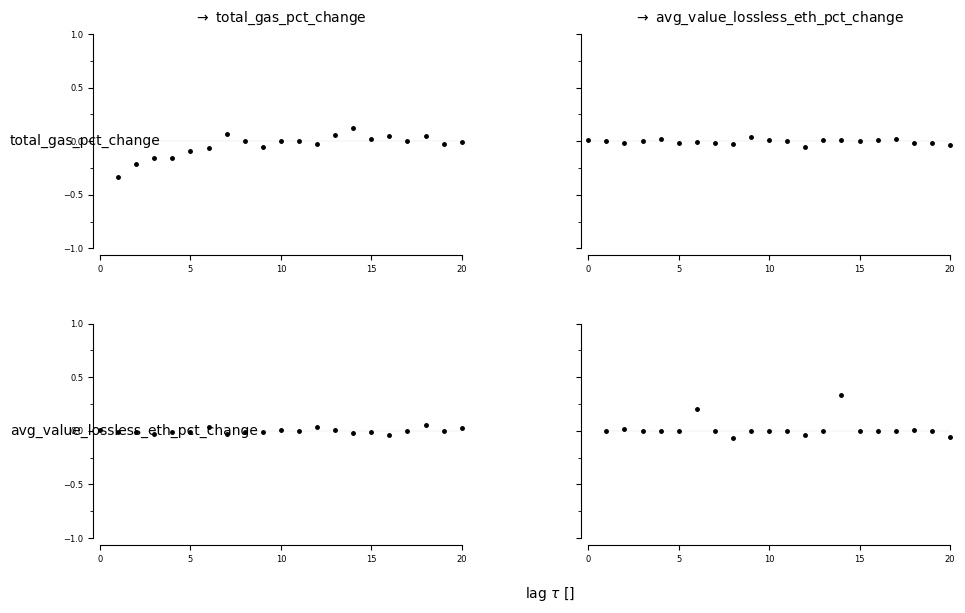


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


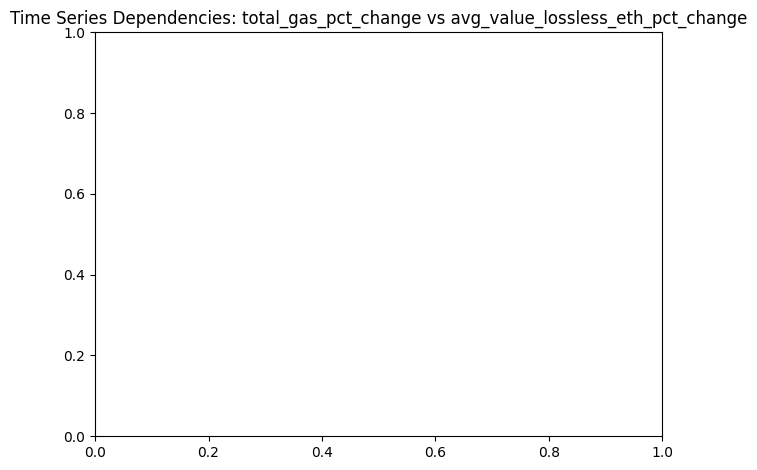

<Figure size 1000x600 with 0 Axes>

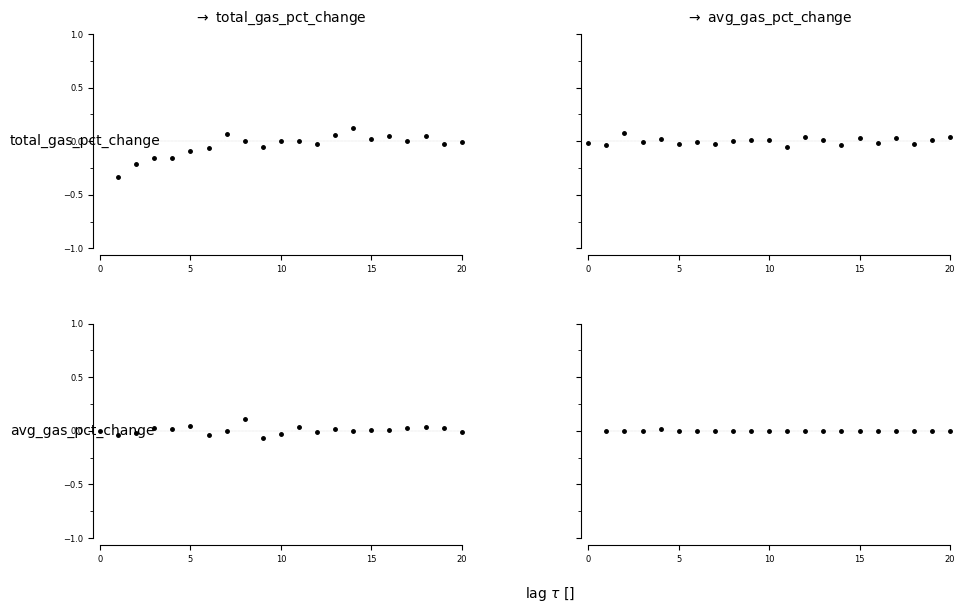


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


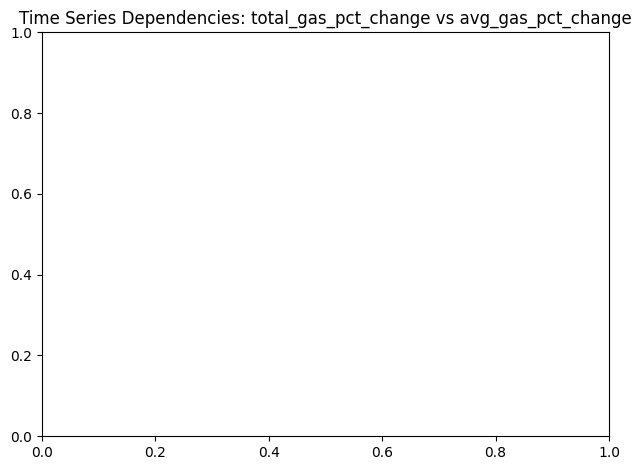

<Figure size 1000x600 with 0 Axes>

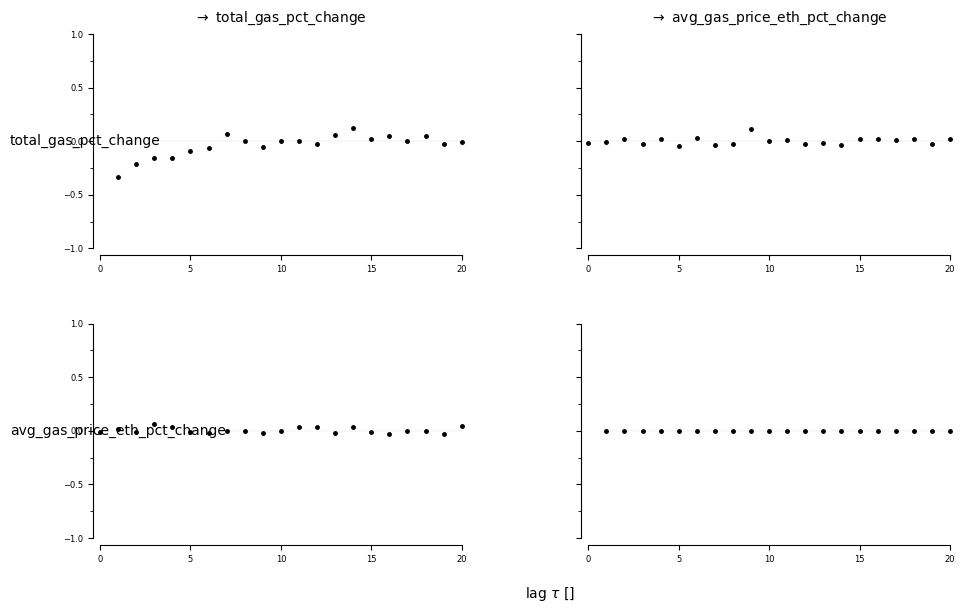


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


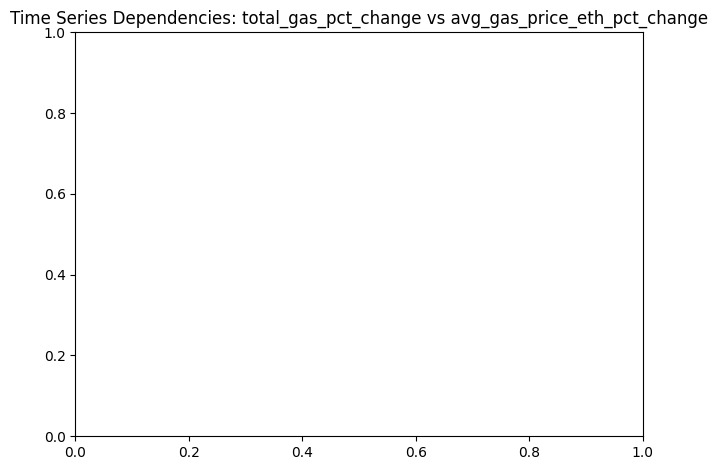

<Figure size 1000x600 with 0 Axes>

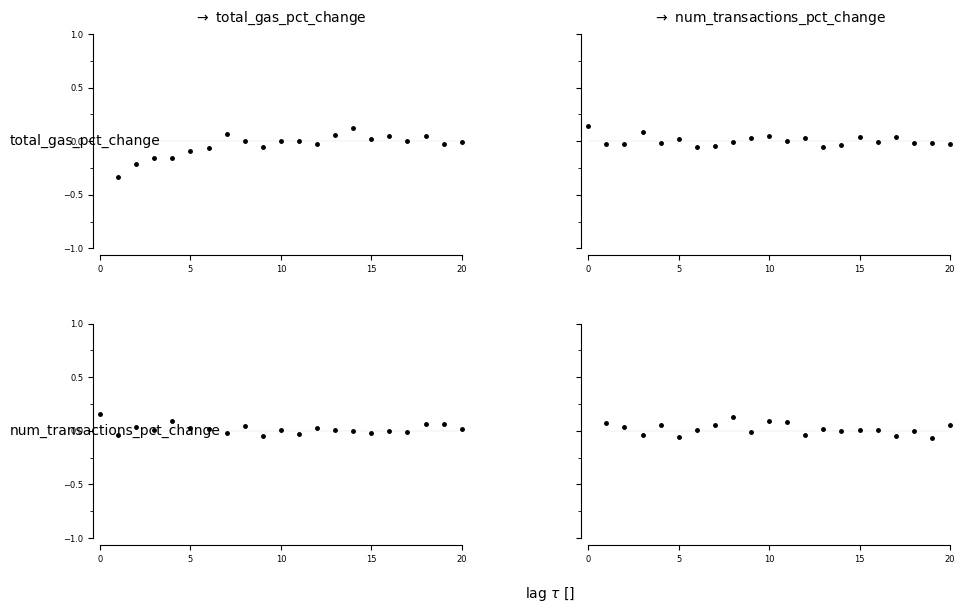


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


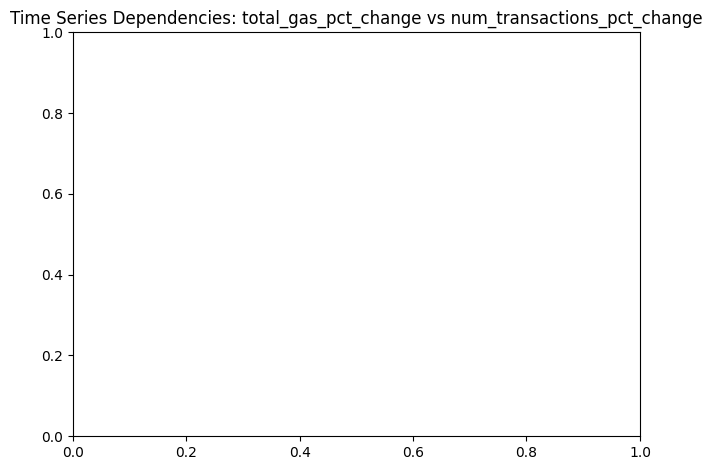

<Figure size 1000x600 with 0 Axes>

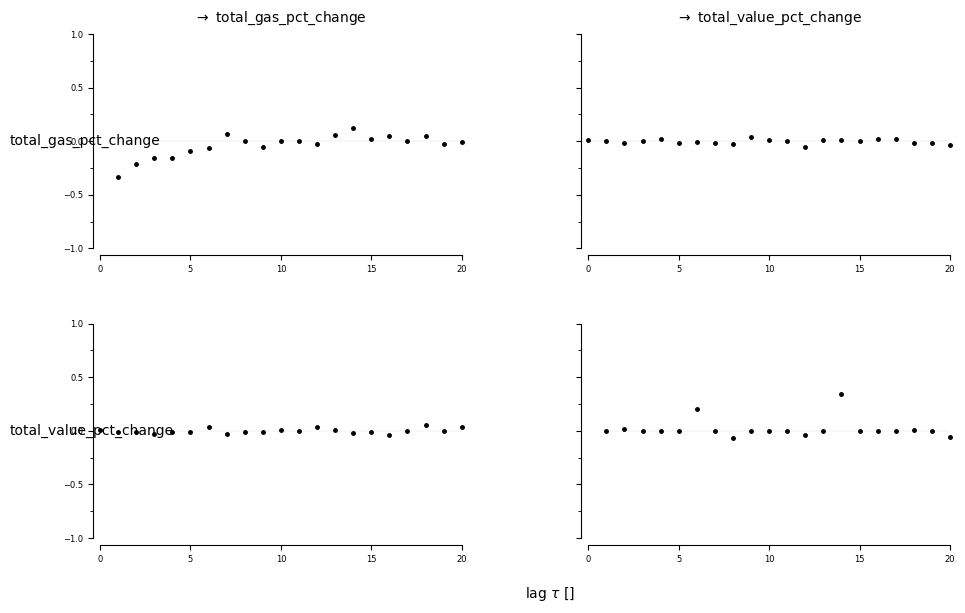


##
## Running Tigramite BivCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 20


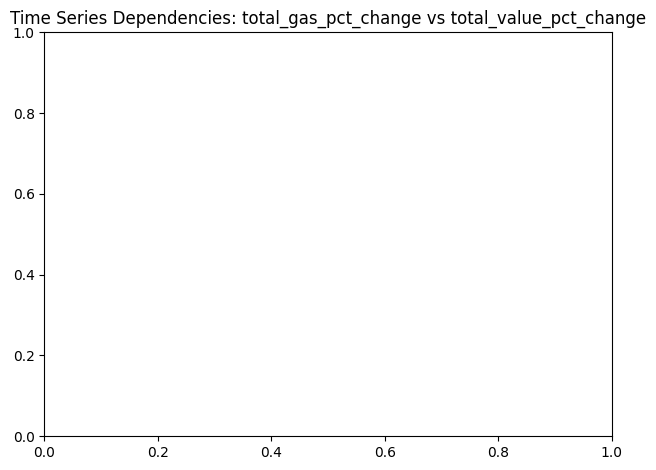

<Figure size 1000x600 with 0 Axes>

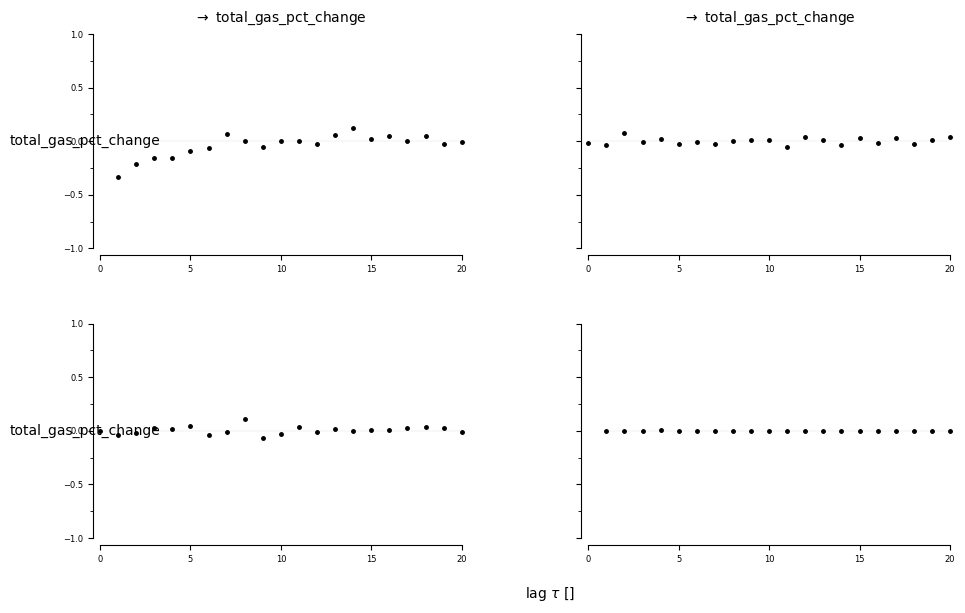

Results for avg_value_eth vs avg_value_eth
[[[ 0.00000000e+00  5.15204650e-01  7.03619272e-02  6.36651335e-02
    1.34289073e-01 -1.94048737e-02  2.11145923e-01 -1.24547759e-01
   -5.54378547e-02  5.46530636e-02  2.94831965e-02 -1.01320545e-01
    1.34277737e-01 -1.71399356e-02 -8.55906422e-02  7.28581215e-02
   -8.14762619e-02  6.42082405e-03 -2.28166161e-02  1.56580937e-02
    4.72811642e-02]
  [ 1.54957009e-01  1.60119958e-01  1.46005002e-01  1.29079309e-01
    1.40274568e-01  1.50418059e-01  1.33362616e-01  1.37713066e-01
    1.16489904e-01  7.84727026e-02  7.66496186e-02  8.17559896e-02
    6.14405971e-02  6.11051370e-02  5.35614280e-02  4.35642301e-02
    3.03636479e-02  4.26690046e-02  4.19507402e-02  4.66307412e-02
    5.50659611e-02]]

 [[ 4.13329946e-02  6.40004862e-02  1.30679010e-02  2.60077341e-02
    5.65693094e-02  5.09758553e-02 -7.58032740e-02 -7.54539968e-02
   -5.09515467e-02  6.67592651e-02  1.44418558e-02  1.66704422e-02
   -7.44622049e-02 -3.17459887e-02  3.992098

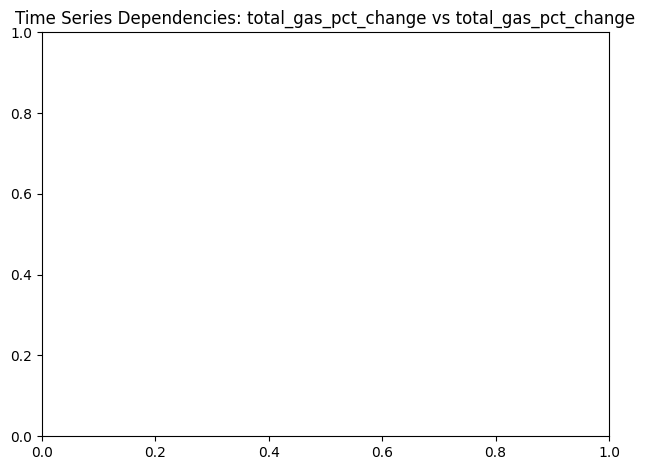

Results for avg_value_eth vs avg_value_lossless_eth
[[[ 0.00000000e+00  5.15204650e-01  7.03619272e-02  6.36651335e-02
    1.34289073e-01 -1.94048737e-02  2.11145923e-01 -1.24547759e-01
   -5.54378547e-02  5.46530636e-02  2.94831965e-02 -1.01320545e-01
    1.34277737e-01 -1.71399356e-02 -8.55906422e-02  7.28581215e-02
   -8.14762619e-02  6.42082405e-03 -2.28166161e-02  1.56580937e-02
    4.72811642e-02]
  [ 1.54957009e-01  1.60119958e-01  1.46005002e-01  1.29079309e-01
    1.40274568e-01  1.50418059e-01  1.33362616e-01  1.37713066e-01
    1.16489904e-01  7.84727026e-02  7.66496186e-02  8.17559896e-02
    6.14405971e-02  6.11051370e-02  5.35614280e-02  4.35642301e-02
    3.03636479e-02  4.26690046e-02  4.19507402e-02  4.66307412e-02
    5.50659611e-02]]

 [[ 4.13329946e-02  6.40004862e-02  1.30679010e-02  2.60077341e-02
    5.65693094e-02  5.09758553e-02 -7.58032740e-02 -7.54539968e-02
   -5.09515467e-02  6.67592651e-02  1.44418558e-02  1.66704422e-02
   -7.44622049e-02 -3.17459887e-02 

In [33]:
from utils import analyze_multiple_timeseries_dependencies
# # For lag function analysis
# correlations, fig = analyze_multiple_timeseries_dependencies(
#     df_arbitrum, df_mainnet,
#     cols1=cols_main, cols2=cols_arb,
#     tau_max=200
# )
# plt.show()

# # For network visualization
# correlations, fig = plot_dependency_network(
#     df_arbitrum, df_mainnet,
#     col1='total_gas_pct', col2='total_gas_pct',
#     name1='Arbitrum', name2='Mainnet'
# )
# plt.show()

results = analyze_multiple_timeseries_dependencies(
    df_mainnet, df_arbitrum, 
    cols1=cols_main, 
    cols2=cols_arb, 
    tau_max=20
)

# Access correlations and plots
for pair, (correlations, fig) in results.items():
    print(f"Results for {pair}")
    print(correlations)
    plt.show(fig)


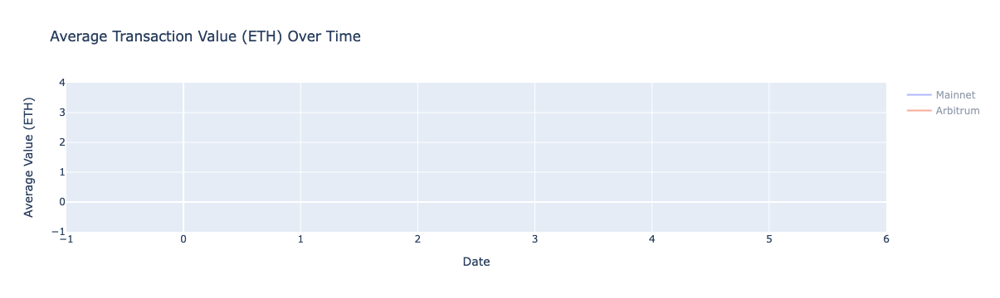

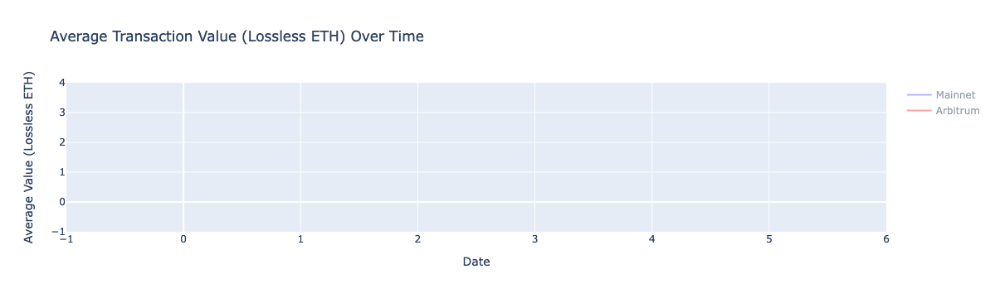

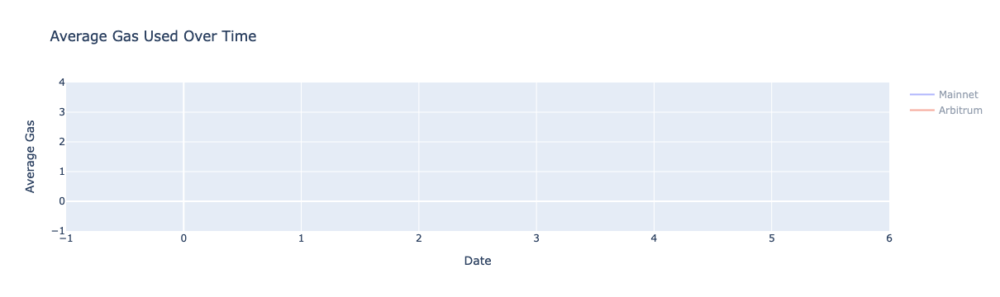

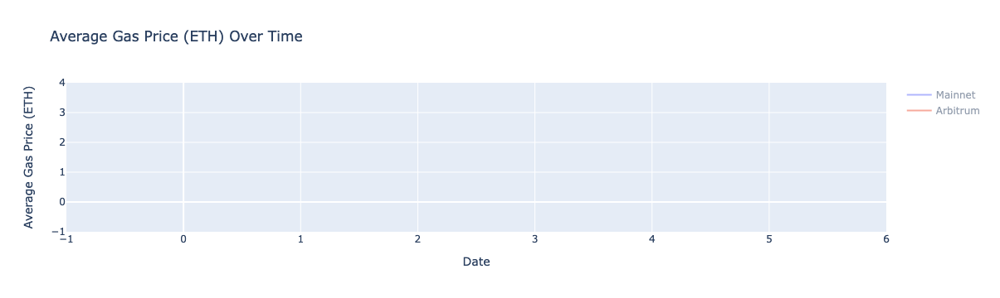

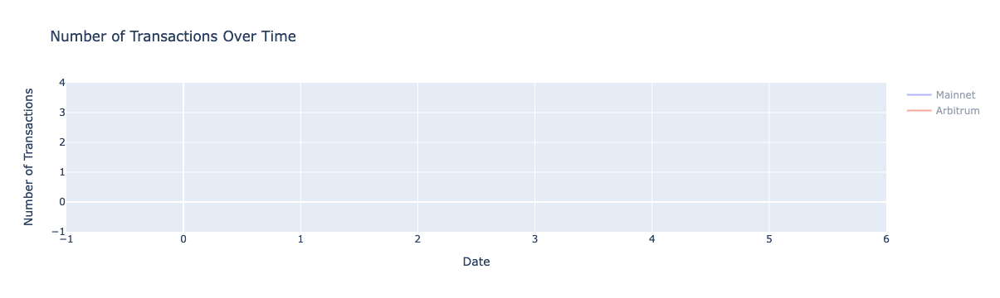

In [14]:
import plotly.graph_objs as go

# 1. Average Transaction Value (ETH) Over Time
fig1 = go.Figure()
fig1.add_trace(go.Scatter(x=df_mainnet.index, y=df_mainnet['avg_value_eth'], mode='lines', name='Mainnet', visible='legendonly'))
fig1.add_trace(go.Scatter(x=df_arbitrum.index, y=df_arbitrum['avg_value_eth'], mode='lines', name='Arbitrum', visible='legendonly'))
fig1.update_layout(title="Average Transaction Value (ETH) Over Time", xaxis_title="Date", yaxis_title="Average Value (ETH)")
fig1.show()

# 2. Average Transaction Value (Lossless ETH) Over Time
fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=df_mainnet.index, y=df_mainnet['avg_value_lossless_eth'], mode='lines', name='Mainnet', visible='legendonly'))
fig2.add_trace(go.Scatter(x=df_arbitrum.index, y=df_arbitrum['avg_value_lossless_eth'], mode='lines', name='Arbitrum', visible='legendonly'))
fig2.update_layout(title="Average Transaction Value (Lossless ETH) Over Time", xaxis_title="Date", yaxis_title="Average Value (Lossless ETH)")
fig2.show()

# 3. Average Gas Used Over Time
fig3 = go.Figure()
fig3.add_trace(go.Scatter(x=df_mainnet.index, y=df_mainnet['avg_gas'], mode='lines', name='Mainnet', visible='legendonly'))
fig3.add_trace(go.Scatter(x=df_arbitrum.index, y=df_arbitrum['avg_gas'], mode='lines', name='Arbitrum', visible='legendonly'))
fig3.update_layout(title="Average Gas Used Over Time", xaxis_title="Date", yaxis_title="Average Gas")
fig3.show()

# 4. Average Gas Price (ETH) Over Time
fig4 = go.Figure()
fig4.add_trace(go.Scatter(x=df_mainnet.index, y=df_mainnet['avg_gas_price_eth'], mode='lines', name='Mainnet', visible='legendonly'))
fig4.add_trace(go.Scatter(x=df_arbitrum.index, y=df_arbitrum['avg_gas_price_eth'], mode='lines', name='Arbitrum', visible='legendonly'))
fig4.update_layout(title="Average Gas Price (ETH) Over Time", xaxis_title="Date", yaxis_title="Average Gas Price (ETH)")
fig4.show()

# 5. Number of Transactions Over Time
fig5 = go.Figure()
fig5.add_trace(go.Scatter(x=df_mainnet.index, y=df_mainnet['num_transactions'], mode='lines', name='Mainnet', visible='legendonly'))
fig5.add_trace(go.Scatter(x=df_arbitrum.index, y=df_arbitrum['num_transactions'], mode='lines', name='Arbitrum', visible='legendonly'))
fig5.update_layout(title="Number of Transactions Over Time", xaxis_title="Date", yaxis_title="Number of Transactions")
fig5.show()


In [15]:
from scipy.stats import pearsonr

def test_correlation(df_mainnet, df_arbitrum, column_mainnet, column_arbitrum, alpha=0.05):
    # Ensure 'date' is set as the index for both DataFrames
    if df_mainnet.index.name != 'date':
        df_mainnet = df_mainnet.set_index('date')
    if df_arbitrum.index.name != 'date':
        df_arbitrum = df_arbitrum.set_index('date')
    
    # Merge DataFrames on 'date' index, keeping only matching dates
    df_merged = df_mainnet[[column_mainnet]].join(df_arbitrum[[column_arbitrum]], 
                                                  lsuffix='_mainnet', rsuffix='_arbitrum', 
                                                  how='inner')
    
    # Calculate the correlation and p-value
    correlation, p_value = pearsonr(df_merged[f"{column_mainnet}_mainnet"], df_merged[f"{column_arbitrum}_arbitrum"])
    
    # Print results
    print(f"Testing correlation between {column_mainnet} (mainnet) and {column_arbitrum} (arbitrum)")
    print(f"Correlation coefficient: {correlation}")
    print(f"p-value: {p_value}")
    
    # Hypothesis test result
    if p_value < alpha:
        print("Reject the null hypothesis: The correlation is significantly different from 0.")
    else:
        print("Fail to reject the null hypothesis: The correlation is not significantly different from 0.")



In [16]:
# Example usage:
test_correlation(df_mainnet, df_arbitrum, 'total_gas', 'total_gas')
# test_correlation(df_mainnet, df_arbitrum, 'avg_gas', 'avg_gas')


Testing correlation between total_gas (mainnet) and total_gas (arbitrum)
Correlation coefficient: 0.333754821673175
p-value: 3.457039672164204e-34
Reject the null hypothesis: The correlation is significantly different from 0.


In [19]:
import numpy as np
from tigramite.data_processing import DataFrame
from tigramite.pcmci import PCMCI
from tigramite.independence_tests.parcorr import ParCorr

def run_pcmci(df_mainnet, df_arbitrum, column_mainnet, column_arbitrum, tau_max=3, alpha=0.05):
    """
    Runs the PCMCI algorithm on two specified columns from df_mainnet and df_arbitrum.

    Parameters:
        df_mainnet (pd.DataFrame): DataFrame containing mainnet data.
        df_arbitrum (pd.DataFrame): DataFrame containing arbitrum data.
        column_mainnet (str): Column name from df_mainnet.
        column_arbitrum (str): Column name from df_arbitrum.
        tau_max (int): Maximum time lag to consider for PCMCI.
        alpha (float): Significance level for detecting causal links.

    Returns:
        dict: Dictionary with significant links and their lag information.
    """
    # Ensure 'date' is set as the index
    if df_mainnet.index.name != 'date':
        df_mainnet = df_mainnet.set_index('date')
    if df_arbitrum.index.name != 'date':
        df_arbitrum = df_arbitrum.set_index('date')

    # Align DataFrames on 'date' index
    aligned = df_mainnet[[column_mainnet]].join(df_arbitrum[[column_arbitrum]], 
                                                lsuffix='_mainnet', rsuffix='_arbitrum', 
                                                how='inner')

    # Convert aligned columns to a NumPy array for Tigramite
    combined_data = aligned.values

    # Convert the combined data to a Tigramite DataFrame
    tigramite_dataframe = DataFrame(combined_data)

    # Initialize PCMCI with partial correlation test
    pcmci = PCMCI(dataframe=tigramite_dataframe, cond_ind_test=ParCorr(), verbosity=1)

    # Run PCMCI algorithm
    results = pcmci.run_pcmci(tau_max=tau_max, pc_alpha=None)

    # Extract significant links
    p_matrix = results['p_matrix']
    val_matrix = results['val_matrix']

    significant_links = {}
    for i in range(len(combined_data[0])):  # Iterate over variables
        for j in range(len(combined_data[0])):  # Iterate over variables
            for lag in range(1, tau_max + 1):  # Iterate over lags
                if p_matrix[i, j, lag - 1] < alpha:  # Check significance
                    significant_links[(i, j, lag)] = val_matrix[i, j, lag - 1]

    print("Significant causal links:")
    for link, strength in significant_links.items():
        print(f"Variable {link[0]} -> Variable {link[1]} at lag {link[2]} with strength {strength}")

    return significant_links

# Example usage:
# results = run_pcmci(df_mainnet, df_arbitrum, 'total_value', 'total_gas')


In [20]:
# Example usage:
results = run_pcmci(df_mainnet, df_arbitrum, 'total_gas', 'total_gas')


##
## Step 1: PC1 algorithm for selecting lagged conditions
##

Parameters:
independence test = par_corr
tau_min = 1
tau_max = 3
pc_alpha = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
max_conds_dim = None
max_combinations = 1



## Resulting lagged parent (super)sets:

    Variable 0 has 2 link(s):
    [pc_alpha = 0.05]
        (0 -1): max_pval = 0.00000, |min_val| =  0.627
        (0 -3): max_pval = 0.00000, |min_val| =  0.210

    Variable 1 has 4 link(s):
    [pc_alpha = 0.05]
        (1 -1): max_pval = 0.00000, |min_val| =  0.162
        (1 -2): max_pval = 0.00001, |min_val| =  0.126
        (1 -3): max_pval = 0.00001, |min_val| =  0.125
        (0 -2): max_pval = 0.00756, |min_val| =  0.075

##
## Step 2: MCI algorithm
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 3
max_conds_py = None
max_conds_px = None

## Significant links at alpha = 0.05:

    Variable 0 has 3 link(s):
        (0 -1): pval = 0.00000 | val =  0.610
        (0 -3): pval = 0.01230 | val =  0.071
     

In [21]:
results

{(0, 0, 2): 0.6095076411031277,
 (0, 1, 1): 0.06061666345723369,
 (1, 0, 1): 0.06061666345723369,
 (1, 1, 2): 0.1471596462580727,
 (1, 1, 3): 0.10188206269820863}

In [53]:
cols_main = [
    # 'avg_value_eth',
 # 'avg_value_lossless_eth',
 # 'avg_gas_price_eth',
 # 'avg_value_eth_pct_change',
 # 'avg_value_lossless_eth_pct_change',
 # 'avg_gas_pct_change',
 # 'avg_gas_price_eth_pct_change',
 'num_transactions_pct_change',
 'total_value_pct_change',
 'total_gas_pct_change']

cols_arb = [
 #    'avg_value_eth',
 # 'avg_value_lossless_eth',
 # 'avg_gas',
 # 'avg_gas_price_eth',
 # 'total_value',
 # 'total_gas',
 # 'avg_value_eth_pct_change',
 # 'avg_value_lossless_eth_pct_change',
 # 'avg_gas_pct_change',
 # 'avg_gas_price_eth_pct_change',
 'num_transactions_pct_change',
 'total_value_pct_change',
 'total_gas_pct_change'
           ]

In [62]:
import numpy as np
from tigramite import data_processing as pp
from tigramite import lpcmci
from tigramite.independence_tests.parcorr import ParCorr

# Align DataFrames on their dates with the selected columns
aligned = df_mainnet[cols_main].join(df_arbitrum[cols_arb], 
                                     lsuffix='_mainnet', 
                                     rsuffix='_arbitrum', 
                                     how='inner')

# Drop any rows with NaN values
aligned = aligned.dropna()

# Generate variable names
var_names = [f"{col}_mainnet" for col in cols_main] + [f"{col}_arbitrum" for col in cols_arb]

# Now create Tigramite DataFrame
dataframe = pp.DataFrame(
    data=aligned.values,
    var_names=var_names
)

# Initialize LPCMCI with partial correlation test
pcmci = lpcmci.LPCMCI(
    dataframe=dataframe,
    cond_ind_test=ParCorr(),
    verbosity=1
)

# Run LPCMCI
results = pcmci.run_lpcmci(
    tau_max=2,           # Maximum time lag to test
    pc_alpha=0.05,         # Significance level for tests
)

# Output the results
print("LPCMCI Results:")
print(results)



Starting preliminary phase  1

Starting test phase

p = 0
(3,-2) independent (3, 0) given () union set()
(4,-2) independent (4, 0) given () union set()
(4,-1) independent (4, 0) given () union set()
(5,-2) independent (5, 0) given () union set()
(5,-1) independent (5, 0) given () union set()
Writing:   (3,-2) oL> (3, 0) ==> (3,-2)     (3, 0) 
Writing:   (4,-2) oL> (4, 0) ==> (4,-2)     (4, 0) 
Writing:   (4,-1) oL> (4, 0) ==> (4,-1)     (4, 0) 
Writing:   (5,-2) oL> (5, 0) ==> (5,-2)     (5, 0) 
Writing:   (5,-1) oL> (5, 0) ==> (5,-1)     (5, 0) 
(0, 0) independent (3, 0) given () union set()
(0, 0) independent (3, 0) given () union set()
(0, 0) independent (4, 0) given () union set()
(0, 0) independent (4, 0) given () union set()
(0, 0) independent (5, 0) given () union set()
(0, 0) independent (5, 0) given () union set()
(1, 0) independent (4, 0) given () union set()
(1, 0) independent (4, 0) given () union set()
(1, 0) independent (5, 0) given () union set()
(1, 0) independent (5, 

In [65]:
print(dataframe.var_names)

['num_transactions_pct_change_mainnet', 'total_value_pct_change_mainnet', 'total_gas_pct_change_mainnet', 'num_transactions_pct_change_arbitrum', 'total_value_pct_change_arbitrum', 'total_gas_pct_change_arbitrum']


In [52]:
from tigramite import data_processing as pp
from tigramite import lpcmci
from tigramite.independence_tests.parcorr import ParCorr

# First align DataFrames on their dates
aligned = df_mainnet[['total_gas_pct_change']].join(df_arbitrum[['total_gas_pct_change']], 
                                        lsuffix='_mainnet', 
                                        rsuffix='_arbitrum', 
                                        how='inner')

# Drop any rows with NaN values
aligned = aligned.dropna()

# Now create Tigramite DataFrame
dataframe = pp.DataFrame(
    data=np.array([aligned['total_gas_pct_change_mainnet'].values, 
                   aligned['total_gas_pct_change_arbitrum'].values]).T,
    var_names=['mainnet', 'arbitrum']
)

# Initialize LPCMCI with partial correlation test
pcmci = lpcmci.LPCMCI(
    dataframe=dataframe,
    cond_ind_test=ParCorr(),
    verbosity=1
)

# Run LPCMCI
results = pcmci.run_lpcmci(
    tau_max=20,           # Maximum time lag to test
    pc_alpha=0.05        # Significance level for tests
)


Starting preliminary phase  1

Starting test phase

p = 0
(0,-20) independent (0, 0) given () union set()
(0,-18) independent (0, 0) given () union set()
(0,-17) independent (0, 0) given () union set()
(0,-16) independent (0, 0) given () union set()
(0,-13) independent (0, 0) given () union set()
(0,-11) independent (0, 0) given () union set()
(0,-10) independent (0, 0) given () union set()
(0,-8) independent (0, 0) given () union set()
(0,-6) independent (0, 0) given () union set()
(0,-5) independent (0, 0) given () union set()
(0,-3) independent (0, 0) given () union set()
(1,-20) independent (1, 0) given () union set()
(1,-19) independent (1, 0) given () union set()
(1,-18) independent (1, 0) given () union set()
(1,-17) independent (1, 0) given () union set()
(1,-16) independent (1, 0) given () union set()
(1,-15) independent (1, 0) given () union set()
(1,-14) independent (1, 0) given () union set()
(1,-13) independent (1, 0) given () union set()
(1,-12) independent (1, 0) given 

KeyboardInterrupt: 

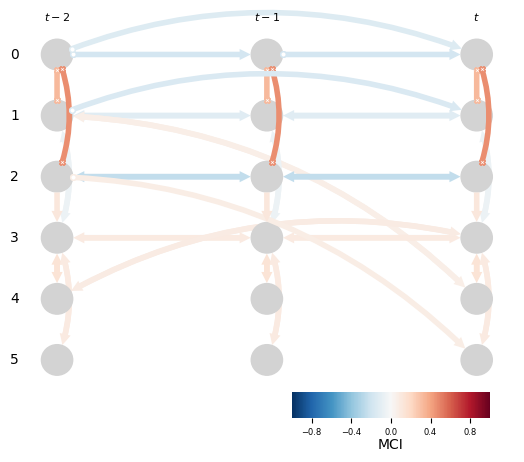

In [64]:
# Plot the learned time series DPAG
from tigramite import plotting as tp
import matplotlib.pyplot as plt

tp.plot_time_series_graph(graph=results['graph'],
                          val_matrix=results['val_matrix'])
plt.show()